In [32]:
from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "all"

import pandas as pd
import numpy as np
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from datetime import datetime

df = pd.read_csv('input/drug_purchase_300K_d.csv', delimiter="|", header=None, parse_dates=[19])
df.columns = ['memberid', 'memberage', 'membergender', 'pharmacyname', 'pharmcity', 'pharmacystate', 'pharmzip', 'pharmlat', 'pharmlong', 'ndc11code', 'drug_productname', 'drug_ahfsclass', 'drug_shortname', 'drug_indication', 'calcawpunitprice', 'drug_qty', 'daysupply', 'calcawpfullprice', 'netplancost', 'filldate']
display(df.info())
display(df.sort_values(['calcawpfullprice'], ascending = [False]).head())



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302195 entries, 0 to 302194
Data columns (total 20 columns):
memberid            302195 non-null int64
memberage           302195 non-null object
membergender        302195 non-null object
pharmacyname        302195 non-null object
pharmcity           302195 non-null object
pharmacystate       302195 non-null object
pharmzip            302195 non-null object
pharmlat            302195 non-null float64
pharmlong           302195 non-null float64
ndc11code           302195 non-null int64
drug_productname    302195 non-null object
drug_ahfsclass      302195 non-null object
drug_shortname      302195 non-null object
drug_indication     302195 non-null object
calcawpunitprice    302195 non-null float64
drug_qty            302195 non-null int64
daysupply           302195 non-null int64
calcawpfullprice    302195 non-null float64
netplancost         302195 non-null float64
filldate            302195 non-null datetime64[ns]
dtypes: datetime64[n

None

,memberid,memberage,membergender,pharmacyname,pharmcity,pharmacystate,pharmzip,pharmlat,pharmlong,ndc11code,drug_productname,drug_ahfsclass,drug_shortname,drug_indication,calcawpunitprice,drug_qty,daysupply,calcawpfullprice,netplancost,filldate
191570,17034026,\N,Not Provided,CVS PHARMACY #,FORT WORTH,TX,76104,32.741100,-97.33751,61958180101,HARVONI TAB 90-400MG,HCV Replication Complex Inhibitors,HARVONI,Hepatitis C,1350.0000,1,28,37800.0000,31469.40,2018-05-17
185825,17034026,\N,Not Provided,CVS PHARMACY #,FORT WORTH,TX,76104,32.741100,-97.33751,61958180101,HARVONI TAB 90-400MG,HCV Replication Complex Inhibitors,HARVONI,Hepatitis C,1350.0000,1,28,37800.0000,29910.33,2018-04-24
178950,18604437,\N,Not Provided,ALLIANCERX WALGREENS PRIME #15438,CANTON,MI,481882227,42.352074,-83.44551,67979000201,SUPPRELIN LA KIT 50MG,Gonadotropins,SUPPRELIN,Precocious Puberty,35377.6406,1,30,35377.6406,26518.04,2018-03-28
50980,19962706,37,M,AETNA SPECIALTY PHARMACY LLC,ORLANDO,FL,32809,28.447746,-81.37076,61958150101,SOVALDI TAB 400MG,HCV Polymerase Inhibitors,SOVALDI,Hepatitis C,1200.0000,1,28,33600.0000,29064.00,2016-12-20
39906,19962706,37,M,AETNA SPECIALTY PHARMACY LLC,ORLANDO,FL,32809,28.447746,-81.37076,61958150101,SOVALDI TAB 400MG,HCV Polymerase Inhibitors,SOVALDI,Hepatitis C,1200.0000,1,28,33600.0000,29064.00,2016-11-16


# Formatting the columns

In [34]:
df[['fillmonth', 'fillyear']] = df['filldate'].apply(lambda x: pd.Series(x.strftime("%Y-%m,%Y").split(",")))

display("Done")

'Done'

In [35]:
import json
from pprint import pprint

indication_types = ["", "INCURABLE", "REPEATABLE"]
gender_types = {
    "Not Provided" : 0, 
    "M" : 1, 
    "F" : 2
}
with open('list_of_db_diseases.json') as f:
    data = json.load(f)

# display(data)

df['lasting_factor'] = df['drug_indication'].map(lambda x: data[x])
df['gender_factor'] = df['membergender'].apply(lambda x: gender_types.get(x))

df.head()

,memberid,memberage,membergender,pharmacyname,pharmcity,pharmacystate,pharmzip,pharmlat,pharmlong,ndc11code,...,calcawpunitprice,drug_qty,daysupply,calcawpfullprice,netplancost,filldate,fillmonth,fillyear,lasting_factor,gender_factor
0,19957572,51,F,WALGREENS #7853,LUBBOCK,TX,79424,33.577860,-101.855170,555088702,...,0.9415,1,30,28.2450,0.00,2016-07-03,2016-07,2016,1,2
1,19963186,28,F,WALMART PHARMACY 10-5672,LUCAS,TX,75002,33.085630,-96.615590,555903458,...,1.6013,6,28,44.8350,30.62,2016-07-03,2016-07,2016,4,2
2,19957332,47,F,HEB PHARMACY,MCALLEN,TX,785047705,26.268385,-98.221130,52544024828,...,1.4043,6,28,39.3200,8.00,2016-07-03,2016-07,2016,4,2
3,19960802,52,F,MEIJER PHARMACY #042,SAGINAW,MI,48603,43.416073,-84.078835,60505014601,...,7.3964,1,30,221.8920,7.54,2016-07-03,2016-07,2016,1,2
4,19957635,44,F,CVS PHARMACY,MUNCY,PA,17756,41.198414,-76.728300,68462039429,...,1.1083,3,28,31.0333,20.79,2016-07-03,2016-07,2016,4,2


In [36]:

df_2 = df[df['memberage']!= '\\N']
# display(df_2.info())
df_2['memberage'] = df_2['memberage'].astype('str').astype('int64')
df_2['gender_factor'] = df_2['gender_factor'].astype('str').astype('int64')
df_2['lasting_factor'] = df_2['lasting_factor'].astype('str').astype('int64')

df_2['pharmzip'] = df_2['pharmzip'].apply(lambda x: x if x.isdigit() else 0)
df_2['pharmzip'] = df_2['pharmzip'].astype('str').astype('int64')
# display(df_2.dtypes)

df_2['state'] = df_2['pharmacystate'].factorize()[0]
state_df_2 = df_2[['pharmacystate', 'state']].drop_duplicates().sort_values('state')
# pharmacystate_to_state = dict(state_df_2.values)
# state_to_pharmacystate = dict(state_df_2[['state', 'pharmacystate']].values)

# pharmacystate_to_state

display(df_2.info())

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .

<class 'pandas.core.frame.DataFrame'>
Int64Index: 107000 entries, 0 to 248509
Data columns (total 25 columns):
memberid            107000 non-null int64
memberage           107000 non-null int64
membergender        107000 non-null object
pharmacyname        107000 non-null object
pharmcity           107000 non-null object
pharmacystate       107000 non-null object
pharmzip            107000 non-null int64
pharmlat            107000 non-null float64
pharmlong           107000 non-null float64
ndc11code           107000 non-null int64
drug_productname    107000 non-null object
drug_ahfsclass      107000 non-null object
drug_shortname      107000 non-null object
drug_indication     107000 non-null object
calcawpunitprice    107000 non-null float64
drug_qty            107000 non-null int64
daysupply           107000 non-null int64
calcawpfullprice    107000 non-null float64
netplancost         107000 non-null float64
filldate            107000 non-null datetime64[ns]
fillmonth           10

None

# All Groupby data

In [37]:
df.groupby(['drug_indication', 'fillmonth'])['daysupply'] \
    .sum() \
    .reset_index(name='sum') \
    .sort_values(['drug_indication','fillmonth','sum'], ascending=[True, False, False]) \
    .groupby('drug_indication').head(10)

,drug_indication,fillmonth,sum
38,ADHD,2018-12,9286
37,ADHD,2018-11,9658
36,ADHD,2018-10,10500
35,ADHD,2018-09,9721
34,ADHD,2018-08,10007
33,ADHD,2018-07,8664
32,ADHD,2018-06,9097
31,ADHD,2018-05,9664
30,ADHD,2018-04,10540
29,ADHD,2018-03,9866


In [39]:
data = pd.DataFrame({'sum' : df.groupby([ 'fillmonth', 'memberid'])['daysupply'].sum()}).reset_index()
data.head()

,fillmonth,memberid,sum
0,2015-03,19957510,28
1,2015-03,19964041,30
2,2015-04,19957510,68
3,2015-04,19959011,58
4,2015-04,19964041,30


In [40]:
df.groupby(['fillmonth', 'drug_indication'])['daysupply'] \
    .sum() \
    .reset_index(name='sum') \
    .sort_values(['fillmonth','sum','drug_indication'], ascending=[True, False, False]) \
    .groupby('fillmonth').head(10)

,fillmonth,drug_indication,sum
1,2015-03,Thyroid Treatment,30
0,2015-03,Bacterial Infection,28
2,2015-04,Bacterial Infection,38
6,2015-04,Thyroid Treatment,30
5,2015-04,Schizophrenia,30
3,2015-04,Cold,30
4,2015-04,Depression,28
9,2015-05,Seizures,30
8,2015-05,Schizophrenia,30
7,2015-05,Parenteral Supplies,30


In [ ]:
df.groupby(['memberid', 'fillmonth', 'drug_indication'])['daysupply'] \
    .sum() \
    .reset_index(name='sum') \
    .sort_values(['memberid','fillmonth','sum','drug_indication'], ascending=[True, True, False, False]) \
    .groupby('memberid').head(100)

In [83]:
df.groupby(['memberid', 'fillmonth'])['daysupply'] \
    .sum() \
    .reset_index(name='sum') \
    .sort_values(['memberid','fillmonth','sum'], ascending=[True, True, False]) \
    .groupby('memberid').head(100)

,memberid,fillmonth,sum
0,12292147,2016-01-01,264
1,12292147,2016-02-01,527
2,12292147,2016-03-01,471
3,12292147,2016-04-01,444
4,12292147,2016-05-01,335
5,12292147,2016-06-01,350
6,12292147,2016-07-01,409
7,12292147,2016-08-01,584
8,12292147,2016-09-01,300
9,12292147,2016-10-01,399


# Display all member drug data

In [41]:
grouped_df = df.groupby(['memberid', 'drug_indication', 'fillmonth'])['netplancost'] \
    .sum() \
    .reset_index(name='sum') \
    .sort_values(['memberid','drug_indication','fillmonth', 'sum'], ascending=[True,False, False, False]) \
    .groupby('memberid')

for key, item in grouped_df:
    print(grouped_df.get_group(key), "\n\n")

     memberid          drug_indication fillmonth      sum
134  12292147                 Vitamins   2016-07    13.10
133  12292147                 Vitamins   2016-05    11.18
132  12292147                 Vitamins   2016-02    13.10
131  12292147                    Ulcer   2016-12   408.98
130  12292147                    Ulcer   2016-11     8.25
129  12292147                    Ulcer   2016-10     7.55
128  12292147                    Ulcer   2016-09     7.55
127  12292147                    Ulcer   2016-08     7.55
126  12292147                    Ulcer   2016-07     7.55
125  12292147                    Ulcer   2016-06     5.21
124  12292147                    Ulcer   2016-05    12.76
123  12292147                    Ulcer   2016-04     7.55
122  12292147                    Ulcer   2016-03     0.00
121  12292147                    Ulcer   2016-02     0.00
120  12292147                    Ulcer   2016-01     0.00
119  12292147  Topical Corticosteroids   2016-08     0.00
118  12292147 

      memberid   drug_indication fillmonth    sum
1933  16834968             Ulcer   2018-10   0.00
1932  16834968             Ulcer   2018-07   0.00
1931  16834968             Ulcer   2018-05   0.00
1930  16834968             Ulcer   2018-01   0.00
1929  16834968             Ulcer   2017-10   0.00
1928  16834968             Ulcer   2017-08   0.00
1927  16834968             Ulcer   2017-04   0.00
1926  16834968             Ulcer   2017-01   0.00
1925  16834968      Hypertension   2018-10  10.00
1924  16834968      Hypertension   2018-07  10.00
1923  16834968      Hypertension   2018-05  10.00
1922  16834968      Hypertension   2018-01  10.00
1921  16834968      Hypertension   2017-10  10.00
1920  16834968      Hypertension   2017-08   8.00
1919  16834968      Hypertension   2017-04   8.00
1918  16834968  High Cholesterol   2017-04  15.64
1917  16834968          Diabetes   2018-08   4.96
1916  16834968          Diabetes   2018-02  38.38
1915  16834968          Diabetes   2017-11  39.56


      memberid     drug_indication fillmonth    sum
3296  16835006  Cough/Cold/Allergy   2018-11   0.00
3295  16835006       Contraception   2018-12  14.71
3294  16835006       Contraception   2018-11  14.71
3293  16835006       Contraception   2018-10  29.42
3292  16835006       Contraception   2018-09  14.71
3291  16835006       Contraception   2018-08  14.71
3290  16835006       Contraception   2018-07  14.71
3289  16835006       Contraception   2018-06  10.64
3288  16835006       Contraception   2018-05  10.64
3287  16835006       Contraception   2018-04  12.58
3286  16835006       Contraception   2018-03   9.77
3285  16835006       Contraception   2018-02   9.77
3284  16835006       Contraception   2018-01   9.77
3283  16835006       Contraception   2017-12  11.88
3282  16835006       Contraception   2017-11  11.88
3281  16835006       Contraception   2017-10  11.88
3280  16835006       Contraception   2017-09  16.53
3279  16835006       Contraception   2017-08  16.53
3278  168350

      memberid      drug_indication fillmonth      sum
4745  16835044    Thyroid Treatment   2018-12     7.24
4744  16835044    Thyroid Treatment   2018-11     7.24
4743  16835044    Thyroid Treatment   2018-10     7.24
4742  16835044    Thyroid Treatment   2018-09     7.32
4741  16835044    Thyroid Treatment   2018-08     7.32
4740  16835044    Thyroid Treatment   2018-07     7.32
4739  16835044    Thyroid Treatment   2018-06     7.32
4738  16835044    Thyroid Treatment   2018-05     7.32
4737  16835044    Thyroid Treatment   2018-04     7.32
4736  16835044    Thyroid Treatment   2018-03     0.00
4735  16835044    Thyroid Treatment   2018-02     0.00
4734  16835044    Thyroid Treatment   2018-01     0.00
4733  16835044    Thyroid Treatment   2017-09    22.74
4732  16835044    Thyroid Treatment   2017-06    22.74
4731  16835044    Thyroid Treatment   2017-02     0.00
4730  16835044         Hypertension   2018-08    20.03
4729  16835044         Hypertension   2018-05    15.21
4728  1683

      memberid      drug_indication fillmonth     sum
6239  16835078             Vitamins   2018-03    0.00
6238  16835078             Vitamins   2018-02    0.00
6237  16835078                Ulcer   2017-11    4.80
6236  16835078                Ulcer   2017-05    4.80
6235  16835078             Seizures   2017-02    0.00
6234  16835078      Nausea/Vomiting   2018-02    0.00
6233  16835078      Nausea/Vomiting   2017-02    0.00
6232  16835078      Muscle Relaxant   2018-07    7.89
6231  16835078      Muscle Relaxant   2017-10    3.18
6230  16835078      Muscle Relaxant   2017-08    3.92
6229  16835078      Muscle Relaxant   2017-05    3.92
6228  16835078      Muscle Relaxant   2017-01    0.00
6227  16835078         Inflammation   2017-10    2.23
6226  16835078     Gastrointestinal   2018-07    0.00
6225  16835078     Gastrointestinal   2018-01    0.00
6224  16835078     Gastrointestinal   2017-08  284.06
6223  16835078     Gastrointestinal   2017-07  284.06
6222  16835078     Gastroint

      memberid      drug_indication fillmonth    sum
7979  16835114           Depression   2018-12   0.00
7978  16835114           Depression   2018-11   0.00
7977  16835114           Depression   2018-10   0.00
7976  16835114           Depression   2018-08   0.00
7975  16835114           Depression   2018-07   0.00
7974  16835114           Depression   2018-05   0.00
7973  16835114           Depression   2018-04   0.00
7972  16835114           Depression   2018-03   0.00
7971  16835114           Depression   2018-02   0.00
7970  16835114           Depression   2017-12   0.00
7969  16835114           Depression   2017-11   0.00
7968  16835114           Depression   2017-10   0.00
7967  16835114           Depression   2017-09   0.00
7966  16835114           Depression   2017-08   0.00
7965  16835114           Depression   2017-07   0.00
7964  16835114           Depression   2017-06   0.00
7963  16835114           Depression   2017-05   0.00
7962  16835114           Depression   2017-04 

      memberid      drug_indication fillmonth      sum
9781  16835150             Vaccines   2018-09    33.72
9780  16835150    Thyroid Treatment   2018-09    33.32
9779  16835150    Thyroid Treatment   2018-06     0.00
9778  16835150    Thyroid Treatment   2018-04    32.66
9777  16835150    Thyroid Treatment   2017-11     0.00
9776  16835150    Thyroid Treatment   2017-08     0.00
9775  16835150    Thyroid Treatment   2017-05     0.00
9774  16835150    Thyroid Treatment   2017-01     0.00
9773  16835150         Hypertension   2018-09    32.86
9772  16835150         Hypertension   2018-03    21.68
9771  16835150         Hypertension   2017-12    26.96
9770  16835150         Hypertension   2017-09    21.57
9769  16835150         Hypertension   2017-08    13.94
9768  16835150         Hypertension   2017-05    14.99
9767  16835150         Hypertension   2017-01    14.99
9766  16835150     High Cholesterol   2017-11     7.66
9765  16835150     High Cholesterol   2017-09     7.66
9764  1683

       memberid       drug_indication fillmonth      sum
11278  16835186     Thyroid Treatment   2017-12     0.00
11277  16835186     Thyroid Treatment   2017-11     0.00
11276  16835186     Thyroid Treatment   2017-10     0.00
11275  16835186     Thyroid Treatment   2017-09     0.00
11274  16835186     Thyroid Treatment   2017-08     0.00
11273  16835186     Thyroid Treatment   2017-06     0.00
11272  16835186     Thyroid Treatment   2017-05     0.00
11271  16835186     Thyroid Treatment   2017-03     0.00
11270  16835186     Thyroid Treatment   2017-02     0.00
11269  16835186     Thyroid Treatment   2017-01     0.00
11268  16835186   Parenteral Supplies   2017-08     6.06
11267  16835186   Parenteral Supplies   2017-06     8.79
11266  16835186       Muscle Relaxant   2017-11     0.00
11265  16835186  Inflammation - NSAID   2017-11     0.00
11264  16835186          Hypertension   2017-11     4.23
11263  16835186          Hypertension   2017-10     4.43
11262  16835186          Hypert

       memberid         drug_indication fillmonth     sum
12777  16835216                Vaccines   2018-09   63.19
12776  16835216                Vaccines   2017-09   59.35
12775  16835216  Topical antineoplastic   2017-02    0.00
12774  16835216         Nausea/Vomiting   2018-06    7.63
12773  16835216            Inflammation   2018-07    1.95
12772  16835216            Inflammation   2018-06    1.95
12771  16835216       Hormone Treatment   2018-11  217.47
12770  16835216       Hormone Treatment   2018-08  385.15
12769  16835216       Hormone Treatment   2018-06  385.15
12768  16835216       Hormone Treatment   2018-03  385.15
12767  16835216       Hormone Treatment   2018-01  385.15
12766  16835216       Hormone Treatment   2017-12  243.80
12765  16835216       Hormone Treatment   2017-10  121.90
12764  16835216       Hormone Treatment   2017-09  121.90
12763  16835216       Hormone Treatment   2017-08  121.90
12762  16835216       Hormone Treatment   2017-06    0.00
12761  1683521

       memberid      drug_indication fillmonth    sum
13969  16835255      Nausea/Vomiting   2018-07  57.99
13968  16835255      Nausea/Vomiting   2017-07  14.98
13967  16835255                  Flu   2017-12  86.31
13966  16835255  Bacterial Infection   2018-03   0.00
13965  16835255  Bacterial Infection   2017-03   0.00
13964  16835255  Bacterial Infection   2017-01   0.00
13963  16835255               Asthma   2018-11  10.65
13962  16835255               Asthma   2018-04   8.52
13961  16835255               Asthma   2018-03   8.52
13960  16835255               Asthma   2017-10  16.58
13959  16835255               Asthma   2017-08  16.58
13958  16835255               Asthma   2017-04  16.58
13957  16835255               Asthma   2017-02  16.58 


       memberid    drug_indication fillmonth    sum
13991  16835256  Thyroid Treatment   2017-09   0.00
13990  16835256  Thyroid Treatment   2017-03   0.00
13989  16835256  Thyroid Treatment   2017-02   0.00
13988  16835256  Thyroid Treatmen

       memberid       drug_indication fillmonth     sum
15610  16835290   Topical Antibiotics   2018-12    8.29
15609  16835290         Pain - Opioid   2018-11   12.92
15608  16835290       Nausea/Vomiting   2017-08   69.49
15607  16835290       Nausea/Vomiting   2017-07   58.32
15606  16835290  Inflammation - NSAID   2018-12   35.48
15605  16835290          Hypertension   2018-12    6.51
15604  16835290          Hypertension   2018-11    6.51
15603  16835290          Hypertension   2018-10   13.02
15602  16835290          Hypertension   2018-08    6.51
15601  16835290          Hypertension   2018-07   10.80
15600  16835290          Hypertension   2018-06    9.28
15599  16835290          Hypertension   2018-05    9.10
15598  16835290          Hypertension   2018-04    9.90
15597  16835290          Hypertension   2017-11    9.00
15596  16835290          Hypertension   2017-03   12.00
15595  16835290      High Cholesterol   2018-10   22.03
15594  16835290      High Cholesterol   2018-08 

       memberid   drug_indication fillmonth     sum
17298  16835329  Opthalmic Agents   2018-09   66.33
17297  16835329          Insomnia   2018-12    4.03
17296  16835329          Insomnia   2018-11    4.03
17295  16835329          Insomnia   2018-09    4.03
17294  16835329          Insomnia   2018-08    4.03
17293  16835329          Insomnia   2018-07    4.03
17292  16835329          Insomnia   2018-06    4.03
17291  16835329          Insomnia   2018-04    0.00
17290  16835329          Insomnia   2018-03    0.00
17289  16835329          Insomnia   2018-02    0.00
17288  16835329          Insomnia   2017-12    3.94
17287  16835329          Insomnia   2017-11    3.94
17286  16835329          Insomnia   2017-10    3.94
17285  16835329          Insomnia   2017-09    3.94
17284  16835329          Insomnia   2017-08    0.00
17283  16835329          Insomnia   2017-07    3.94
17282  16835329          Insomnia   2017-04    0.00
17281  16835329          Insomnia   2017-03    0.00
17280  16835

       memberid       drug_indication fillmonth      sum
19108  16835367                 Ulcer   2017-11     5.00
19107  16835367         Pain - Opioid   2017-02     6.58
19106  16835367       Nausea/Vomiting   2017-09     5.90
19105  16835367       Nausea/Vomiting   2017-02     6.64
19104  16835367              Migraine   2018-06   781.96
19103  16835367              Migraine   2017-06    16.37
19102  16835367              Migraine   2017-05     8.34
19101  16835367  Inflammation - NSAID   2017-02    16.29
19100  16835367            Depression   2017-11     7.54
19099  16835367   Bacterial Infection   2018-08    26.74
19098  16835367   Bacterial Infection   2017-11  1419.84
19097  16835367   Bacterial Infection   2017-04     4.75
19096  16835367   Bacterial Infection   2017-01     0.00
19095  16835367             Allergies   2017-10    17.38 


       memberid      drug_indication fillmonth     sum
19162  16835368             Vitamins   2017-04    3.46
19161  16835368    Vaginal Infec

       memberid   drug_indication fillmonth    sum
20730  16835408      Hypertension   2018-11  32.52
20729  16835408      Hypertension   2018-09  32.52
20728  16835408      Hypertension   2018-08   7.85
20727  16835408      Hypertension   2018-07   7.85
20726  16835408      Hypertension   2018-05  10.40
20725  16835408      Hypertension   2018-02  16.86
20724  16835408      Hypertension   2017-11  28.31
20723  16835408      Hypertension   2017-08  22.65
20722  16835408      Hypertension   2017-06  20.63
20721  16835408      Hypertension   2017-03  21.79
20720  16835408      Hypertension   2017-02  11.23
20719  16835408      Hypertension   2017-01  11.23
20718  16835408  High Cholesterol   2018-11  16.24
20717  16835408  High Cholesterol   2018-09  16.24
20716  16835408  High Cholesterol   2018-08   6.31
20715  16835408  High Cholesterol   2018-07   6.31
20714  16835408  High Cholesterol   2018-05   5.51
20713  16835408  High Cholesterol   2018-02   0.00
20712  16835408  High Cholester

       memberid      drug_indication fillmonth      sum
22727  16835444             Vitamins   2018-06    44.89
22726  16835444                Ulcer   2018-09   202.84
22725  16835444                Ulcer   2018-06   198.34
22724  16835444                Ulcer   2018-03   118.66
22723  16835444                Ulcer   2017-10   128.07
22722  16835444                Ulcer   2017-08   145.60
22721  16835444                Ulcer   2017-06     3.96
22720  16835444                Ulcer   2017-05   168.68
22719  16835444                Ulcer   2017-04   215.17
22718  16835444                Ulcer   2017-03     7.92
22717  16835444                Ulcer   2017-02   112.32
22716  16835444                Ulcer   2017-01     4.28
22715  16835444             Seizures   2018-08     9.14
22714  16835444             Seizures   2018-06   101.23
22713  16835444             Seizures   2018-05     8.96
22712  16835444             Seizures   2018-03    44.87
22711  16835444             Seizures   2018-02  

       memberid      drug_indication fillmonth     sum
24899  16835481                Ulcer   2018-11  145.84
24898  16835481                Ulcer   2018-10   65.89
24897  16835481                Ulcer   2018-09   39.37
24896  16835481                Ulcer   2018-08   39.37
24895  16835481    Thyroid Treatment   2018-11  103.31
24894  16835481    Thyroid Treatment   2018-09   82.65
24893  16835481    Thyroid Treatment   2018-03   82.65
24892  16835481    Thyroid Treatment   2017-11   78.71
24891  16835481    Thyroid Treatment   2017-07   78.71
24890  16835481    Thyroid Treatment   2017-04   78.71
24889  16835481    Thyroid Treatment   2017-01    0.00
24888  16835481  Parenteral Supplies   2018-03   27.91
24887  16835481  Parenteral Supplies   2017-09   27.12
24886  16835481      Nausea/Vomiting   2018-09   17.45
24885  16835481      Muscle Relaxant   2017-09    5.12
24884  16835481      Muscle Relaxant   2017-04    2.48
24883  16835481             Insomnia   2018-01    0.00
24882  168

       memberid       drug_indication fillmonth    sum
26369  16835520         Pain - Opioid   2017-12   8.01
26368  16835520         Pain - Opioid   2017-11   2.74
26367  16835520         Pain - Opioid   2017-06   0.00
26366  16835520      Opthalmic Agents   2017-06   0.00
26365  16835520       Nausea/Vomiting   2017-12   3.42
26364  16835520       Nausea/Vomiting   2017-09   3.42
26363  16835520       Nausea/Vomiting   2017-05   0.00
26362  16835520  Inflammation - NSAID   2017-12   2.40
26361  16835520   Bacterial Infection   2017-12   4.00
26360  16835520   Bacterial Infection   2017-11   3.80
26359  16835520   Bacterial Infection   2017-09  21.51
26358  16835520   Bacterial Infection   2017-05   0.00
26357  16835520               Anxiety   2018-05   0.00
26356  16835520               Anxiety   2017-12   4.37
26355  16835520               Anxiety   2017-08   7.86
26354  16835520               Anxiety   2017-05   0.00 


       memberid             drug_indication fillmonth      sum

       memberid             drug_indication fillmonth     sum
27939  16835556                    Vitamins   2017-05    6.44
27938  16835556                    Vitamins   2017-01    0.00
27937  16835556           Thyroid Treatment   2017-10   39.21
27936  16835556           Thyroid Treatment   2017-08   87.47
27935  16835556           Thyroid Treatment   2017-06   51.29
27934  16835556           Thyroid Treatment   2017-05   15.71
27933  16835556           Thyroid Treatment   2017-04   20.43
27932  16835556           Thyroid Treatment   2017-02    0.00
27931  16835556           Thyroid Treatment   2017-01    0.00
27930  16835556                    Seizures   2017-11  765.55
27929  16835556                    Seizures   2017-10  688.35
27928  16835556                  Narcolepsy   2017-11  296.33
27927  16835556                  Narcolepsy   2017-08  247.03
27926  16835556                  Narcolepsy   2017-06  211.92
27925  16835556                  Narcolepsy   2017-05   76.24
27924  1

       memberid      drug_indication fillmonth     sum
29429  16835591  Parenteral Supplies   2017-04    0.00
29428  16835591  Bacterial Infection   2017-04    0.00
29427  16835591               Asthma   2017-04  270.67 


       memberid      drug_indication fillmonth     sum
29451  16835592  Topical Antibiotics   2017-12   12.62
29450  16835592  Topical Antibiotics   2017-07   13.82
29449  16835592     Opthalmic Agents   2018-11    0.00
29448  16835592                  Flu   2017-11  243.49
29447  16835592                  Flu   2017-03    0.00
29446  16835592                 Cold   2017-10   29.38
29445  16835592                 Cold   2017-06    0.00
29444  16835592  Bacterial Infection   2018-12   28.98
29443  16835592  Bacterial Infection   2018-03    0.00
29442  16835592  Bacterial Infection   2017-12   11.70
29441  16835592  Bacterial Infection   2017-11   11.70
29440  16835592  Bacterial Infection   2017-10   19.13
29439  16835592  Bacterial Infection   2017-08  103.69
29438  

       memberid      drug_indication fillmonth     sum
30710  16835632     Fungal Infection   2017-04    0.00
30709  16835632  Bacterial Infection   2018-11    5.69
30708  16835632  Bacterial Infection   2017-04    0.00
30707  16835632               Asthma   2018-11   60.86
30706  16835632               Asthma   2018-08   60.86
30705  16835632               Asthma   2018-07   60.86
30704  16835632               Asthma   2018-06   60.86
30703  16835632               Asthma   2018-04   60.86
30702  16835632               Asthma   2018-02   60.86
30701  16835632               Asthma   2017-10   58.19
30700  16835632               Asthma   2017-09   58.19
30699  16835632               Asthma   2017-08   58.19
30698  16835632               Asthma   2017-04   58.19
30697  16835632               Asthma   2017-02   58.19
30696  16835632                 ADHD   2018-11  105.83
30695  16835632                 ADHD   2018-08   94.95
30694  16835632                 ADHD   2018-07   94.95
30693  168

       memberid      drug_indication fillmonth    sum
32722  16835666        Pain - Opioid   2017-07   3.80
32721  16835666         Hypertension   2018-12   7.83
32720  16835666         Hypertension   2018-09  21.32
32719  16835666         Hypertension   2018-06  25.40
32718  16835666         Hypertension   2018-03  39.29
32717  16835666         Hypertension   2018-02  12.45
32716  16835666         Hypertension   2017-09  23.15
32715  16835666         Hypertension   2017-06  21.33
32714  16835666         Hypertension   2017-04  10.58
32713  16835666         Hypertension   2017-03  10.58
32712  16835666         Hypertension   2017-02  11.65
32711  16835666         Hypertension   2017-01  11.65
32710  16835666     High Cholesterol   2018-12  21.03
32709  16835666     High Cholesterol   2018-09  21.03
32708  16835666     High Cholesterol   2018-06  21.07
32707  16835666     High Cholesterol   2018-03  25.10
32706  16835666     High Cholesterol   2018-02   0.00
32705  16835666     High Cho

       memberid              drug_indication fillmonth      sum
34312  16835705          Topical Antibiotics   2018-10   138.01
34311  16835705                     Seizures   2018-12     6.13
34310  16835705                     Seizures   2018-05     6.09
34309  16835705                     Seizures   2018-03     0.00
34308  16835705                     Seizures   2017-12     8.10
34307  16835705                     Seizures   2017-07     8.10
34306  16835705                     Seizures   2017-02     0.00
34305  16835705                Pain - Opioid   2018-11     6.36
34304  16835705                Pain - Opioid   2018-10     4.49
34303  16835705                Pain - Opioid   2018-08     6.36
34302  16835705                Pain - Opioid   2018-07     3.51
34301  16835705                Pain - Opioid   2017-08     2.88
34300  16835705             Opthalmic Agents   2018-07   375.80
34299  16835705             Opthalmic Agents   2017-09   343.18
34298  16835705             Opthalmic Ag

       memberid       drug_indication fillmonth     sum
36065  16835745                 Ulcer   2018-01    0.00
36064  16835745                 Ulcer   2017-09    0.00
36063  16835745                 Ulcer   2017-06    0.00
36062  16835745         Pain - Opioid   2017-06    0.00
36061  16835745         Pain - Opioid   2017-05    0.00
36060  16835745  Inflammation - NSAID   2017-06    0.00
36059  16835745  Inflammation - NSAID   2017-05    0.00
36058  16835745          Inflammation   2017-01    0.00
36057  16835745          Hypertension   2018-01   51.92
36056  16835745          Hypertension   2017-09   64.71
36055  16835745          Hypertension   2017-01   64.87
36054  16835745      High Cholesterol   2017-09  126.51
36053  16835745      High Cholesterol   2017-06  132.23
36052  16835745    Cough/Cold/Allergy   2017-01    0.00
36051  16835745   Bacterial Infection   2018-02    0.00
36050  16835745   Bacterial Infection   2017-05    0.00
36049  16835745                Asthma   2017-01 

       memberid drug_indication fillmonth     sum
37401  16835789          Asthma   2017-05  733.96
37400  16835789          Asthma   2017-04   57.87
37399  16835789          Asthma   2017-03   57.87
37398  16835789          Asthma   2017-02  424.85
37397  16835789          Asthma   2017-01  424.85
37396  16835789            ADHD   2017-05    0.00
37395  16835789            ADHD   2017-03    0.00
37394  16835789            ADHD   2017-02    0.00
37393  16835789            ADHD   2017-01    0.00 


       memberid drug_indication fillmonth     sum
37404  16835790          Asthma   2017-05  366.98
37403  16835790          Asthma   2017-04  114.79
37402  16835790          Asthma   2017-02  366.98 


       memberid      drug_indication fillmonth     sum
37409  16835791  Bacterial Infection   2017-06    0.00
37408  16835791  Bacterial Infection   2017-05    0.00
37407  16835791               Asthma   2017-07  391.06
37406  16835791               Asthma   2017-06  173.81
37405  16835791    

       memberid      drug_indication fillmonth    sum
38840  16835832                  Flu   2018-01   0.00
38839  16835832   Cough/Cold/Allergy   2018-11  25.81
38838  16835832  Bacterial Infection   2018-11   3.36
38837  16835832  Bacterial Infection   2017-03   0.00
38836  16835832               Asthma   2017-06   5.53 


       memberid          drug_indication fillmonth  sum
38861  16835833        Vaginal Infection   2017-10  0.0
38860  16835833        Vaginal Infection   2017-02  0.0
38859  16835833  Topical Corticosteroids   2018-01  0.0
38858  16835833  Topical Corticosteroids   2017-12  0.0
38857  16835833        Hormone Treatment   2017-12  0.0
38856  16835833        Hormone Treatment   2017-11  0.0
38855  16835833        Hormone Treatment   2017-10  0.0
38854  16835833         Fungal Infection   2017-05  0.0
38853  16835833         Fungal Infection   2017-03  0.0
38852  16835833         Fungal Infection   2017-02  0.0
38851  16835833      Bacterial Infection   2017-11  0.0
3

       memberid       drug_indication fillmonth      sum
40228  16835872                    \N   2018-08     5.46
40227  16835872   Topical Antifungals   2017-04    78.54
40226  16835872       Rectal Products   2018-06   145.24
40225  16835872   Parenteral Supplies   2018-07     7.63
40224  16835872         Pain - Opioid   2018-11     6.28
40223  16835872         Pain - Opioid   2018-01     2.73
40222  16835872      Opthalmic Agents   2017-08    15.75
40221  16835872       Nausea/Vomiting   2017-12     2.54
40220  16835872              Insomnia   2018-12     5.08
40219  16835872              Insomnia   2018-09     5.08
40218  16835872              Insomnia   2018-06     5.13
40217  16835872  Inflammatory disease   2018-12  4776.54
40216  16835872  Inflammatory disease   2018-11  4776.54
40215  16835872  Inflammatory disease   2018-10  4776.54
40214  16835872  Inflammatory disease   2018-09  4776.54
40213  16835872  Inflammatory disease   2018-07  4776.54
40212  16835872  Inflammatory d

       memberid              drug_indication fillmonth     sum
41347  16835913                     Vaccines   2017-09   30.00
41346  16835913            Urinary infection   2017-07    9.84
41345  16835913                        Ulcer   2018-12    0.00
41344  16835913                        Ulcer   2018-07    0.00
41343  16835913                        Ulcer   2018-06    0.00
41342  16835913                        Ulcer   2018-05    0.00
41341  16835913                        Ulcer   2018-04    0.00
41340  16835913                        Ulcer   2017-06    3.44
41339  16835913                        Ulcer   2017-04    3.96
41338  16835913                        Ulcer   2017-03    3.96
41337  16835913                        Ulcer   2017-02    0.00
41336  16835913          Topical Antibiotics   2017-12  291.79
41335  16835913          Parenteral Supplies   2018-05    0.00
41334  16835913                Pain - Opioid   2017-07    2.55
41333  16835913  Miscellaneous Genitourinary   2017-07 

       memberid          drug_indication fillmonth      sum
42587  16835954  Topical Corticosteroids   2017-02   566.01
42586  16835954     Inflammatory disease   2017-10  6161.37
42585  16835954     Inflammatory disease   2017-08  6016.96
42584  16835954     Inflammatory disease   2017-05  2423.89
42583  16835954     Inflammatory disease   2017-04  2406.78
42582  16835954     Inflammatory disease   2017-03  2250.38
42581  16835954     Inflammatory disease   2017-01   441.70
42580  16835954                   Herpes   2017-10    23.81
42579  16835954                   Herpes   2017-09    23.81
42578  16835954                   Herpes   2017-08    23.81
42577  16835954                   Herpes   2017-06    22.66
42576  16835954                   Herpes   2017-05    16.47
42575  16835954                   Herpes   2017-04    19.67
42574  16835954                   Herpes   2017-03    19.67
42573  16835954                   Herpes   2017-02    19.67
42572  16835954                   Herpes

       memberid      drug_indication fillmonth     sum
43771  16835997             Seizures   2018-05    5.50
43770  16835997             Seizures   2018-04    5.99
43769  16835997             Seizures   2018-03    2.22
43768  16835997             Seizures   2018-01    0.00
43767  16835997        Pain - Opioid   2018-05    8.10
43766  16835997        Pain - Opioid   2018-04    4.19
43765  16835997      Muscle Relaxant   2018-01    0.00
43764  16835997         Inflammation   2018-04    9.34
43763  16835997         Inflammation   2018-01    0.00
43762  16835997         Inflammation   2017-12   10.82
43761  16835997         Inflammation   2017-11   10.82
43760  16835997         Inflammation   2017-06    0.00
43759  16835997         Inflammation   2017-01    0.00
43758  16835997     High Cholesterol   2018-10   16.61
43757  16835997     High Cholesterol   2018-05   14.86
43756  16835997     High Cholesterol   2018-03   11.97
43755  16835997           Depression   2018-09    4.04
43754  168

       memberid    drug_indication fillmonth    sum
45281  16836032  Urinary infection   2017-03   0.00
45280  16836032  Smoking Cessation   2017-06  45.83
45279  16836032  Smoking Cessation   2017-04  17.43
45278  16836032  Smoking Cessation   2017-03  20.18
45277  16836032  Smoking Cessation   2017-01  22.09
45276  16836032           Migraine   2017-02   0.00
45275  16836032   Fungal Infection   2017-03   0.00
45274  16836032         Depression   2017-06  13.20
45273  16836032         Depression   2017-05   0.00
45272  16836032         Depression   2017-03   0.00
45271  16836032         Depression   2017-02   0.00
45270  16836032            Anxiety   2017-06   0.00
45269  16836032            Anxiety   2017-05   0.00
45268  16836032            Anxiety   2017-04   0.00
45267  16836032            Anxiety   2017-03   0.00
45266  16836032            Anxiety   2017-02   0.00
45265  16836032            Anxiety   2017-01   0.00
45264  16836032               ADHD   2017-05   0.00
45263  16836

       memberid      drug_indication fillmonth     sum
46896  16836074  Parenteral Supplies   2018-12  964.02
46895  16836074  Parenteral Supplies   2018-11  352.75
46894  16836074  Parenteral Supplies   2018-10  370.71
46893  16836074  Parenteral Supplies   2018-09  977.56
46892  16836074  Parenteral Supplies   2018-07   17.96
46891  16836074  Parenteral Supplies   2018-05   17.96
46890  16836074  Parenteral Supplies   2018-01   17.96
46889  16836074  Parenteral Supplies   2017-10   17.96
46888  16836074  Parenteral Supplies   2017-07   17.96
46887  16836074  Parenteral Supplies   2017-03   17.96
46886  16836074  Parenteral Supplies   2017-01   17.96
46885  16836074         Inflammation   2017-10   13.66
46884  16836074     High Cholesterol   2018-12    6.59
46883  16836074     High Cholesterol   2018-11    6.59
46882  16836074     High Cholesterol   2018-10    6.59
46881  16836074     High Cholesterol   2018-09    6.59
46880  16836074     High Cholesterol   2018-08    6.59
46879  168

       memberid       drug_indication fillmonth    sum
47994  16836120       Muscle Relaxant   2017-06   5.20
47993  16836120  Inflammation - NSAID   2017-06   5.20
47992  16836120    Cough/Cold/Allergy   2017-10  14.51 


       memberid       drug_indication fillmonth  sum
47997  16836121       Muscle Relaxant   2017-05  0.0
47996  16836121  Inflammation - NSAID   2017-05  0.0
47995  16836121   Bacterial Infection   2017-05  0.0 


       memberid          drug_indication fillmonth  sum
48033  16836122  Topical Corticosteroids   2018-06  0.0
48032  16836122            Pain - Opioid   2018-12  0.0
48031  16836122            Pain - Opioid   2018-11  0.0
48030  16836122            Pain - Opioid   2018-10  0.0
48029  16836122            Pain - Opioid   2018-09  0.0
48028  16836122            Pain - Opioid   2018-08  0.0
48027  16836122            Pain - Opioid   2018-07  0.0
48026  16836122            Pain - Opioid   2018-06  0.0
48025  16836122            Pain - Opioid   2018-05  0.0
48

       memberid    drug_indication fillmonth    sum
49314  16836163           Vaccines   2018-10  30.03
49313  16836163  Thyroid Treatment   2018-12   3.20
49312  16836163  Thyroid Treatment   2018-11   3.20
49311  16836163  Thyroid Treatment   2018-10   0.00
49310  16836163  Thyroid Treatment   2018-08   0.00
49309  16836163  Thyroid Treatment   2018-07   0.00
49308  16836163  Thyroid Treatment   2018-06   0.00
49307  16836163   High Cholesterol   2018-12   4.99
49306  16836163   High Cholesterol   2018-10   4.99
49305  16836163   High Cholesterol   2018-08   4.99
49304  16836163   High Cholesterol   2018-06  12.11
49303  16836163   High Cholesterol   2018-04   4.99
49302  16836163   High Cholesterol   2018-03   4.99
49301  16836163   High Cholesterol   2018-02   0.00
49300  16836163   High Cholesterol   2017-12   4.17
49299  16836163   High Cholesterol   2017-11   4.17
49298  16836163   High Cholesterol   2017-10   4.17
49297  16836163   High Cholesterol   2017-09   4.17
49296  16836

       memberid             drug_indication fillmonth      sum
50727  16836208               Pain - Opioid   2017-04     0.00
50726  16836208            Opthalmic Agents   2018-03     6.33
50725  16836208            Opthalmic Agents   2018-01    14.54
50724  16836208  Mouth/Throat/Dental Agents   2017-05     0.00
50723  16836208                Inflammation   2018-02     9.58
50722  16836208                Hypertension   2018-02     4.28
50721  16836208                Hypertension   2018-01     4.28
50720  16836208                         HIV   2018-12  2820.13
50719  16836208                         HIV   2018-11  2820.13
50718  16836208                         HIV   2018-10  2820.13
50717  16836208                         HIV   2018-09  2820.13
50716  16836208                         HIV   2018-08  5640.26
50715  16836208                         HIV   2018-07  2820.13
50714  16836208                         HIV   2018-06  2820.13
50713  16836208                         HIV   2018-05  

       memberid                drug_indication fillmonth    sum
52090  16836252                       Seizures   2018-11   0.00
52089  16836252                       Seizures   2018-08   0.00
52088  16836252                       Seizures   2018-07   0.00
52087  16836252                       Seizures   2018-04   0.00
52086  16836252                       Seizures   2018-01   0.00
52085  16836252                       Seizures   2017-10   0.00
52084  16836252                       Seizures   2017-08   0.00
52083  16836252                       Seizures   2017-03   0.00
52082  16836252  Platlet Aggregation Inhibitor   2018-12  16.96
52081  16836252  Platlet Aggregation Inhibitor   2018-09  16.96
52080  16836252  Platlet Aggregation Inhibitor   2018-06  16.96
52079  16836252  Platlet Aggregation Inhibitor   2018-03  16.93
52078  16836252  Platlet Aggregation Inhibitor   2017-12   8.68
52077  16836252  Platlet Aggregation Inhibitor   2017-09   6.94
52076  16836252  Platlet Aggregation Inh

       memberid       drug_indication fillmonth    sum
53358  16836290       Muscle Relaxant   2017-07   0.00
53357  16836290  Inflammation - NSAID   2017-01   0.00
53356  16836290          Inflammation   2017-07   0.00
53355  16836290          Hypertension   2017-08  44.01
53354  16836290          Hypertension   2017-07  44.01
53353  16836290          Hypertension   2017-06  42.04
53352  16836290          Hypertension   2017-05  30.48
53351  16836290          Hypertension   2017-04  39.65
53350  16836290          Hypertension   2017-03  39.65
53349  16836290          Hypertension   2017-02  39.65
53348  16836290          Hypertension   2017-01  44.43
53347  16836290     Hormone Treatment   2017-03   0.00
53346  16836290      Gastrointestinal   2017-08  39.29
53345  16836290      Gastrointestinal   2017-04   0.00
53344  16836290      Gastrointestinal   2017-01   0.00
53343  16836290            Folic Acid   2017-07   0.00
53342  16836290            Folic Acid   2017-03   0.00
53341  168

       memberid                drug_indication fillmonth      sum
54716  16836329                          Ulcer   2018-12     4.00
54715  16836329                          Ulcer   2018-11     4.00
54714  16836329                          Ulcer   2018-10     4.00
54713  16836329                          Ulcer   2018-09     4.00
54712  16836329                          Ulcer   2018-08     4.00
54711  16836329                          Ulcer   2018-07     0.00
54710  16836329                          Ulcer   2018-06     0.00
54709  16836329                          Ulcer   2018-05     0.00
54708  16836329                          Ulcer   2018-04     0.00
54707  16836329                          Ulcer   2018-03     0.00
54706  16836329                          Ulcer   2018-02     0.00
54705  16836329                          Ulcer   2018-01     0.00
54704  16836329                          Ulcer   2017-12     3.36
54703  16836329                          Ulcer   2017-11     3.36
54702  168

       memberid                drug_indication fillmonth    sum
55953  16836373  Platlet Aggregation Inhibitor   2017-05   6.81
55952  16836373  Platlet Aggregation Inhibitor   2017-02   6.81
55951  16836373                   Hypertension   2018-11  36.26
55950  16836373                   Hypertension   2018-08  36.26
55949  16836373                   Hypertension   2018-05  43.13
55948  16836373                   Hypertension   2018-02  43.13
55947  16836373                   Hypertension   2017-10  37.78
55946  16836373                   Hypertension   2017-05  29.04
55945  16836373                   Hypertension   2017-02  33.90
55944  16836373               High Cholesterol   2018-11  42.79
55943  16836373               High Cholesterol   2018-08  42.79
55942  16836373               High Cholesterol   2018-05  20.14
55941  16836373               High Cholesterol   2018-02  14.74
55940  16836373               High Cholesterol   2017-10  19.02
55939  16836373               High Chole

       memberid       drug_indication fillmonth     sum
57464  16836408              Seizures   2018-11   77.21
57463  16836408              Seizures   2018-10   77.21
57462  16836408              Seizures   2018-09   77.21
57461  16836408              Seizures   2018-08   72.78
57460  16836408              Seizures   2018-07   68.57
57459  16836408              Seizures   2018-06    0.00
57458  16836408   Parenteral Supplies   2018-11    3.48
57457  16836408   Parenteral Supplies   2018-08    3.48
57456  16836408  Inflammation - NSAID   2018-06    0.00
57455  16836408  Inflammation - NSAID   2018-05    0.00
57454  16836408          Hypertension   2018-11   11.21
57453  16836408          Hypertension   2018-02   10.89
57452  16836408          Hypertension   2017-08    7.89
57451  16836408      High Cholesterol   2018-11  194.74
57450  16836408      High Cholesterol   2018-10   65.71
57449  16836408      High Cholesterol   2018-09   73.83
57448  16836408      High Cholesterol   2018-08 

       memberid          drug_indication fillmonth    sum
58611  16836451  Topical Corticosteroids   2017-04   0.00
58610  16836451            Pain - Opioid   2018-11   2.61
58609  16836451         Opthalmic Agents   2018-12   8.66
58608  16836451         High Cholesterol   2018-09  29.57
58607  16836451         High Cholesterol   2018-03  18.29
58606  16836451         High Cholesterol   2018-01   0.00
58605  16836451                     Cold   2017-04   0.00
58604  16836451      Bacterial Infection   2018-11   2.38
58603  16836451      Bacterial Infection   2018-02   0.00 


       memberid             drug_indication fillmonth      sum
58702  16836452           Vaginal Infection   2017-08   230.53
58701  16836452           Thyroid Treatment   2018-12    89.77
58700  16836452           Thyroid Treatment   2018-09    89.77
58699  16836452           Thyroid Treatment   2018-08    25.16
58698  16836452           Thyroid Treatment   2018-05    73.12
58697  16836452           Thyroid Treat


       memberid      drug_indication fillmonth      sum
60117  16836490             Seizures   2018-03    81.53
60116  16836490        Schizophrenia   2018-12   641.99
60115  16836490        Schizophrenia   2018-11   565.92
60114  16836490        Schizophrenia   2018-10   565.92
60113  16836490        Schizophrenia   2018-08   565.92
60112  16836490        Schizophrenia   2018-07  1086.30
60111  16836490        Schizophrenia   2018-06    13.07
60110  16836490        Schizophrenia   2018-05  1314.32
60109  16836490        Schizophrenia   2018-03     7.21
60108  16836490        Schizophrenia   2017-10     5.85
60107  16836490        Schizophrenia   2017-09     6.96
60106  16836490        Schizophrenia   2017-08     5.85
60105  16836490        Schizophrenia   2017-07    13.29
60104  16836490        Schizophrenia   2017-06     5.46
60103  16836490        Schizophrenia   2017-05    10.84
60102  16836490                 Pain   2018-05     1.73
60101  16836490         Hypertension   2018-06 

       memberid      drug_indication fillmonth      sum
61588  16836529                Ulcer   2018-11    10.92
61587  16836529                Ulcer   2018-09    10.92
61586  16836529                Ulcer   2018-06    10.70
61585  16836529                Ulcer   2018-04     0.00
61584  16836529                Ulcer   2017-12     7.63
61583  16836529                Ulcer   2017-07     7.63
61582  16836529    Thyroid Treatment   2018-12    30.34
61581  16836529    Thyroid Treatment   2018-08    30.34
61580  16836529    Thyroid Treatment   2018-03     0.00
61579  16836529    Thyroid Treatment   2017-12    38.43
61578  16836529    Thyroid Treatment   2017-09    38.43
61577  16836529    Thyroid Treatment   2017-07    34.25
61576  16836529    Thyroid Treatment   2017-04    35.54
61575  16836529    Thyroid Treatment   2017-01     0.00
61574  16836529              Rosacea   2018-09   264.41
61573  16836529         Osteoporosis   2018-11   207.78
61572  16836529         Osteoporosis   2018-08  

       memberid   drug_indication fillmonth    sum
62646  16836574      Hypertension   2017-06  23.15
62645  16836574      Hypertension   2017-01  32.24
62644  16836574  High Cholesterol   2017-06  14.74
62643  16836574  High Cholesterol   2017-01  16.98 


       memberid          drug_indication fillmonth     sum
62674  16836575                 Vaccines   2018-09   63.00
62673  16836575                 Vaccines   2017-09   59.35
62672  16836575  Topical Corticosteroids   2018-02    0.00
62671  16836575          Nausea/Vomiting   2017-10    4.76
62670  16836575             Hypertension   2018-12   19.08
62669  16836575             Hypertension   2018-10   24.12
62668  16836575             Hypertension   2018-07   23.64
62667  16836575             Hypertension   2018-04   25.57
62666  16836575             Hypertension   2018-01   24.26
62665  16836575             Hypertension   2017-11   25.80
62664  16836575             Hypertension   2017-08   25.80
62663  16836575             Hypert

       memberid    drug_indication fillmonth     sum
63976  16836610  Thyroid Treatment   2017-05    0.00
63975  16836610  Thyroid Treatment   2017-04    0.00
63974  16836610  Thyroid Treatment   2017-03    0.00
63973  16836610  Thyroid Treatment   2017-02    0.00
63972  16836610  Thyroid Treatment   2017-01    0.00
63971  16836610   High Cholesterol   2017-04  159.90
63970  16836610   High Cholesterol   2017-01  176.22
63969  16836610           Diabetes   2017-05  436.15
63968  16836610           Diabetes   2017-04  436.15
63967  16836610           Diabetes   2017-03  436.15
63966  16836610           Diabetes   2017-02  436.15
63965  16836610           Diabetes   2017-01  436.15 


       memberid    drug_indication fillmonth    sum
63990  16836611  Thyroid Treatment   2018-10   0.00
63989  16836611  Thyroid Treatment   2018-05   0.00
63988  16836611  Thyroid Treatment   2018-02   0.00
63987  16836611  Thyroid Treatment   2017-11   0.00
63986  16836611  Thyroid Treatment   2017-08  32

       memberid          drug_indication fillmonth    sum
65079  16836654  Topical Corticosteroids   2017-09   0.00
65078  16836654  Topical Corticosteroids   2017-06   0.00
65077  16836654      Topical Antifungals   2018-07   0.00
65076  16836654      Topical Antifungals   2018-06   0.00
65075  16836654                 Seizures   2018-01   0.00
65074  16836654                 Seizures   2017-12   0.00
65073  16836654                 Seizures   2017-11   0.00
65072  16836654                 Seizures   2017-10   0.00
65071  16836654                 Seizures   2017-09   0.00
65070  16836654                 Seizures   2017-08   0.00
65069  16836654                 Seizures   2017-07   0.00
65068  16836654                 Seizures   2017-06   0.00
65067  16836654                 Seizures   2017-04   0.00
65066  16836654                 Seizures   2017-03   0.00
65065  16836654                 Seizures   2017-02   0.00
65064  16836654                 Seizures   2017-01   0.00
65063  1683665

       memberid             drug_indication fillmonth   sum
65966  16836702                       Ulcer   2018-04  0.00
65965  16836702  Mouth/Throat/Dental Agents   2017-06  0.00
65964  16836702                Inflammation   2018-04  0.00
65963  16836702                Hypertension   2018-12  4.87
65962  16836702                  Ear Agents   2017-06  0.00
65961  16836702                  Depression   2018-12  0.00
65960  16836702                  Depression   2018-11  0.00
65959  16836702                  Depression   2018-10  0.00
65958  16836702                  Depression   2018-09  0.00
65957  16836702         Bacterial Infection   2018-06  0.00
65956  16836702         Bacterial Infection   2018-04  0.00
65955  16836702         Bacterial Infection   2017-06  0.00
65954  16836702         Bacterial Infection   2017-05  0.00
65953  16836702                     Anxiety   2018-12  0.00
65952  16836702                     Anxiety   2018-10  0.00
65951  16836702                     Anxi

       memberid      drug_indication fillmonth    sum
67080  16836746             Seizures   2018-07   0.00
67079  16836746             Seizures   2018-05   0.00
67078  16836746             Seizures   2018-04   0.00
67077  16836746             Seizures   2018-03   0.00
67076  16836746             Seizures   2018-02   0.00
67075  16836746             Seizures   2018-01   0.00
67074  16836746             Seizures   2017-12  80.34
67073  16836746             Seizures   2017-11  80.34
67072  16836746             Seizures   2017-10  80.34
67071  16836746             Seizures   2017-09  80.34
67070  16836746             Seizures   2017-08  65.60
67069  16836746             Seizures   2017-07  61.47
67068  16836746             Seizures   2017-06  61.47
67067  16836746             Seizures   2017-05  61.47
67066  16836746             Seizures   2017-04   0.00
67065  16836746             Seizures   2017-03   0.00
67064  16836746        Pain - Opioid   2017-02   0.00
67063  16836746  Bacterial I

       memberid      drug_indication fillmonth     sum
68545  16836787    Vaginal Infection   2018-05    0.00
68544  16836787  Topical Antifungals   2017-07   67.26
68543  16836787    Smoking Cessation   2018-12  405.46
68542  16836787        Pain - Opioid   2017-04    0.00
68541  16836787         Inflammation   2018-12   10.90
68540  16836787         Inflammation   2018-04    0.00
68539  16836787    Hormone Treatment   2018-05    0.00
68538  16836787    Hormone Treatment   2018-02    0.00
68537  16836787     Fungal Infection   2018-12    7.42
68536  16836787     Fungal Infection   2018-09    0.00
68535  16836787     Fungal Infection   2018-08    0.00
68534  16836787     Fungal Infection   2018-05    0.00
68533  16836787     Fungal Infection   2018-04    0.00
68532  16836787     Fungal Infection   2017-07   11.74
68531  16836787                  Flu   2017-10   86.31
68530  16836787                  Flu   2017-04    0.00
68529  16836787           Ear Agents   2018-04    0.00
68528  168

       memberid     drug_indication fillmonth     sum
69729  16836832       Schizophrenia   2018-12    8.34
69728  16836832       Schizophrenia   2018-11    8.34
69727  16836832                 Flu   2018-02    0.00
69726  16836832          Depression   2018-12   15.26
69725  16836832          Depression   2018-11   20.63
69724  16836832          Depression   2018-10    4.23
69723  16836832          Depression   2018-09    5.37
69722  16836832          Depression   2018-07    5.37
69721  16836832          Depression   2018-06    3.66
69720  16836832          Depression   2018-05    4.31
69719  16836832          Depression   2018-04    0.00
69718  16836832  Cough/Cold/Allergy   2018-02    0.00
69717  16836832                ADHD   2018-12  118.64
69716  16836832                ADHD   2018-11  118.64
69715  16836832                ADHD   2018-10  144.60
69714  16836832                ADHD   2018-09  118.64
69713  16836832                ADHD   2018-08  118.64
69712  16836832             

       memberid      drug_indication fillmonth     sum
71123  16836878        Pain - Opioid   2018-12    4.74
71122  16836878      Muscle Relaxant   2018-12   12.41
71121  16836878         Inflammation   2018-12    2.81
71120  16836878         Inflammation   2017-12   13.46
71119  16836878         Inflammation   2017-09    1.63
71118  16836878         Hypertension   2018-12  610.53
71117  16836878         Hypertension   2018-09  610.53
71116  16836878         Hypertension   2018-07  610.53
71115  16836878         Hypertension   2018-04  610.53
71114  16836878         Hypertension   2018-01    0.00
71113  16836878         Hypertension   2017-12  243.88
71112  16836878         Hypertension   2017-11  243.88
71111  16836878         Hypertension   2017-10  243.88
71110  16836878         Hypertension   2017-09  243.88
71109  16836878         Hypertension   2017-08  243.88
71108  16836878         Hypertension   2017-07  243.88
71107  16836878         Hypertension   2017-06  243.88
71106  168

       memberid          drug_indication fillmonth      sum
72510  16836921  Topical Corticosteroids   2018-01     0.00
72509  16836921  Topical Corticosteroids   2017-11    42.97
72508  16836921  Topical Corticosteroids   2017-08    42.97
72507  16836921                 Seizures   2018-10  1300.71
72506  16836921                 Seizures   2018-06  1300.71
72505  16836921                 Seizures   2018-03   520.28
72504  16836921                 Seizures   2017-12   602.73
72503  16836921            Pain - Opioid   2018-09    21.22
72502  16836921            Pain - Opioid   2018-07    10.33
72501  16836921            Pain - Opioid   2018-04    10.70
72500  16836921            Pain - Opioid   2018-03    36.01
72499  16836921            Pain - Opioid   2018-02    13.14
72498  16836921            Pain - Opioid   2017-12    10.58
72497  16836921            Pain - Opioid   2017-11     5.63
72496  16836921            Pain - Opioid   2017-10    17.22
72495  16836921            Pain - Opioid

       memberid      drug_indication fillmonth     sum
73920  16836965    Thyroid Treatment   2018-11   36.70
73919  16836965    Thyroid Treatment   2018-10   36.70
73918  16836965    Thyroid Treatment   2018-09   36.70
73917  16836965    Thyroid Treatment   2018-08   36.70
73916  16836965    Thyroid Treatment   2018-07   36.70
73915  16836965    Thyroid Treatment   2018-06   29.36
73914  16836965     Opthalmic Agents   2018-09   10.62
73913  16836965                  Flu   2017-01    0.00
73912  16836965             Diuretic   2018-08   36.45
73911  16836965             Diuretic   2018-04   12.63
73910  16836965             Diuretic   2018-01   12.63
73909  16836965             Diuretic   2017-11   14.06
73908  16836965           Depression   2018-11    9.96
73907  16836965           Depression   2018-10    4.98
73906  16836965           Depression   2018-09    4.98
73905  16836965           Depression   2018-08    4.98
73904  16836965           Depression   2018-07    3.98
73903  168

[79 rows x 4 columns] 


       memberid    drug_indication fillmonth      sum
75431  16837007  Thyroid Treatment   2018-12     9.44
75430  16837007  Thyroid Treatment   2018-08    30.34
75429  16837007  Thyroid Treatment   2018-05     0.00
75428  16837007  Thyroid Treatment   2018-04     0.00
75427  16837007  Thyroid Treatment   2018-01     0.00
75426  16837007  Thyroid Treatment   2017-10    30.34
75425  16837007  Thyroid Treatment   2017-07    29.11
75424  16837007  Thyroid Treatment   2017-04     0.00
75423  16837007   Opthalmic Agents   2017-05     0.00
75422  16837007           Migraine   2018-11  1504.80
75421  16837007           Migraine   2018-08  1369.22
75420  16837007           Migraine   2018-06  1311.20
75419  16837007           Migraine   2018-05     0.00
75418  16837007           Migraine   2018-04     0.00
75417  16837007           Migraine   2017-12  1369.22
75416  16837007           Migraine   2017-10  1407.46
75415  16837007           Migraine   2017-06     0.00 




       memberid      drug_indication fillmonth    sum
76533  16837048        Pain - Opioid   2018-12  17.10
76532  16837048        Pain - Opioid   2018-03   0.00
76531  16837048        Pain - Opioid   2017-04  29.19
76530  16837048         Inflammation   2018-06   0.00
76529  16837048  Bacterial Infection   2018-12   4.00
76528  16837048  Bacterial Infection   2018-06   0.00
76527  16837048  Bacterial Infection   2017-12   4.12
76526  16837048  Bacterial Infection   2017-04   3.20
76525  16837048            Allergies   2018-12   4.00
76524  16837048            Allergies   2017-04   2.02 


       memberid drug_indication fillmonth    sum
76559  16837049   Pain - Opioid   2018-02   0.00
76558  16837049   Pain - Opioid   2017-12   3.55
76557  16837049   Pain - Opioid   2017-11   2.84
76556  16837049   Pain - Opioid   2017-10   2.84
76555  16837049   Pain - Opioid   2017-09   0.00
76554  16837049   Pain - Opioid   2017-08   0.00
76553  16837049   Pain - Opioid   2017-07   0.00
76552  1683

       memberid      drug_indication fillmonth   sum
77873  16837087    Vaginal Infection   2018-06  0.00
77872  16837087        Pain - Opioid   2017-12  0.00
77871  16837087           Depression   2018-12  6.93
77870  16837087           Depression   2018-11  6.93
77869  16837087           Depression   2018-10  6.93
77868  16837087           Depression   2018-09  0.00
77867  16837087           Depression   2018-06  0.00
77866  16837087           Depression   2018-03  0.00
77865  16837087           Depression   2017-12  0.00
77864  16837087           Depression   2017-09  0.00
77863  16837087           Depression   2017-07  0.00
77862  16837087           Depression   2017-06  0.00
77861  16837087  Bacterial Infection   2017-12  0.00
77860  16837087  Bacterial Infection   2017-10  0.00 


       memberid      drug_indication fillmonth     sum
77902  16837088             Vaccines   2018-11  156.18
77901  16837088        Pain - Opioid   2018-12    4.71
77900  16837088         Hypertension 

       memberid      drug_indication fillmonth     sum
78914  16837132    Vaginal Infection   2018-12  109.47
78913  16837132    Vaginal Infection   2018-02  206.02
78912  16837132    Vaginal Infection   2018-01    0.00
78911  16837132    Vaginal Infection   2017-12  525.08
78910  16837132    Vaginal Infection   2017-08  347.38
78909  16837132    Vaginal Infection   2017-05  173.69
78908  16837132             Vaccines   2018-10   63.05
78907  16837132             Vaccines   2017-10   59.76
78906  16837132    Urinary infection   2018-12   21.62
78905  16837132    Urinary infection   2018-11   21.62
78904  16837132    Urinary infection   2018-09   21.62
78903  16837132    Urinary infection   2018-07   21.62
78902  16837132    Urinary infection   2018-06   21.62
78901  16837132    Urinary infection   2018-05   36.17
78900  16837132    Urinary infection   2018-04   10.07
78899  16837132    Urinary infection   2018-03   11.66
78898  16837132    Urinary infection   2017-12   50.50
78897  168

       memberid      drug_indication fillmonth     sum
80153  16837175        Pain - Opioid   2018-01    0.00
80152  16837175        Pain - Opioid   2017-12    7.89
80151  16837175        Pain - Opioid   2017-09    0.00
80150  16837175         Inflammation   2017-12   13.66
80149  16837175         Inflammation   2017-09    0.00
80148  16837175         Hypertension   2018-11   27.69
80147  16837175         Hypertension   2018-10   27.12
80146  16837175         Hypertension   2018-09   14.70
80145  16837175         Hypertension   2018-06   14.70
80144  16837175         Hypertension   2018-01   15.18
80143  16837175         Hypertension   2017-10   24.00
80142  16837175         Hypertension   2017-08   24.00
80141  16837175         Hypertension   2017-05   24.00
80140  16837175         Hypertension   2017-03   24.00
80139  16837175     High Cholesterol   2018-10   16.59
80138  16837175     High Cholesterol   2018-07   16.59
80137  16837175     High Cholesterol   2018-04   16.60
80136  168

       memberid              drug_indication fillmonth     sum
81360  16837221            Thyroid Treatment   2018-12   25.48
81359  16837221            Thyroid Treatment   2018-11   25.48
81358  16837221            Thyroid Treatment   2018-10   25.48
81357  16837221            Thyroid Treatment   2018-09   25.48
81356  16837221            Thyroid Treatment   2018-07    0.00
81355  16837221            Thyroid Treatment   2018-04    0.00
81354  16837221            Thyroid Treatment   2017-12  101.09
81353  16837221            Thyroid Treatment   2017-10   36.23
81352  16837221            Thyroid Treatment   2017-07   33.50
81351  16837221            Thyroid Treatment   2017-05    0.00
81350  16837221                Pain - Opioid   2017-05    0.00
81349  16837221  Miscellaneous Genitourinary   2017-05    0.00
81348  16837221  Miscellaneous Genitourinary   2017-04    0.00
81347  16837221                     Insomnia   2018-01    0.00
81346  16837221         Inflammation - NSAID   2017-05 

       memberid      drug_indication fillmonth    sum
82751  16837266               Herpes   2017-12  12.91
82750  16837266               Herpes   2017-11  10.97
82749  16837266               Herpes   2017-10  10.97
82748  16837266               Herpes   2017-09  12.91
82747  16837266               Herpes   2017-08   0.00
82746  16837266               Herpes   2017-05   0.00
82745  16837266               Herpes   2017-04   0.00
82744  16837266  Bacterial Infection   2018-01   0.00
82743  16837266  Bacterial Infection   2017-05   0.00
82742  16837266            Allergies   2018-01   0.00 


       memberid      drug_indication fillmonth   sum
82754  16837267  Bacterial Infection   2017-05  5.04
82753  16837267  Bacterial Infection   2017-04  0.00
82752  16837267               Asthma   2017-05  6.50 


       memberid      drug_indication fillmonth     sum
82763  16837268                Ulcer   2017-07    0.00
82762  16837268  Parenteral Supplies   2018-02    0.00
82761  16837268        

       memberid       drug_indication fillmonth     sum
83749  16837311     Thyroid Treatment   2018-12  121.50
83748  16837311     Thyroid Treatment   2018-07   97.20
83747  16837311     Thyroid Treatment   2018-06  278.97
83746  16837311     Thyroid Treatment   2018-03  278.97
83745  16837311     Thyroid Treatment   2018-02    8.01
83744  16837311         Pain - Opioid   2018-09    5.52
83743  16837311         Pain - Opioid   2018-01    0.00
83742  16837311         Pain - Opioid   2017-12    2.55
83741  16837311         Pain - Opioid   2017-11    2.98
83740  16837311  Inflammation - NSAID   2018-09    3.40
83739  16837311  Inflammation - NSAID   2018-01    0.00
83738  16837311  Inflammation - NSAID   2017-11    4.00
83737  16837311          Hypertension   2018-08    6.06
83736  16837311          Hypertension   2018-07    6.06
83735  16837311          Hypertension   2018-03    4.73
83734  16837311          Hypertension   2018-02    4.73
83733  16837311          Hypertension   2017-12 

       memberid      drug_indication fillmonth    sum
85132  16837358    Thyroid Treatment   2017-06  10.36
85131  16837358    Thyroid Treatment   2017-05  10.53
85130  16837358    Thyroid Treatment   2017-04  13.98
85129  16837358    Thyroid Treatment   2017-01   0.00
85128  16837358        Pain - Opioid   2017-03   0.00
85127  16837358        Pain - Opioid   2017-01   0.00
85126  16837358      Nausea/Vomiting   2017-01   0.00
85125  16837358         Hypertension   2018-11  15.80
85124  16837358         Hypertension   2018-09  15.80
85123  16837358         Hypertension   2018-06  15.80
85122  16837358         Hypertension   2018-03  15.62
85121  16837358         Hypertension   2017-12  16.50
85120  16837358         Hypertension   2017-10  16.50
85119  16837358         Hypertension   2017-07  13.20
85118  16837358         Hypertension   2017-04  13.20
85117  16837358    Hormone Treatment   2017-01   0.00
85116  16837358     High Cholesterol   2018-11  24.53
85115  16837358     High Cho

       memberid  drug_indication fillmonth    sum
86354  16837403  Iron deficiency   2018-11   0.00
86353  16837403  Iron deficiency   2018-08   0.00
86352  16837403           Herpes   2018-11   0.00
86351  16837403           Asthma   2018-11  61.04
86350  16837403             ADHD   2018-12   0.00
86349  16837403             ADHD   2018-11   0.00
86348  16837403             ADHD   2018-10   0.00
86347  16837403             ADHD   2018-09   0.00
86346  16837403             ADHD   2018-08   0.00
86345  16837403             ADHD   2018-07   0.00
86344  16837403             ADHD   2018-05   0.00
86343  16837403             ADHD   2018-04   0.00
86342  16837403             ADHD   2018-03   0.00
86341  16837403             ADHD   2018-02   0.00
86340  16837403             ADHD   2018-01   0.00
86339  16837403             ADHD   2017-12   0.00
86338  16837403             ADHD   2017-11   0.00
86337  16837403             ADHD   2017-08   0.00
86336  16837403             ADHD   2017-05   0.00 

       memberid       drug_indication fillmonth    sum
87376  16837445       Rectal Products   2018-09   0.00
87375  16837445      Opthalmic Agents   2017-06   0.00
87374  16837445  Inflammation - NSAID   2018-09   0.00
87373  16837445      High Cholesterol   2018-12  17.33
87372  16837445      High Cholesterol   2018-08  17.33
87371  16837445      High Cholesterol   2018-05  17.86
87370  16837445      High Cholesterol   2018-02  16.24
87369  16837445      High Cholesterol   2017-11  15.13
87368  16837445      High Cholesterol   2017-05   7.46
87367  16837445      High Cholesterol   2017-04   7.46
87366  16837445      High Cholesterol   2017-03   7.96
87365  16837445      High Cholesterol   2017-02   6.93
87364  16837445      High Cholesterol   2017-01   7.45
87363  16837445   Bacterial Infection   2018-09   0.00
87362  16837445   Bacterial Infection   2017-06   0.00 


       memberid      drug_indication fillmonth  sum
87380  16837446         Inflammation   2018-01  0.0
87379  168374

       memberid drug_indication fillmonth     sum
88300  16837489        Vaccines   2018-10   33.98
88299  16837489    Inflammation   2017-06    0.00
88298  16837489            Cold   2017-08  125.54
88297  16837489          Asthma   2018-02    0.00
88296  16837489          Asthma   2017-12  222.58
88295  16837489          Asthma   2017-08  301.39
88294  16837489          Asthma   2017-07  231.74
88293  16837489       Allergies   2017-12    9.19 


       memberid   drug_indication fillmonth     sum
88305  16837490  Opthalmic Agents   2017-06  207.53
88304  16837490     Acne Products   2018-09  208.94
88303  16837490     Acne Products   2017-10  215.03
88302  16837490     Acne Products   2017-07  215.03
88301  16837490     Acne Products   2017-06  175.63 


       memberid      drug_indication fillmonth     sum
88320  16837491             Diuretic   2018-12   10.21
88319  16837491             Diuretic   2018-10   10.21
88318  16837491             Diuretic   2018-09   10.21
88317  16837

       memberid      drug_indication fillmonth  sum
89548  16837530  Topical Antifungals   2018-08  0.0
89547  16837530         Inflammation   2017-04  0.0
89546  16837530           Depression   2018-12  0.0
89545  16837530  Bacterial Infection   2017-04  0.0
89544  16837530                 ADHD   2018-10  0.0
89543  16837530                 ADHD   2018-06  0.0
89542  16837530                 ADHD   2018-04  0.0
89541  16837530                 ADHD   2018-03  0.0
89540  16837530                 ADHD   2018-01  0.0
89539  16837530                 ADHD   2017-11  0.0
89538  16837530                 ADHD   2017-09  0.0
89537  16837530                 ADHD   2017-07  0.0
89536  16837530                 ADHD   2017-04  0.0
89535  16837530                 ADHD   2017-03  0.0
89534  16837530                 ADHD   2017-02  0.0
89533  16837530                 ADHD   2017-01  0.0 


       memberid       drug_indication fillmonth  sum
89551  16837531              Seizures   2017-04  0.0
89550  

       memberid             drug_indication fillmonth      sum
90763  16837577           Thyroid Treatment   2018-11    43.85
90762  16837577           Thyroid Treatment   2018-10    14.54
90761  16837577           Thyroid Treatment   2018-09    14.54
90760  16837577           Thyroid Treatment   2018-08    14.54
90759  16837577           Thyroid Treatment   2018-07    14.54
90758  16837577           Thyroid Treatment   2018-06    11.63
90757  16837577           Thyroid Treatment   2018-05    29.36
90756  16837577           Thyroid Treatment   2018-04    29.36
90755  16837577                   Psoriasis   2017-10  1025.65
90754  16837577               Pain - Opioid   2018-06    30.81
90753  16837577            Opthalmic Agents   2018-10    11.09
90752  16837577             Nausea/Vomiting   2018-06     3.58
90751  16837577  Mouth/Throat/Dental Agents   2018-06    17.22
90750  16837577        Inflammation - NSAID   2018-11    78.71
90749  16837577        Inflammation - NSAID   2018-10  

       memberid      drug_indication fillmonth      sum
91811  16837624                Ulcer   2018-12    15.75
91810  16837624                Ulcer   2018-09    12.60
91809  16837624                Ulcer   2018-06    12.60
91808  16837624                Ulcer   2018-03     0.00
91807  16837624   Overactive Bladder   2018-11   951.99
91806  16837624   Overactive Bladder   2018-10   291.38
91805  16837624   Overactive Bladder   2018-09   291.38
91804  16837624   Overactive Bladder   2018-08   291.38
91803  16837624             Minerals   2018-04     2.48
91802  16837624             Insomnia   2018-12     6.53
91801  16837624             Insomnia   2018-11     6.53
91800  16837624             Insomnia   2018-10     5.22
91799  16837624             Insomnia   2018-09     5.22
91798  16837624             Insomnia   2018-08     5.22
91797  16837624             Insomnia   2018-07     5.22
91796  16837624             Insomnia   2018-06     5.22
91795  16837624             Insomnia   2018-05  

       memberid       drug_indication fillmonth     sum
92966  16837666         Pain - Opioid   2017-11    3.54
92965  16837666       Nausea/Vomiting   2017-11    1.66
92964  16837666              Insomnia   2018-04   58.96
92963  16837666              Insomnia   2018-02    7.10
92962  16837666              Insomnia   2018-01    0.00
92961  16837666              Insomnia   2017-12   73.13
92960  16837666              Insomnia   2017-11   73.13
92959  16837666              Insomnia   2017-10   73.13
92958  16837666              Insomnia   2017-09   73.13
92957  16837666              Insomnia   2017-08   58.50
92956  16837666              Insomnia   2017-07   53.71
92955  16837666              Insomnia   2017-06   47.22
92954  16837666              Insomnia   2017-05   47.22
92953  16837666              Insomnia   2017-04    0.00
92952  16837666              Insomnia   2017-03    0.00
92951  16837666              Insomnia   2017-02    0.00
92950  16837666              Insomnia   2017-01 

       memberid      drug_indication fillmonth    sum
93922  16837703         Hypertension   2018-12  43.61
93921  16837703         Hypertension   2018-10  27.56
93920  16837703         Hypertension   2018-08  13.79
93919  16837703         Hypertension   2018-07  13.79
93918  16837703         Hypertension   2018-05  11.02
93917  16837703         Hypertension   2018-04  10.02
93916  16837703         Hypertension   2018-01   5.01
93915  16837703         Hypertension   2017-12   5.07
93914  16837703         Hypertension   2017-11   5.07
93913  16837703         Hypertension   2017-10   5.07
93912  16837703         Hypertension   2017-09   6.60
93911  16837703         Hypertension   2017-08   6.60
93910  16837703         Hypertension   2017-07   6.60
93909  16837703         Hypertension   2017-06   6.60
93908  16837703         Hypertension   2017-05   6.60
93907  16837703         Hypertension   2017-04   6.60
93906  16837703         Hypertension   2017-03   6.60
93905  16837703         Hype

       memberid       drug_indication fillmonth     sum
95114  16837747     Vaginal Infection   2018-10   28.06
95113  16837747              Vaccines   2018-09   60.00
95112  16837747              Vaccines   2017-07  333.67
95111  16837747     Thyroid Treatment   2018-12   29.67
95110  16837747     Thyroid Treatment   2018-11   28.95
95109  16837747     Thyroid Treatment   2018-09    0.00
95108  16837747     Thyroid Treatment   2018-08    0.00
95107  16837747     Thyroid Treatment   2018-05    0.00
95106  16837747     Thyroid Treatment   2018-02    0.00
95105  16837747     Thyroid Treatment   2017-11    0.00
95104  16837747     Thyroid Treatment   2017-09    0.00
95103  16837747     Thyroid Treatment   2017-08    0.00
95102  16837747     Thyroid Treatment   2017-05    0.00
95101  16837747     Thyroid Treatment   2017-02    0.00
95100  16837747  Inflammation - NSAID   2018-11    6.48
95099  16837747  Inflammation - NSAID   2018-10    6.48
95098  16837747  Inflammation - NSAID   2018-09 

       memberid drug_indication fillmonth    sum
95911  16837798        Vaccines   2017-12  37.26
95910  16837798    Hypertension   2018-05  26.46
95909  16837798    Hypertension   2018-02  24.06
95908  16837798    Hypertension   2017-10  21.69
95907  16837798    Hypertension   2017-08   5.44
95906  16837798    Hypertension   2017-07  18.64
95905  16837798    Hypertension   2017-06  11.94
95904  16837798    Hypertension   2017-05   5.44
95903  16837798    Hypertension   2017-02  14.40
95902  16837798    Hypertension   2017-01  11.63 


       memberid          drug_indication fillmonth      sum
96012  16837799                    Ulcer   2018-12    42.55
96011  16837799                    Ulcer   2017-02     0.00
96010  16837799                    Ulcer   2017-01     0.00
96009  16837799  Topical Corticosteroids   2018-11     3.26
96008  16837799  Topical Corticosteroids   2018-08     3.26
96007  16837799      Parenteral Supplies   2018-12   466.04
96006  16837799      Parenteral Suppli

       memberid          drug_indication fillmonth     sum
96922  16837847  Topical Corticosteroids   2017-06   20.05
96921  16837847  Topical Corticosteroids   2017-04    0.00
96920  16837847      Topical Antifungals   2017-06   10.30
96919  16837847      Topical Antifungals   2017-05    0.00
96918  16837847            Schizophrenia   2017-11   23.85
96917  16837847                 Migraine   2018-08    8.67
96916  16837847                 Migraine   2017-11   68.18
96915  16837847                 Migraine   2017-10   68.18
96914  16837847                 Migraine   2017-09  111.86
96913  16837847                 Migraine   2017-08  111.86
96912  16837847                 Migraine   2017-07  111.86
96911  16837847         Gastrointestinal   2018-07  312.92
96910  16837847         Gastrointestinal   2018-06  312.92
96909  16837847               Depression   2018-08   22.16
96908  16837847               Depression   2018-02    0.00
96907  16837847               Depression   2017-12    7.

       memberid      drug_indication fillmonth    sum
97689  16837899                Ulcer   2018-05   0.00
97688  16837899      Nausea/Vomiting   2018-07   0.00
97687  16837899      Nausea/Vomiting   2018-06   0.00
97686  16837899      Nausea/Vomiting   2018-05   0.00
97685  16837899        Contraception   2018-06  63.60
97684  16837899        Contraception   2018-03  63.60
97683  16837899        Contraception   2018-01  63.60
97682  16837899        Contraception   2017-11  56.56
97681  16837899        Contraception   2017-08  56.56
97680  16837899        Contraception   2017-06  56.56
97679  16837899        Contraception   2017-04  56.56
97678  16837899        Contraception   2017-01   0.00
97677  16837899                 Cold   2018-07   0.00
97676  16837899  Bacterial Infection   2017-01   0.00 


       memberid  drug_indication fillmonth    sum
97695  16837900  Muscle Relaxant   2017-06   0.00
97694  16837900    Contraception   2018-01  63.60
97693  16837900    Contraception   20

       memberid    drug_indication fillmonth     sum
98904  16837945  Thyroid Treatment   2018-12    0.00
98903  16837945  Thyroid Treatment   2018-11    0.00
98902  16837945  Thyroid Treatment   2018-10    0.00
98901  16837945  Thyroid Treatment   2018-09    0.00
98900  16837945  Thyroid Treatment   2018-08    0.00
98899  16837945  Thyroid Treatment   2018-07    0.00
98898  16837945  Thyroid Treatment   2018-06    0.00
98897  16837945  Thyroid Treatment   2018-05    0.00
98896  16837945  Thyroid Treatment   2018-04    0.00
98895  16837945  Thyroid Treatment   2018-03    0.00
98894  16837945  Thyroid Treatment   2018-02    0.00
98893  16837945  Thyroid Treatment   2018-01    0.00
98892  16837945  Thyroid Treatment   2017-12    0.00
98891  16837945  Thyroid Treatment   2017-11    0.00
98890  16837945  Thyroid Treatment   2017-10    0.00
98889  16837945  Thyroid Treatment   2017-09    0.00
98888  16837945  Thyroid Treatment   2017-08    0.00
98887  16837945  Thyroid Treatment   2017-07  

[71 rows x 4 columns] 


        memberid      drug_indication fillmonth    sum
100020  16837987         Hypertension   2018-03  15.18
100019  16837987         Hypertension   2017-12  24.00
100018  16837987         Hypertension   2017-08  24.00
100017  16837987         Hypertension   2017-05  24.00
100016  16837987         Hypertension   2017-04  32.99
100015  16837987         Hypertension   2017-03  12.00
100014  16837987         Hypertension   2017-02   7.00
100013  16837987         Hypertension   2017-01   7.00
100012  16837987           Ear Agents   2017-01   0.00
100011  16837987  Bacterial Infection   2017-02   0.00 


        memberid      drug_indication fillmonth     sum
100036  16837988             Vaccines   2018-11  155.76
100035  16837988             Vaccines   2018-08  155.76
100034  16837988  Topical Antibiotics   2018-01    0.00
100033  16837988        Pain - Opioid   2018-02    0.00
100032  16837988         Hypertension   2018-11   15.68
100031  16837988         Hypert

        memberid    drug_indication fillmonth     sum
100978  16838032              Ulcer   2017-11   73.05
100977  16838032              Ulcer   2017-09   52.67
100976  16838032              Ulcer   2017-08   52.67
100975  16838032              Ulcer   2017-06    0.00
100974  16838032              Ulcer   2017-05    0.00
100973  16838032              Ulcer   2017-04    0.00
100972  16838032              Ulcer   2017-03    0.00
100971  16838032              Ulcer   2017-02    0.00
100970  16838032   Toxoid (tetanus)   2018-11   55.99
100969  16838032  Thyroid Treatment   2018-11   21.51
100968  16838032  Thyroid Treatment   2018-09   21.51
100967  16838032  Thyroid Treatment   2018-06    0.00
100966  16838032  Thyroid Treatment   2018-03    0.00
100965  16838032  Thyroid Treatment   2017-11   40.06
100964  16838032  Thyroid Treatment   2017-09    8.14
100963  16838032  Thyroid Treatment   2017-08    8.14
100962  16838032  Thyroid Treatment   2017-07    8.14
100961  16838032  Thyroid Tr

        memberid      drug_indication fillmonth     sum
102127  16838076        Contraception   2018-10   65.11
102126  16838076        Contraception   2018-09   63.60
102125  16838076        Contraception   2018-07   63.60
102124  16838076        Contraception   2018-04   63.60
102123  16838076        Contraception   2018-01   63.60
102122  16838076        Contraception   2017-11   56.56
102121  16838076        Contraception   2017-10  273.88
102120  16838076        Contraception   2017-09   94.51
102119  16838076        Contraception   2017-08  106.42
102118  16838076        Contraception   2017-07   11.91
102117  16838076        Contraception   2017-06   11.91
102116  16838076        Contraception   2017-05   11.91
102115  16838076        Contraception   2017-04   23.82
102114  16838076  Bacterial Infection   2018-03    0.00
102113  16838076  Bacterial Infection   2017-12    2.97
102112  16838076               Asthma   2018-01   60.41
102111  16838076               Asthma   2017-10 

        memberid       drug_indication fillmonth     sum
103232  16838121                 Ulcer   2017-07    3.06
103231  16838121         Pain - Opioid   2017-08    6.78
103230  16838121       Muscle Relaxant   2017-07    5.24
103229  16838121  Inflammation - NSAID   2017-07    2.86
103228  16838121          Inflammation   2018-06    4.25
103227  16838121          Inflammation   2018-05   16.16
103226  16838121          Inflammation   2018-01    0.00
103225  16838121          Hypertension   2018-08   10.00
103224  16838121      High Cholesterol   2018-11   12.11
103223  16838121      High Cholesterol   2018-08   12.11
103222  16838121      High Cholesterol   2018-05   12.11
103221  16838121      High Cholesterol   2018-01    0.00
103220  16838121      High Cholesterol   2017-10    9.66
103219  16838121      High Cholesterol   2017-07    4.37
103218  16838121      High Cholesterol   2017-06    4.48
103217  16838121      High Cholesterol   2017-04    4.42
103216  16838121      Fungal In

        memberid      drug_indication fillmonth    sum
104110  16838170         Hypertension   2018-10  30.12
104109  16838170         Hypertension   2018-09   4.96
104108  16838170         Hypertension   2018-08   4.96
104107  16838170         Hypertension   2018-07  14.75
104106  16838170         Hypertension   2018-04  35.93
104105  16838170         Hypertension   2018-01  34.10
104104  16838170         Hypertension   2017-10  35.44
104103  16838170         Hypertension   2017-07  38.12
104102  16838170         Hypertension   2017-04  45.50
104101  16838170  Bacterial Infection   2018-03   0.00 


        memberid       drug_indication fillmonth     sum
104159  16838171              Vaccines   2017-08   32.95
104158  16838171     Urinary infection   2017-08   19.07
104157  16838171                 Ulcer   2018-11   17.06
104156  16838171                 Ulcer   2018-08   17.06
104155  16838171                 Ulcer   2018-06   13.65
104154  16838171                 Ulcer   2017-12  

        memberid      drug_indication fillmonth    sum
105127  16838212           Depression   2018-10  30.66
105126  16838212           Depression   2018-09  10.94
105125  16838212           Depression   2018-08  10.94
105124  16838212           Depression   2018-07  10.94
105123  16838212           Depression   2018-06  10.94
105122  16838212           Depression   2018-05   7.22
105121  16838212           Depression   2018-04  11.69
105120  16838212           Depression   2018-02   0.00
105119  16838212           Depression   2018-01   0.00
105118  16838212           Depression   2017-09  48.01
105117  16838212           Depression   2017-08  16.72
105116  16838212           Depression   2017-07  16.72
105115  16838212           Depression   2017-06  16.72
105114  16838212           Depression   2017-05  16.72
105113  16838212           Depression   2017-04  16.72
105112  16838212           Depression   2017-03  16.72
105111  16838212           Depression   2017-01   0.00
105110  16

        memberid             drug_indication fillmonth     sum
106131  16838261           Urinary infection   2017-08   17.61
106130  16838261     Topical Corticosteroids   2018-10    4.12
106129  16838261     Topical Corticosteroids   2018-06   58.84
106128  16838261     Topical Corticosteroids   2018-04    0.00
106127  16838261             Rectal Products   2018-09  180.99
106126  16838261             Rectal Products   2017-08  218.09
106125  16838261  Mouth/Throat/Dental Agents   2018-01    0.00
106124  16838261        Inflammation - NSAID   2017-06    2.83
106123  16838261                      Herpes   2018-08   15.42
106122  16838261                      Herpes   2018-05   14.23
106121  16838261                      Herpes   2017-11   13.71
106120  16838261                      Herpes   2017-07   15.78
106119  16838261                      Herpes   2017-04    0.00
106118  16838261            Fungal Infection   2018-05    0.00
106117  16838261               Contraception   2018-12 

        memberid             drug_indication fillmonth     sum
107205  16838309         Topical Antifungals   2017-12   24.41
107204  16838309  Mouth/Throat/Dental Agents   2017-03    0.00
107203  16838309                    Insomnia   2017-12    7.43
107202  16838309                    Insomnia   2017-10    7.43
107201  16838309                    Insomnia   2017-03    0.00
107200  16838309                Hypertension   2018-01    5.01
107199  16838309                Hypertension   2017-10   18.80
107198  16838309                Hypertension   2017-09  107.89
107197  16838309                Hypertension   2017-08  107.89
107196  16838309                Hypertension   2017-06  107.89
107195  16838309                Hypertension   2017-05  111.99
107194  16838309                Hypertension   2017-04  217.68
107193  16838309                Hypertension   2017-03  108.84
107192  16838309                Hypertension   2017-02  108.84
107191  16838309           Hormone Treatment   2018-01 

        memberid          drug_indication fillmonth     sum
108340  16838356  Topical Corticosteroids   2017-12  172.98
108339  16838356  Topical Corticosteroids   2017-10  174.25
108338  16838356  Topical Corticosteroids   2017-09  174.25
108337  16838356  Topical Corticosteroids   2017-05    0.00
108336  16838356            Pain - Opioid   2017-08    0.00
108335  16838356               Depression   2017-05    0.00
108334  16838356                  Anxiety   2017-12    1.58
108333  16838356                  Anxiety   2017-11    2.36
108332  16838356                  Anxiety   2017-10    2.36
108331  16838356                  Anxiety   2017-08    0.00
108330  16838356                  Anxiety   2017-07    0.00
108329  16838356                  Anxiety   2017-06    0.00
108328  16838356                  Anxiety   2017-05    0.00 


        memberid          drug_indication fillmonth     sum
108372  16838357  Topical Corticosteroids   2018-05   83.60
108371  16838357  Topical Corticoster

        memberid      drug_indication fillmonth     sum
109156  16838396  Parenteral Supplies   2017-04    9.37
109155  16838396     Opthalmic Agents   2018-05    4.54
109154  16838396      Muscle Relaxant   2017-07    6.50
109153  16838396          Diagnostics   2017-04   67.53
109152  16838396             Diabetes   2018-12  188.10
109151  16838396             Diabetes   2018-11  188.10
109150  16838396             Diabetes   2018-09  188.10
109149  16838396             Diabetes   2018-08  188.10
109148  16838396             Diabetes   2018-07  188.10
109147  16838396             Diabetes   2018-05  188.10
109146  16838396             Diabetes   2018-02    0.00
109145  16838396             Diabetes   2018-01    0.00
109144  16838396             Diabetes   2017-11  217.98
109143  16838396             Diabetes   2017-07  217.98
109142  16838396             Diabetes   2017-04  173.97
109141  16838396         Constipation   2017-12   93.22
109140  16838396  Bacterial Infection   2018-04 

        memberid    drug_indication fillmonth     sum
110066  16838440           Vaccines   2018-09   37.03
110065  16838440           Vaccines   2018-02   33.02
110064  16838440  Thyroid Treatment   2018-12   10.24
110063  16838440  Thyroid Treatment   2018-09   10.12
110062  16838440  Thyroid Treatment   2018-08   10.12
110061  16838440  Thyroid Treatment   2018-07   10.25
110060  16838440  Thyroid Treatment   2018-06   10.25
110059  16838440  Thyroid Treatment   2018-05   10.25
110058  16838440  Thyroid Treatment   2018-04    0.00
110057  16838440  Thyroid Treatment   2018-03    0.00
110056  16838440  Thyroid Treatment   2018-01    0.00
110055  16838440  Thyroid Treatment   2017-10   35.74
110054  16838440  Thyroid Treatment   2017-09    8.94
110053  16838440  Thyroid Treatment   2017-07    8.94
110052  16838440  Thyroid Treatment   2017-06    8.94
110051  16838440  Thyroid Treatment   2017-03   35.15
110050  16838440       Inflammation   2017-09   11.77
110049  16838440         Dep

        memberid     drug_indication fillmonth    sum
111165  16838483            Insomnia   2017-11   5.18
111164  16838483            Insomnia   2017-04   4.93
111163  16838483        Inflammation   2018-01   3.29
111162  16838483   Hormone Treatment   2018-08  38.85
111161  16838483   Hormone Treatment   2018-06  38.85
111160  16838483   Hormone Treatment   2018-04  44.53
111159  16838483                 Flu   2018-01  87.40
111158  16838483  Cough/Cold/Allergy   2018-01  21.78 


        memberid      drug_indication fillmonth     sum
111184  16838484        Pain - Opioid   2017-11    0.00
111183  16838484             Migraine   2017-05    0.00
111182  16838484             Diuretic   2018-08   13.15
111181  16838484             Diuretic   2018-07   13.15
111180  16838484             Diuretic   2018-05   12.58
111179  16838484             Diuretic   2018-04   12.58
111178  16838484             Diuretic   2018-03   12.63
111177  16838484             Diuretic   2018-02   12.63
111176 

112078  16838528            ADHD   2017-01    0.00 


        memberid          drug_indication fillmonth     sum
112123  16838529                 Vaccines   2018-11   33.78
112122  16838529  Topical Corticosteroids   2017-09  262.70
112121  16838529                  Rosacea   2017-09  100.71
112120  16838529                   Herpes   2017-06    5.90
112119  16838529               Depression   2018-10    9.52
112118  16838529               Depression   2018-09    4.76
112117  16838529               Depression   2018-08    4.76
112116  16838529               Depression   2018-06    9.52
112115  16838529               Depression   2018-04    0.00
112114  16838529               Depression   2018-03    0.00
112113  16838529               Depression   2018-02    0.00
112112  16838529               Depression   2017-12    5.03
112111  16838529               Depression   2017-11    5.03
112110  16838529               Depression   2017-10    5.03
112109  16838529               Depression   20

        memberid      drug_indication fillmonth     sum
113185  16838570         Hypertension   2018-12  105.54
113184  16838570         Hypertension   2018-11  155.15
113183  16838570         Hypertension   2018-10  105.54
113182  16838570         Hypertension   2018-08  105.54
113181  16838570         Hypertension   2018-07  211.43
113180  16838570         Hypertension   2018-06    0.00
113179  16838570         Hypertension   2018-05    0.00
113178  16838570         Hypertension   2018-03    0.00
113177  16838570         Hypertension   2018-01    0.00
113176  16838570         Hypertension   2017-12  120.96
113175  16838570         Hypertension   2017-11  120.96
113174  16838570         Hypertension   2017-09  120.96
113173  16838570         Hypertension   2017-08  241.92
113172  16838570         Hypertension   2017-07  120.96
113171  16838570         Hypertension   2017-06  120.96
113170  16838570         Hypertension   2017-05  120.96
113169  16838570         Hypertension   2017-04 

        memberid      drug_indication fillmonth  sum
114161  16838620      Nausea/Vomiting   2017-04  0.0
114160  16838620   Cough/Cold/Allergy   2017-04  0.0
114159  16838620  Bacterial Infection   2018-10  0.0
114158  16838620  Bacterial Infection   2017-04  0.0 


        memberid  drug_indication fillmonth  sum
114163  16838621  Nausea/Vomiting   2017-06  0.0
114162  16838621              Flu   2018-01  0.0 


        memberid drug_indication fillmonth     sum
114168  16838622            ADHD   2017-12  217.31
114167  16838622            ADHD   2017-07  217.31
114166  16838622            ADHD   2017-06  217.31
114165  16838622            ADHD   2017-05  217.31
114164  16838622            ADHD   2017-03  173.77 


        memberid      drug_indication fillmonth     sum
114183  16838623  Bacterial Infection   2017-12    0.01
114182  16838623                 ADHD   2018-12  237.10
114181  16838623                 ADHD   2018-11  237.10
114180  16838623                 ADHD   2018-09  

        memberid      drug_indication fillmonth    sum
115223  16838671    Thyroid Treatment   2018-09  21.51
115222  16838671    Thyroid Treatment   2018-04  21.51
115221  16838671    Thyroid Treatment   2018-01   0.00
115220  16838671    Thyroid Treatment   2017-09  21.51
115219  16838671    Thyroid Treatment   2017-06   0.00
115218  16838671         Inflammation   2018-10   1.38
115217  16838671     High Cholesterol   2017-11   7.53
115216  16838671             Diabetes   2018-12  28.03
115215  16838671             Diabetes   2018-09  28.03
115214  16838671             Diabetes   2018-06  25.27
115213  16838671             Diabetes   2018-03  20.60
115212  16838671             Diabetes   2018-01  20.60
115211  16838671             Diabetes   2017-11  12.00
115210  16838671             Diabetes   2017-09   5.02
115209  16838671             Diabetes   2017-05  32.99
115208  16838671             Diabetes   2017-02  36.00
115207  16838671                 Cold   2018-11  12.38
115206  16

        memberid      drug_indication fillmonth    sum
116212  16838721             Vaccines   2018-09  32.65
116211  16838721             Vaccines   2017-09  32.57
116210  16838721  Topical Antifungals   2017-06   0.00
116209  16838721             Diuretic   2018-10  41.51
116208  16838721             Diuretic   2018-07  41.51
116207  16838721             Diuretic   2018-04  35.35
116206  16838721             Diuretic   2018-01  35.35
116205  16838721             Diuretic   2017-10  45.31
116204  16838721             Diuretic   2017-09  16.10
116203  16838721             Diuretic   2017-08  16.10
116202  16838721             Diuretic   2017-07  14.46
116201  16838721             Diuretic   2017-06  14.71
116200  16838721             Diuretic   2017-05  12.67
116199  16838721             Diuretic   2017-04  15.49
116198  16838721             Diuretic   2017-03  15.49
116197  16838721             Diuretic   2017-02  15.18
116196  16838721             Diuretic   2017-01  15.18
116195  16

        memberid             drug_indication fillmonth    sum
117083  16838768  Mouth/Throat/Dental Agents   2018-01   0.00
117082  16838768          Cough/Cold/Allergy   2018-01   0.00
117081  16838768         Bacterial Infection   2018-01   0.00
117080  16838768                        ADHD   2018-12  19.51
117079  16838768                        ADHD   2018-11  19.51
117078  16838768                        ADHD   2018-10  19.51
117077  16838768                        ADHD   2018-09  19.51
117076  16838768                        ADHD   2018-08  19.51
117075  16838768                        ADHD   2018-07   0.00
117074  16838768                        ADHD   2018-06   0.00
117073  16838768                        ADHD   2018-05   0.00
117072  16838768                        ADHD   2018-04   0.00
117071  16838768                        ADHD   2018-02   0.00
117070  16838768                        ADHD   2018-01   0.00
117069  16838768                        ADHD   2017-12  14.94
117068  

        memberid drug_indication fillmonth    sum
117894  16838813   Contraception   2017-09   9.00
117893  16838813   Contraception   2017-07   9.00
117892  16838813   Contraception   2017-06   8.90
117891  16838813   Contraception   2017-03   9.00
117890  16838813            ADHD   2017-11  23.35 


        memberid       drug_indication fillmonth    sum
117921  16838814     Urinary infection   2018-12  11.90
117920  16838814         Pain - Opioid   2018-11   3.61
117919  16838814         Pain - Opioid   2018-08   2.09
117918  16838814       Nausea/Vomiting   2018-12   6.15
117917  16838814  Inflammation - NSAID   2018-11   3.43
117916  16838814         Contraception   2018-12  43.52
117915  16838814         Contraception   2018-10  43.52
117914  16838814         Contraception   2018-07  43.52
117913  16838814         Contraception   2018-05  53.26
117912  16838814         Contraception   2018-04  18.70
117911  16838814         Contraception   2018-03  18.70
117910  16838814         

        memberid      drug_indication fillmonth  sum
118728  16838862    Hormone Treatment   2017-09  0.0
118727  16838862    Hormone Treatment   2017-06  0.0
118726  16838862    Hormone Treatment   2017-05  0.0
118725  16838862    Hormone Treatment   2017-04  0.0
118724  16838862    Hormone Treatment   2017-03  0.0
118723  16838862    Hormone Treatment   2017-02  0.0
118722  16838862    Hormone Treatment   2017-01  0.0
118721  16838862  Bacterial Infection   2017-03  0.0
118720  16838862  Bacterial Infection   2017-02  0.0
118719  16838862              Anxiety   2017-10  0.0
118718  16838862              Anxiety   2017-09  0.0
118717  16838862              Anxiety   2017-08  0.0
118716  16838862              Anxiety   2017-07  0.0
118715  16838862              Anxiety   2017-06  0.0
118714  16838862              Anxiety   2017-05  0.0
118713  16838862              Anxiety   2017-04  0.0
118712  16838862              Anxiety   2017-03  0.0
118711  16838862              Anxiety   2017-0

        memberid      drug_indication fillmonth     sum
119572  16838914        Pain - Opioid   2017-05    3.49
119571  16838914                  Flu   2017-12  109.60
119570  16838914  Bacterial Infection   2017-05    3.88 


        memberid drug_indication fillmonth  sum
119576  16838915       Allergies   2017-05  0.0
119575  16838915       Allergies   2017-01  0.0
119574  16838915            ADHD   2017-06  0.0
119573  16838915            ADHD   2017-03  0.0 


        memberid            drug_indication fillmonth    sum
119588  16838916                   Vaccines   2018-10  36.97
119587  16838916                   Vaccines   2017-10  36.97
119586  16838916  Topical Anti-inflammatory   2018-01   0.00
119585  16838916              Pain - Opioid   2018-11   2.10
119584  16838916              Pain - Opioid   2018-01   0.00
119583  16838916              Pain - Opioid   2017-05   0.00
119582  16838916       Inflammation - NSAID   2017-12  12.00
119581  16838916        Bacterial Infectio

        memberid      drug_indication fillmonth     sum
120384  16838967      Nausea/Vomiting   2018-06    0.00
120383  16838967    Hormone Treatment   2017-10    0.00
120382  16838967                  Flu   2018-01    0.00
120381  16838967   Cough/Cold/Allergy   2018-01    0.00
120380  16838967        Contraception   2017-03   40.91
120379  16838967        Contraception   2017-02   41.32
120378  16838967        Contraception   2017-01   41.32
120377  16838967         Constipation   2017-05    0.00
120376  16838967  Bacterial Infection   2018-06    0.00
120375  16838967  Bacterial Infection   2018-01    0.00
120374  16838967               Asthma   2018-07  454.85
120373  16838967               Asthma   2018-04   60.41
120372  16838967               Asthma   2017-12  418.98
120371  16838967               Asthma   2017-10  579.13
120370  16838967               Asthma   2017-09  579.13
120369  16838967               Asthma   2017-08  579.13
120368  16838967               Asthma   2017-04 

        memberid drug_indication fillmonth     sum
121019  16839018    Inflammation   2018-03    0.00
121018  16839018    Inflammation   2018-01    0.00
121017  16839018    Inflammation   2017-09   13.66
121016  16839018            ADHD   2018-12  236.48
121015  16839018            ADHD   2018-11  236.48
121014  16839018            ADHD   2018-10  236.48
121013  16839018            ADHD   2018-09  236.48
121012  16839018            ADHD   2018-08  236.48
121011  16839018            ADHD   2018-07  236.48
121010  16839018            ADHD   2018-06  236.48
121009  16839018            ADHD   2018-05  236.48
121008  16839018            ADHD   2018-04   76.78
121007  16839018            ADHD   2018-03    0.00
121006  16839018            ADHD   2018-02    0.00
121005  16839018            ADHD   2018-01    0.00
121004  16839018            ADHD   2017-12  217.01
121003  16839018            ADHD   2017-11  217.01
121002  16839018            ADHD   2017-10   99.08
121001  16839018            ADH

        memberid      drug_indication fillmonth     sum
121852  16839068      Nausea/Vomiting   2018-11    0.00
121851  16839068         Inflammation   2018-11    0.00
121850  16839068                  Flu   2017-02    0.00
121849  16839068  Bacterial Infection   2018-12    0.00
121848  16839068  Bacterial Infection   2018-11    0.00
121847  16839068  Bacterial Infection   2018-10    0.00
121846  16839068  Bacterial Infection   2018-04    0.00
121845  16839068  Bacterial Infection   2017-05    0.00
121844  16839068  Bacterial Infection   2017-03    0.00
121843  16839068               Asthma   2018-10  227.33
121842  16839068               Asthma   2018-06  227.33
121841  16839068               Asthma   2017-03  210.56
121840  16839068               Asthma   2017-02    8.76
121839  16839068            Allergies   2018-12    0.00
121838  16839068            Allergies   2018-10    0.00
121837  16839068            Allergies   2018-08    0.00
121836  16839068            Allergies   2018-07 

        memberid          drug_indication fillmonth      sum
122613  16839118                 Vitamins   2017-09     2.26
122612  16839118                 Vitamins   2017-03     1.28
122611  16839118                 Vaccines   2018-10    32.73
122610  16839118                 Vaccines   2017-10    34.09
122609  16839118  Topical Corticosteroids   2018-06  1062.95
122608  16839118  Topical Corticosteroids   2018-05   154.26
122607  16839118  Topical Corticosteroids   2018-04   124.21
122606  16839118  Topical Corticosteroids   2018-02   514.02
122605  16839118  Topical Corticosteroids   2017-12   590.12
122604  16839118  Topical Corticosteroids   2017-09   590.12
122603  16839118  Topical Corticosteroids   2017-05   755.72
122602  16839118  Topical Corticosteroids   2017-03    11.73
122601  16839118      Topical Antibiotics   2017-12     9.04
122600  16839118      Topical Antibiotics   2017-08     8.60
122599  16839118      Topical Antibiotics   2017-03     7.06
122598  16839118        

        memberid      drug_indication fillmonth     sum
123484  16839163  Topical Antifungals   2017-07    0.00
123483  16839163                 Pain   2017-06    0.00
123482  16839163     Fungal Infection   2018-07    0.00
123481  16839163     Fungal Infection   2018-01    0.00
123480  16839163   Cough/Cold/Allergy   2018-03    0.00
123479  16839163        Contraception   2018-12  142.79
123478  16839163        Contraception   2018-09  141.46
123477  16839163        Contraception   2018-07  141.46
123476  16839163        Contraception   2018-04  117.55
123475  16839163        Contraception   2018-03   38.87
123474  16839163        Contraception   2018-01  113.60
123473  16839163  Bacterial Infection   2018-04    0.00
123472  16839163            Allergies   2017-06    0.00 


        memberid          drug_indication fillmonth      sum
123518  16839164                    Ulcer   2017-12    65.13
123517  16839164                    Ulcer   2017-11    23.31
123516  16839164  Topical Cort

        memberid          drug_indication fillmonth    sum
124253  16839210  Topical Corticosteroids   2018-08   0.00
124252  16839210             Inflammation   2018-08   0.00
124251  16839210               Depression   2018-09   0.00
124250  16839210               Depression   2018-06   0.00
124249  16839210               Depression   2018-03   0.00
124248  16839210               Depression   2018-02   0.00
124247  16839210               Depression   2018-01   0.00
124246  16839210               Depression   2017-12   0.00
124245  16839210               Depression   2017-09   0.00
124244  16839210               Depression   2017-05   0.00
124243  16839210               Depression   2017-04   0.00
124242  16839210               Depression   2017-03   0.00
124241  16839210               Depression   2017-01   0.00
124240  16839210            Contraception   2018-11  13.91
124239  16839210            Contraception   2018-09  39.03
124238  16839210            Contraception   2018-06  39.

        memberid drug_indication fillmonth  sum
125155  16839253          Herpes   2017-06  0.0 


        memberid          drug_indication fillmonth     sum
125176  16839254                 Vaccines   2017-10   36.97
125175  16839254        Urinary infection   2017-03    0.00
125174  16839254  Topical Corticosteroids   2018-11  165.66
125173  16839254  Topical Corticosteroids   2018-10  165.66
125172  16839254  Topical Corticosteroids   2018-09  165.66
125171  16839254      Topical Antifungals   2017-09    0.00
125170  16839254      Topical Anesthetics   2018-11  139.67
125169  16839254      Topical Anesthetics   2018-10  139.67
125168  16839254      Topical Anesthetics   2018-09  139.67
125167  16839254         Opthalmic Agents   2018-04    0.00
125166  16839254         Opthalmic Agents   2017-01    0.00
125165  16839254     Inflammation - NSAID   2018-09  199.88
125164  16839254             Inflammation   2018-11    9.98
125163  16839254                   Herpes   2018-06    0.00
1

        memberid      drug_indication fillmonth     sum
126166  16839298             Vaccines   2018-01   37.26
126165  16839298  Topical Antifungals   2018-12   14.58
126164  16839298  Topical Antifungals   2018-10   14.58
126163  16839298         Inflammation   2018-09    7.94
126162  16839298         Inflammation   2018-02    0.00
126161  16839298         Inflammation   2017-11    0.00
126160  16839298     High Cholesterol   2018-12   18.42
126159  16839298     High Cholesterol   2018-10   18.42
126158  16839298                 Gout   2018-11   17.59
126157  16839298                 Gout   2018-08   14.39
126156  16839298                 Gout   2018-03    0.00
126155  16839298                 Gout   2017-08    0.00
126154  16839298                 Gout   2017-07    0.00
126153  16839298                 Gout   2017-06    0.00
126152  16839298                 Gout   2017-05    0.00
126151  16839298                 Gout   2017-04    0.00
126150  16839298                 Cold   2018-12 

        memberid          drug_indication fillmonth  sum
126753  16839346  Topical Corticosteroids   2017-03  0.0
126752  16839346               Ear Agents   2017-06  0.0 


        memberid      drug_indication fillmonth    sum
126771  16839347                Ulcer   2018-09   0.00
126770  16839347                Ulcer   2018-08   0.00
126769  16839347                Ulcer   2018-07   0.00
126768  16839347     Opthalmic Agents   2018-12  11.36
126767  16839347     Opthalmic Agents   2017-09  11.36
126766  16839347           Ear Agents   2017-06  46.39
126765  16839347           Depression   2018-10   0.00
126764  16839347           Depression   2018-09   0.00
126763  16839347                 Cold   2018-04   0.00
126762  16839347                 Cold   2018-03   0.00
126761  16839347                 Cold   2018-02   0.00
126760  16839347                 Cold   2018-01   0.00
126759  16839347                 Cold   2017-12   5.12
126758  16839347  Bacterial Infection   2017-03   0.00
1

        memberid drug_indication fillmonth   sum
127323  16839394    Hypertension   2018-08  2.73
127322  16839394    Hypertension   2018-07  2.73
127321  16839394    Hypertension   2018-06  2.73
127320  16839394    Hypertension   2018-05  2.74
127319  16839394    Hypertension   2018-04  2.74
127318  16839394    Hypertension   2018-03  2.74
127317  16839394    Hypertension   2018-02  2.74
127316  16839394    Hypertension   2018-01  2.74
127315  16839394    Hypertension   2017-12  2.05
127314  16839394    Hypertension   2017-11  2.05
127313  16839394    Hypertension   2017-10  2.05
127312  16839394    Hypertension   2017-09  2.11
127311  16839394    Hypertension   2017-08  2.11
127310  16839394    Hypertension   2017-07  2.11
127309  16839394    Hypertension   2017-06  2.11
127308  16839394    Hypertension   2017-05  2.02
127307  16839394    Hypertension   2017-04  2.12
127306  16839394    Hypertension   2017-03  2.12
127305  16839394    Hypertension   2017-02  2.12
127304  16839394    

        memberid          drug_indication fillmonth     sum
128088  16839441        Urinary infection   2018-05    0.00
128087  16839441                    Ulcer   2018-10   11.94
128086  16839441                    Ulcer   2018-09    4.78
128085  16839441                    Ulcer   2018-08    4.78
128084  16839441                    Ulcer   2018-06    0.00
128083  16839441                    Ulcer   2018-05    0.00
128082  16839441                    Ulcer   2018-04    0.00
128081  16839441                    Ulcer   2018-03    0.00
128080  16839441                    Ulcer   2018-02    0.00
128079  16839441                    Ulcer   2018-01    0.00
128078  16839441                    Ulcer   2017-12    3.38
128077  16839441                    Ulcer   2017-11    3.38
128076  16839441                    Ulcer   2017-10    3.38
128075  16839441                    Ulcer   2017-09    4.34
128074  16839441                    Ulcer   2017-08    4.34
128073  16839441                    Ulce

        memberid drug_indication fillmonth    sum
128767  16839483    Hypertension   2018-01  19.49
128766  16839483    Hypertension   2017-10  21.55
128765  16839483    Hypertension   2017-07  27.24
128764  16839483    Hypertension   2017-04  27.24
128763  16839483    Hypertension   2017-01  50.92
128762  16839483   Contraception   2018-01  50.10
128761  16839483   Contraception   2017-10  47.26
128760  16839483   Contraception   2017-07  61.48
128759  16839483   Contraception   2017-05  57.24
128758  16839483   Contraception   2017-03  50.45
128757  16839483   Contraception   2017-02  17.82 


        memberid drug_indication fillmonth     sum
128772  16839484        Vaccines   2018-11   20.56
128771  16839484    Inflammation   2017-02    0.00
128770  16839484             Flu   2018-02  102.49
128769  16839484            Cold   2017-02    0.00
128768  16839484   Burn products   2017-05    0.00 


        memberid      drug_indication fillmonth    sum
128786  16839485             Vacc

        memberid      drug_indication fillmonth  sum
129409  16839537         Inflammation   2017-05  0.0
129408  16839537                  Flu   2018-01  0.0
129407  16839537  Bacterial Infection   2017-01  0.0
129406  16839537            Allergies   2017-05  0.0 


        memberid      drug_indication fillmonth    sum
129425  16839538  Topical Anesthetics   2017-12  18.34
129424  16839538        Schizophrenia   2018-09   9.75
129423  16839538           Depression   2018-10  12.00
129422  16839538           Depression   2018-09   5.00
129421  16839538           Depression   2018-07   5.00
129420  16839538           Depression   2018-06   5.00
129419  16839538           Depression   2018-05   5.50
129418  16839538           Depression   2018-04   5.50
129417  16839538           Depression   2018-03   5.50
129416  16839538           Depression   2018-02   5.50
129415  16839538           Depression   2018-01   0.00
129414  16839538           Depression   2017-12   2.61
129413  16839538 

        memberid drug_indication fillmonth     sum
129982  16839586    Hypertension   2018-12  144.68
129981  16839586    Hypertension   2018-09  160.11
129980  16839586    Hypertension   2018-06  154.72
129979  16839586    Hypertension   2018-04    7.24
129978  16839586    Hypertension   2018-03  161.96
129977  16839586    Hypertension   2017-12  159.98
129976  16839586    Hypertension   2017-10    5.75
129975  16839586    Hypertension   2017-09  154.72
129974  16839586    Hypertension   2017-07    5.75
129973  16839586    Hypertension   2017-05    5.38
129972  16839586            Gout   2018-12    0.00
129971  16839586            Gout   2018-09    0.00
129970  16839586            Gout   2018-06    0.00
129969  16839586            Gout   2018-03    0.00
129968  16839586            Gout   2017-12    0.00
129967  16839586            Gout   2017-09    0.00
129966  16839586            Gout   2017-03    0.00
129965  16839586            Gout   2017-02    0.00
129964  16839586        Diureti

        memberid      drug_indication fillmonth    sum
130553  16839640    Thyroid Treatment   2018-09  29.33
130552  16839640    Thyroid Treatment   2018-08  58.66
130551  16839640    Thyroid Treatment   2018-07  29.33
130550  16839640    Thyroid Treatment   2018-06  29.33
130549  16839640    Thyroid Treatment   2018-04  29.33
130548  16839640    Thyroid Treatment   2018-03  58.66
130547  16839640    Thyroid Treatment   2018-01  29.33
130546  16839640    Thyroid Treatment   2017-12   0.00
130545  16839640    Thyroid Treatment   2017-10   0.00
130544  16839640    Thyroid Treatment   2017-08   0.00
130543  16839640    Thyroid Treatment   2017-07   0.00
130542  16839640    Thyroid Treatment   2017-06   0.00
130541  16839640      Iron deficiency   2017-12   0.00
130540  16839640   Cough/Cold/Allergy   2018-01   0.00
130539  16839640  Bacterial Infection   2018-01   0.00
130538  16839640  Bacterial Infection   2017-12   0.00
130537  16839640  Bacterial Infection   2017-06   0.00 


       

        memberid drug_indication fillmonth  sum
131093  16839682        Seizures   2018-02  0.0
131092  16839682        Seizures   2017-10  0.0
131091  16839682        Seizures   2017-05  0.0 


        memberid      drug_indication fillmonth    sum
131096  16839683     Opthalmic Agents   2017-05  166.6
131095  16839683             Migraine   2017-04    0.0
131094  16839683  Bacterial Infection   2017-01    0.0 


        memberid      drug_indication fillmonth    sum
131102  16839684             Vitamins   2018-05   0.00
131101  16839684             Vitamins   2018-02   0.00
131100  16839684             Vitamins   2017-04   0.00
131099  16839684             Vitamins   2017-01   0.00
131098  16839684             Vaccines   2018-10  35.88
131097  16839684  Bacterial Infection   2018-02   0.00 


        memberid      drug_indication fillmonth  sum
131112  16839685             Vitamins   2017-04  0.0
131111  16839685             Vitamins   2017-03  0.0
131110  16839685    Vaginal Infecti

        memberid          drug_indication fillmonth    sum
131893  16839733  Topical Corticosteroids   2018-11   0.00
131892  16839733  Topical Corticosteroids   2017-10   0.00
131891  16839733        Thyroid Treatment   2018-12   0.00
131890  16839733        Thyroid Treatment   2018-11   0.00
131889  16839733        Thyroid Treatment   2018-10   0.00
131888  16839733        Thyroid Treatment   2018-09   0.00
131887  16839733        Thyroid Treatment   2018-08   0.00
131886  16839733        Thyroid Treatment   2018-06   0.00
131885  16839733        Thyroid Treatment   2018-04   0.00
131884  16839733        Thyroid Treatment   2018-03   0.00
131883  16839733        Thyroid Treatment   2018-01   0.00
131882  16839733        Thyroid Treatment   2017-12   0.00
131881  16839733        Thyroid Treatment   2017-11   0.00
131880  16839733            Contraception   2018-12  15.98
131879  16839733            Contraception   2018-11  15.98
131878  16839733            Contraception   2018-10  15.

        memberid      drug_indication fillmonth  sum
132711  16839780        Pain - Opioid   2017-03  0.0
132710  16839780         Inflammation   2017-04  0.0
132709  16839780  Bacterial Infection   2017-03  0.0 


        memberid             drug_indication fillmonth      sum
132718  16839781            Opthalmic Agents   2018-03     0.00
132717  16839781            Opthalmic Agents   2017-08   100.59
132716  16839781            Opthalmic Agents   2017-04     0.00
132715  16839781             Nausea/Vomiting   2018-06     0.00
132714  16839781  Mouth/Throat/Dental Agents   2018-04     0.00
132713  16839781         Bacterial Infection   2017-01     0.00
132712  16839781                      Asthma   2017-07  1093.89 


        memberid      drug_indication fillmonth     sum
132737  16839782    Smoking Cessation   2017-09  370.57
132736  16839782    Smoking Cessation   2017-08  370.57
132735  16839782    Smoking Cessation   2017-07  370.57
132734  16839782    Smoking Cessation   2017-0

        memberid      drug_indication fillmonth     sum
133357  16839831     Opthalmic Agents   2017-06  134.66
133356  16839831  Bacterial Infection   2017-01    0.00 


        memberid drug_indication fillmonth  sum
133358  16839832      Ear Agents   2017-06  0.0 


        memberid       drug_indication fillmonth    sum
133386  16839833         Pain - Opioid   2018-09   4.30
133385  16839833  Inflammation - NSAID   2017-07   0.00
133384  16839833            Ear Agents   2018-08   0.00
133383  16839833            Ear Agents   2017-05   0.00
133382  16839833            Depression   2018-12  32.44
133381  16839833            Depression   2018-11   7.26
133380  16839833            Depression   2018-10   7.78
133379  16839833            Depression   2018-09  26.36
133378  16839833            Depression   2018-08   0.00
133377  16839833            Depression   2018-06   0.00
133376  16839833            Depression   2018-04   0.00
133375  16839833            Depression   2018-03   0.00
13

        memberid      drug_indication fillmonth      sum
134165  16839881             Vaccines   2018-12   157.74
134164  16839881             Vaccines   2018-10   157.74
134163  16839881             Vaccines   2017-10    37.26
134162  16839881  Parenteral Supplies   2018-09   115.62
134161  16839881  Parenteral Supplies   2018-06   146.43
134160  16839881  Parenteral Supplies   2018-03   294.79
134159  16839881  Parenteral Supplies   2017-01    21.26
134158  16839881        Pain - Opioid   2018-07     0.00
134157  16839881             Insomnia   2018-10    15.30
134156  16839881             Insomnia   2018-08    11.99
134155  16839881             Insomnia   2018-04     0.00
134154  16839881             Insomnia   2018-01     0.00
134153  16839881             Insomnia   2017-10     0.00
134152  16839881             Insomnia   2017-07     0.00
134151  16839881             Insomnia   2017-04     0.00
134150  16839881             Insomnia   2017-01     0.00
134149  16839881     High Chole

        memberid      drug_indication fillmonth  sum
134577  16839931  Bacterial Infection   2017-10  0.0
134576  16839931  Bacterial Infection   2017-06  0.0 


        memberid      drug_indication fillmonth      sum
134589  16839932   Cough/Cold/Allergy   2018-11     4.06
134588  16839932  Bacterial Infection   2018-11     5.74
134587  16839932  Bacterial Infection   2017-04     0.00
134586  16839932  Bacterial Infection   2017-02     0.00
134585  16839932        Acne Products   2018-05  1752.54
134584  16839932        Acne Products   2018-04  1553.32
134583  16839932        Acne Products   2018-03  1534.20
134582  16839932        Acne Products   2018-02  1397.35
134581  16839932        Acne Products   2018-01  1345.01
134580  16839932        Acne Products   2017-12   441.50
134579  16839932        Acne Products   2017-11   446.82
134578  16839932        Acne Products   2017-10     0.00 


        memberid      drug_indication fillmonth  sum
134590  16839933  Bacterial Infection   2

        memberid      drug_indication fillmonth  sum
135048  16839985  Bacterial Infection   2017-06  0.0 


        memberid      drug_indication fillmonth   sum
135056  16839986                  Flu   2018-01  0.00
135055  16839986  Bacterial Infection   2018-03  0.00
135054  16839986  Bacterial Infection   2018-01  0.00
135053  16839986  Bacterial Infection   2017-12  0.00
135052  16839986  Bacterial Infection   2017-10  0.00
135051  16839986  Bacterial Infection   2017-07  0.00
135050  16839986  Bacterial Infection   2017-05  0.00
135049  16839986               Asthma   2017-10  8.18 


        memberid      drug_indication fillmonth  sum
135059  16839987                  Flu   2018-01  0.0
135058  16839987  Bacterial Infection   2017-10  0.0
135057  16839987  Bacterial Infection   2017-06  0.0 


        memberid      drug_indication fillmonth   sum
135063  16839988  Topical Antibiotics   2018-12  0.00
135062  16839988  Bacterial Infection   2017-11  9.42
135061  16839988  Bacteri

        memberid      drug_indication fillmonth    sum
135535  16840039     Opthalmic Agents   2018-09   0.00
135534  16840039     Opthalmic Agents   2018-05   0.00
135533  16840039     High Cholesterol   2018-11   0.00
135532  16840039     High Cholesterol   2018-08   0.00
135531  16840039     High Cholesterol   2018-05   0.00
135530  16840039     High Cholesterol   2018-02   0.00
135529  16840039     High Cholesterol   2017-11  46.73
135528  16840039     High Cholesterol   2017-08  43.94
135527  16840039     High Cholesterol   2017-05  44.27
135526  16840039   Cough/Cold/Allergy   2017-07   0.00
135525  16840039  Bacterial Infection   2017-07   0.00
135524  16840039  Bacterial Infection   2017-01   0.00 


        memberid      drug_indication fillmonth     sum
135545  16840040  Prolactin Inhibitor   2018-04   66.06
135544  16840040  Prolactin Inhibitor   2018-03    0.00
135543  16840040  Prolactin Inhibitor   2018-01    0.00
135542  16840040  Prolactin Inhibitor   2017-10  134.85
13

        memberid      drug_indication fillmonth  sum
135983  16840093  Bacterial Infection   2017-05  0.0 


        memberid      drug_indication fillmonth   sum
135986  16840094  Bacterial Infection   2017-09  4.13
135985  16840094  Bacterial Infection   2017-06  3.59
135984  16840094  Bacterial Infection   2017-04  0.00 


        memberid       drug_indication fillmonth    sum
135997  16840095                 Ulcer   2018-06   0.00
135996  16840095      Opthalmic Agents   2018-11   0.00
135995  16840095       Nausea/Vomiting   2018-06   0.00
135994  16840095  Inflammation - NSAID   2018-04   0.00
135993  16840095          Inflammation   2017-11   2.17
135992  16840095    Cough/Cold/Allergy   2017-11  19.37
135991  16840095                  Cold   2017-11   5.84
135990  16840095   Bacterial Infection   2017-11   3.85
135989  16840095   Bacterial Infection   2017-04   0.00
135988  16840095                Asthma   2017-11  57.38
135987  16840095             Allergies   2018-06   0.00 

        memberid      drug_indication fillmonth  sum
136606  17033285         Inflammation   2017-09  0.0
136605  17033285         Inflammation   2017-01  0.0
136604  17033285                  Flu   2018-02  0.0
136603  17033285  Bacterial Infection   2017-01  0.0 


        memberid drug_indication fillmonth     sum
136610  17033286            Pain   2017-02    1.28
136609  17033286            Pain   2017-01    1.78
136608  17033286    Hypertension   2017-02  508.10
136607  17033286    Hypertension   2017-01  294.74 


        memberid drug_indication fillmonth   sum
136619  17033287        Vitamins   2017-03  3.94
136618  17033287        Vitamins   2017-01  0.00
136617  17033287           Ulcer   2017-03  5.12
136616  17033287           Ulcer   2017-02  0.00
136615  17033287        Seizures   2017-02  8.10
136614  17033287    Hypertension   2017-03  6.40
136613  17033287    Hypertension   2017-01  8.90
136612  17033287        Diuretic   2017-03  3.84
136611  17033287        Diuretic 

        memberid      drug_indication fillmonth  sum
137081  17033340  Bacterial Infection   2017-01  0.0 


        memberid      drug_indication fillmonth     sum
137093  17033341    Thyroid Treatment   2017-02    0.00
137092  17033341         Hypertension   2017-01  296.06
137091  17033341    Hormone Treatment   2017-01    0.00
137090  17033341           Depression   2017-02    0.00
137089  17033341           Depression   2017-01    0.00
137088  17033341   Cough/Cold/Allergy   2017-03    0.00
137087  17033341   Cough/Cold/Allergy   2017-02    0.00
137086  17033341  Bacterial Infection   2017-03    0.00
137085  17033341  Bacterial Infection   2017-02    0.00
137084  17033341  Bacterial Infection   2017-01    0.00
137083  17033341               Asthma   2017-03  210.52
137082  17033341               Asthma   2017-02   57.65 


        memberid      drug_indication fillmonth  sum
137095  17033342     Opthalmic Agents   2017-02  0.0
137094  17033342  Bacterial Infection   2017-02  0.0 


        memberid      drug_indication fillmonth  sum
137423  17033392         Inflammation   2018-10  0.0
137422  17033392                  Flu   2017-01  0.0
137421  17033392  Bacterial Infection   2018-11  0.0
137420  17033392  Bacterial Infection   2017-01  0.0 


        memberid      drug_indication fillmonth    sum
137430  17033393     Opthalmic Agents   2017-11   9.89
137429  17033393   Cough/Cold/Allergy   2018-04   0.00
137428  17033393   Cough/Cold/Allergy   2017-01   0.00
137427  17033393                 Cold   2017-01   0.00
137426  17033393  Bacterial Infection   2018-04   0.00
137425  17033393  Bacterial Infection   2017-01   0.00
137424  17033393               Asthma   2018-04  62.09 


        memberid      drug_indication fillmonth      sum
137437  17033394                Ulcer   2017-02     0.00
137436  17033394                Ulcer   2017-01     0.00
137435  17033394  Parenteral Supplies   2017-01    78.77
137434  17033394               Herpes   2017-01     0.00
1374

        memberid      drug_indication fillmonth    sum
137770  17033443             Vaccines   2018-10  35.99
137769  17033443        Pain - Opioid   2018-04   0.00
137768  17033443        Pain - Opioid   2017-03   0.00
137767  17033443      Nausea/Vomiting   2017-03   6.96
137766  17033443         Inflammation   2017-03   0.00
137765  17033443  Bacterial Infection   2018-06   4.22
137764  17033443  Bacterial Infection   2017-03   0.00
137763  17033443        Acne Products   2018-10  26.78
137762  17033443        Acne Products   2018-07  26.78
137761  17033443        Acne Products   2018-05  26.90
137760  17033443        Acne Products   2018-02   0.00
137759  17033443        Acne Products   2017-11  26.90
137758  17033443        Acne Products   2017-08  26.36
137757  17033443        Acne Products   2017-03   0.00
137756  17033443        Acne Products   2017-01   0.00 


        memberid                drug_indication fillmonth      sum
137812  17033444                       Vitamins   

        memberid      drug_indication fillmonth    sum
138239  17033496    Urinary infection   2018-04   0.00
138238  17033496         Inflammation   2017-01   0.00
138237  17033496   Cough/Cold/Allergy   2018-02   0.00
138236  17033496   Cough/Cold/Allergy   2017-09   5.26
138235  17033496   Cough/Cold/Allergy   2017-01   0.00
138234  17033496                 Cold   2018-02   0.00
138233  17033496  Bacterial Infection   2018-09   0.00
138232  17033496  Bacterial Infection   2018-04   0.00
138231  17033496  Bacterial Infection   2018-02   0.00
138230  17033496  Bacterial Infection   2017-09  12.32
138229  17033496  Bacterial Infection   2017-01   0.00
138228  17033496               Asthma   2017-01  58.44 


        memberid      drug_indication fillmonth    sum
138248  17033497   Cough/Cold/Allergy   2018-09  17.43
138247  17033497   Cough/Cold/Allergy   2018-08  19.77
138246  17033497   Cough/Cold/Allergy   2018-04  15.82
138245  17033497   Cough/Cold/Allergy   2018-03  15.62
138244 

        memberid      drug_indication fillmonth    sum
138668  17033550  Topical Antifungals   2018-05  21.86
138667  17033550  Topical Antifungals   2017-08   0.00
138666  17033550    Thyroid Treatment   2018-11  82.61
138665  17033550    Thyroid Treatment   2018-09  55.06
138664  17033550    Thyroid Treatment   2018-06  55.06
138663  17033550    Thyroid Treatment   2018-04  55.06
138662  17033550    Thyroid Treatment   2018-02   0.00
138661  17033550    Thyroid Treatment   2017-12  52.45
138660  17033550    Thyroid Treatment   2017-10   0.00
138659  17033550    Thyroid Treatment   2017-08   0.00
138658  17033550             Seizures   2018-03   2.22
138657  17033550             Seizures   2018-02   0.00
138656  17033550      Nausea/Vomiting   2018-05   6.07
138655  17033550      Muscle Relaxant   2018-06   3.55
138654  17033550         Inflammation   2018-06  10.45
138653  17033550         Inflammation   2017-03   0.00
138652  17033550         Inflammation   2017-02   0.00
138651  17

        memberid          drug_indication fillmonth     sum
138911  17033599                    Warts   2017-02    0.00
138910  17033599                    Warts   2017-01    0.00
138909  17033599                 Vaccines   2017-03  232.38
138908  17033599   Topical antineoplastic   2017-01    0.00
138907  17033599  Topical Corticosteroids   2017-07    0.00
138906  17033599            Pain - Opioid   2018-11    3.95
138905  17033599         Opthalmic Agents   2018-10   14.85
138904  17033599         Opthalmic Agents   2018-09   14.85 


        memberid   drug_indication fillmonth    sum
138913  17033600  Fungal Infection   2017-01   0.00
138912  17033600     Contraception   2017-01  15.29 


        memberid       drug_indication fillmonth   sum
138920  17033601   Topical Antibiotics   2017-03  0.00
138919  17033601       Muscle Relaxant   2018-04  0.00
138918  17033601  Inflammation - NSAID   2018-04  4.21
138917  17033601                Herpes   2018-11  6.05
138916  17033601       

        memberid      drug_indication fillmonth    sum
139285  17033648  Parenteral Supplies   2017-02   0.00
139284  17033648         Inflammation   2017-02   0.00
139283  17033648  Bacterial Infection   2017-02   0.00
139282  17033648               Asthma   2017-02  80.07 


        memberid       drug_indication fillmonth  sum
139286  17033649  Inflammation - NSAID   2017-03  0.0 


        memberid drug_indication fillmonth    sum
139297  17033650    Hypertension   2018-09  12.02
139296  17033650    Hypertension   2018-05  12.02
139295  17033650    Hypertension   2018-02  12.04
139294  17033650    Hypertension   2017-10  12.00
139293  17033650    Hypertension   2017-07  12.00
139292  17033650    Hypertension   2017-03  12.00
139291  17033650        Diuretic   2018-09   5.36
139290  17033650        Diuretic   2018-05   5.36
139289  17033650        Diuretic   2018-02   5.36
139288  17033650        Diuretic   2017-08   1.43
139287  17033650          Asthma   2018-02  61.28 


        

        memberid              drug_indication fillmonth   sum
139605  17033701  Miscellaneous Genitourinary   2018-11  0.00
139604  17033701  Miscellaneous Genitourinary   2018-10  0.00
139603  17033701  Miscellaneous Genitourinary   2018-08  0.00
139602  17033701  Miscellaneous Genitourinary   2018-06  0.00
139601  17033701  Miscellaneous Genitourinary   2018-05  0.00
139600  17033701  Miscellaneous Genitourinary   2018-04  0.00
139599  17033701         Inflammation - NSAID   2018-12  0.00
139598  17033701         Inflammation - NSAID   2018-11  0.00
139597  17033701                 Inflammation   2017-02  0.00
139596  17033701             High Cholesterol   2017-02  6.68
139595  17033701                          Flu   2017-12  0.00
139594  17033701           Cough/Cold/Allergy   2018-01  0.00
139593  17033701           Cough/Cold/Allergy   2017-02  0.00
139592  17033701                         Cold   2017-02  0.00
139591  17033701          Bacterial Infection   2018-12  0.00
139590  

        memberid      drug_indication fillmonth    sum
139934  17033756    Urinary infection   2017-08   0.00
139933  17033756    Urinary infection   2017-02   0.00
139932  17033756         Inflammation   2018-11   9.82
139931  17033756                 Cold   2018-10  18.75
139930  17033756  Bacterial Infection   2018-11   7.47
139929  17033756  Bacterial Infection   2017-08   0.00 


        memberid      drug_indication fillmonth    sum
139936  17033757        Contraception   2017-02  11.37
139935  17033757  Bacterial Infection   2017-03   0.00 


        memberid drug_indication fillmonth  sum
139937  17033758          Cancer   2017-01  0.0 


        memberid      drug_indication fillmonth    sum
139943  17033759         Inflammation   2017-10   0.00
139942  17033759         Inflammation   2017-03   0.00
139941  17033759  Bacterial Infection   2017-10   0.00
139940  17033759  Bacterial Infection   2017-03   0.00
139939  17033759               Asthma   2017-10  55.07
139938  1703375

        memberid       drug_indication fillmonth    sum
140203  17033807     Urinary infection   2018-11  15.72
140202  17033807       Muscle Relaxant   2018-11   4.15
140201  17033807                  Lice   2017-03   0.00
140200  17033807  Inflammation - NSAID   2018-11  40.66
140199  17033807          Hypertension   2018-10   4.02
140198  17033807            Depression   2018-10   2.76
140197  17033807            Depression   2018-05   0.00 


        memberid drug_indication fillmonth    sum
140205  17033808   Contraception   2017-03  27.68
140204  17033808   Contraception   2017-02  13.24 


        memberid drug_indication fillmonth    sum
140206  17033809   Contraception   2017-01  11.55 


        memberid   drug_indication fillmonth    sum
140207  17033810  High Cholesterol   2017-01  20.72 


        memberid      drug_indication fillmonth    sum
140211  17033811                Ulcer   2017-12   0.00
140210  17033811     Opthalmic Agents   2017-01   0.00
140209  17033811     

        memberid drug_indication fillmonth    sum
140612  17033861             Flu   2017-03  87.28 


        memberid      drug_indication fillmonth  sum
140615  17033862  Bacterial Infection   2017-12  0.0
140614  17033862  Bacterial Infection   2017-09  0.0
140613  17033862  Bacterial Infection   2017-02  0.0 


        memberid       drug_indication fillmonth    sum
140619  17033863  Inflammation - NSAID   2018-12  22.27
140618  17033863                   Flu   2017-01   0.00
140617  17033863    Cough/Cold/Allergy   2017-01   0.00
140616  17033863         Contraception   2018-12  13.96 


        memberid          drug_indication fillmonth   sum
140622  17033864  Topical Corticosteroids   2017-02  0.00
140621  17033864         Opthalmic Agents   2018-06  8.02
140620  17033864      Bacterial Infection   2017-12  0.00 


        memberid drug_indication fillmonth  sum
140624  17033865             Flu   2017-02  0.0
140623  17033865        Diuretic   2017-02  3.3 


        memberid 

        memberid      drug_indication fillmonth     sum
140931  17033916             Seizures   2018-11  565.87
140930  17033916             Seizures   2018-10  565.87
140929  17033916             Seizures   2018-09  565.87
140928  17033916             Seizures   2018-05    0.00
140927  17033916  Bacterial Infection   2018-12    8.11
140926  17033916            Allergies   2017-03    0.00 


        memberid drug_indication fillmonth  sum
140936  17033917             Flu   2017-01  0.0
140935  17033917            ADHD   2018-10  0.0
140934  17033917            ADHD   2018-03  0.0
140933  17033917            ADHD   2017-08  0.0
140932  17033917            ADHD   2017-03  0.0 


        memberid      drug_indication fillmonth    sum
140947  17033918         Inflammation   2018-12  11.13
140946  17033918     High Cholesterol   2018-12  17.19
140945  17033918     High Cholesterol   2018-10   6.73
140944  17033918     High Cholesterol   2018-09   6.73
140943  17033918     High Cholesterol  

        memberid      drug_indication fillmonth      sum
141232  17033975                Ulcer   2017-02     4.12
141231  17033975  Parenteral Supplies   2017-02    38.66
141230  17033975         Hypertension   2017-02    19.07
141229  17033975         Hypertension   2017-01    13.16
141228  17033975     High Cholesterol   2017-02    33.18
141227  17033975     High Cholesterol   2017-01    36.78
141226  17033975             Diabetes   2017-02  1532.03
141225  17033975             Diabetes   2017-01   400.35
141224  17033975           Depression   2017-02     1.90
141223  17033975           Depression   2017-01     0.00 


        memberid             drug_indication fillmonth   sum
141237  17033976  Mouth/Throat/Dental Agents   2018-03  8.23
141236  17033976                Inflammation   2018-03  4.63
141235  17033976          Cough/Cold/Allergy   2018-03  7.42
141234  17033976          Cough/Cold/Allergy   2017-02  0.00
141233  17033976         Bacterial Infection   2017-02  0.00 


 

        memberid   drug_indication fillmonth   sum
141577  17034031  High Cholesterol   2017-01  7.96
141576  17034031        Depression   2017-01  0.00 


        memberid          drug_indication fillmonth  sum
141581  17034032  Topical Corticosteroids   2017-02  0.0
141580  17034032      Topical Antifungals   2017-02  0.0
141579  17034032             Inflammation   2017-02  0.0
141578  17034032      Bacterial Infection   2017-02  0.0 


        memberid      drug_indication fillmonth   sum
141600  17034033        Pain - Opioid   2017-03  0.00
141599  17034033         Inflammation   2017-03  0.00
141598  17034033     High Cholesterol   2018-12  7.90
141597  17034033     High Cholesterol   2018-10  7.90
141596  17034033     High Cholesterol   2018-09  7.90
141595  17034033     High Cholesterol   2018-08  7.90
141594  17034033     High Cholesterol   2018-07  7.90
141593  17034033     High Cholesterol   2018-06  7.90
141592  17034033             Diabetes   2018-12  4.00
141591  17034033

        memberid     drug_indication fillmonth    sum
141894  17034087    Opthalmic Agents   2017-12   0.00
141893  17034087        Inflammation   2017-02   0.00
141892  17034087  Cough/Cold/Allergy   2017-09   0.00
141891  17034087  Cough/Cold/Allergy   2017-08   0.00
141890  17034087  Cough/Cold/Allergy   2017-02   0.00
141889  17034087        Constipation   2018-11   0.00
141888  17034087              Asthma   2017-02  57.04 


        memberid       drug_indication fillmonth   sum
141898  17034088  Nighttime bedwetting   2017-02  0.00
141897  17034088          Inflammation   2017-09  1.71
141896  17034088          Inflammation   2017-02  0.00
141895  17034088    Cough/Cold/Allergy   2017-09  5.51 


        memberid      drug_indication fillmonth    sum
141907  17034089        Contraception   2018-10  14.71
141906  17034089        Contraception   2018-09  14.71
141905  17034089        Contraception   2018-08  14.71
141904  17034089        Contraception   2018-07  14.71
141903  1703

        memberid      drug_indication fillmonth  sum
142214  17034142    Thyroid Treatment   2017-07  0.0
142213  17034142    Thyroid Treatment   2017-03  0.0
142212  17034142    Thyroid Treatment   2017-02  0.0
142211  17034142    Thyroid Treatment   2017-01  0.0
142210  17034142  Bacterial Infection   2017-03  0.0
142209  17034142              Anxiety   2017-08  0.0 


        memberid      drug_indication fillmonth  sum
142215  17034143  Bacterial Infection   2017-03  0.0 


        memberid     drug_indication fillmonth  sum
142216  17034144  Cough/Cold/Allergy   2017-01  0.0 


        memberid      drug_indication fillmonth     sum
142221  17034145             Vaccines   2018-10   32.73
142220  17034145           Ear Agents   2017-07    0.00
142219  17034145  Bacterial Infection   2017-01    0.00
142218  17034145               Asthma   2017-07  106.56
142217  17034145            Allergies   2017-12  417.25 


        memberid      drug_indication fillmonth  sum
142223  17034146  

        memberid      drug_indication fillmonth  sum
142490  17034196  Bacterial Infection   2017-01  0.0 


        memberid      drug_indication fillmonth     sum
142494  17034197  Topical Antifungals   2018-10  101.76
142493  17034197  Topical Antifungals   2017-01    0.00
142492  17034197         Constipation   2018-09   14.50
142491  17034197         Constipation   2017-03   74.06 


        memberid drug_indication fillmonth  sum
142495  17034198             Flu   2017-02  0.0 


        memberid      drug_indication fillmonth     sum
142507  17034199            Psoriasis   2017-07  276.81
142506  17034199            Psoriasis   2017-02    0.00
142505  17034199  Bacterial Infection   2017-11   12.14
142504  17034199  Bacterial Infection   2017-03    0.00
142503  17034199  Bacterial Infection   2017-01    0.00
142502  17034199        Acne Products   2017-12  447.54
142501  17034199        Acne Products   2017-11  447.54
142500  17034199        Acne Products   2017-10  447.54
14249

        memberid drug_indication fillmonth  sum
142723  17034254      Ear Agents   2017-01  0.0 


        memberid drug_indication fillmonth  sum
142725  17034255            Cold   2017-03  0.0
142724  17034255            Cold   2017-02  0.0 


        memberid      drug_indication fillmonth    sum
142728  17034256      Nausea/Vomiting   2017-02   0.00
142727  17034256  Bacterial Infection   2017-12   7.77
142726  17034256               Asthma   2018-12  62.49 


        memberid      drug_indication fillmonth     sum
142740  17034257         Inflammation   2018-05    0.00
142739  17034257         Inflammation   2018-02    0.00
142738  17034257         Inflammation   2017-08    0.00
142737  17034257         Inflammation   2017-01    0.00
142736  17034257   Cough/Cold/Allergy   2018-05    0.00
142735  17034257  Bacterial Infection   2018-05    0.00
142734  17034257  Bacterial Infection   2018-02    0.00
142733  17034257  Bacterial Infection   2017-08    0.00
142732  17034257  Bacterial

        memberid      drug_indication fillmonth  sum
142986  17034315  Bacterial Infection   2017-11  0.0
142985  17034315  Bacterial Infection   2017-02  0.0 


        memberid      drug_indication fillmonth  sum
142996  17034316    Urinary infection   2018-10  0.0
142995  17034316    Urinary infection   2017-10  0.0
142994  17034316     Opthalmic Agents   2017-12  0.0
142993  17034316               Herpes   2018-03  0.0
142992  17034316               Herpes   2018-01  0.0
142991  17034316               Herpes   2017-12  0.0
142990  17034316               Herpes   2017-10  0.0
142989  17034316                  Flu   2017-12  0.0
142988  17034316  Bacterial Infection   2017-10  0.0
142987  17034316  Bacterial Infection   2017-01  0.0 


        memberid      drug_indication fillmonth  sum
142997  17034317  Bacterial Infection   2017-01  0.0 


        memberid          drug_indication fillmonth  sum
143000  17034318  Topical Corticosteroids   2018-07  0.0
142999  17034318             

        memberid      drug_indication fillmonth    sum
143248  17034369        Pain - Opioid   2017-09   3.51
143247  17034369      Nausea/Vomiting   2018-08  12.73
143246  17034369  Bacterial Infection   2017-03  14.63 


        memberid drug_indication fillmonth    sum
143270  17034370    Hypertension   2018-11  12.02
143269  17034370    Hypertension   2018-09  12.02
143268  17034370    Hypertension   2018-05  12.05
143267  17034370    Hypertension   2018-02  12.05
143266  17034370    Hypertension   2017-11   7.02
143265  17034370      Depression   2018-12   0.00
143264  17034370      Depression   2018-11   0.00
143263  17034370      Depression   2018-10   0.00
143262  17034370            Cold   2018-12   0.00
143261  17034370            Cold   2018-10   0.00
143260  17034370            Cold   2018-09   0.00
143259  17034370            Cold   2018-04   0.00
143258  17034370            Cold   2018-02   0.00
143257  17034370            Cold   2018-01   0.00
143256  17034370           

        memberid      drug_indication fillmonth    sum
143533  17034424   Cough/Cold/Allergy   2018-05   0.00
143532  17034424                 Cold   2018-05   0.00
143531  17034424                 Cold   2018-02   0.00
143530  17034424  Bacterial Infection   2018-05   0.00
143529  17034424               Asthma   2018-05  66.11
143528  17034424               Asthma   2018-02  66.11
143527  17034424            Allergies   2018-02   0.00
143526  17034424        Acne Products   2017-03   0.00 


        memberid      drug_indication fillmonth  sum
143534  17034425  Bacterial Infection   2017-03  0.0 


        memberid              drug_indication fillmonth     sum
143541  17034426            Smoking Cessation   2018-03  431.67
143540  17034426            Smoking Cessation   2018-02  431.67
143539  17034426            Smoking Cessation   2017-11  370.52
143538  17034426                Pain - Opioid   2017-02    0.00
143537  17034426              Muscle Relaxant   2017-02    0.00
143536  1

        memberid      drug_indication fillmonth    sum
143779  17034480             Vaccines   2018-10  33.98
143778  17034480             Vaccines   2017-10  31.64
143777  17034480   Cough/Cold/Allergy   2018-12   0.00
143776  17034480   Cough/Cold/Allergy   2017-02   0.00
143775  17034480  Bacterial Infection   2018-12   0.00
143774  17034480  Bacterial Infection   2017-08   0.00
143773  17034480               Asthma   2017-12  57.65 


        memberid      drug_indication fillmonth  sum
143780  17034481  Bacterial Infection   2017-02  0.0 


        memberid     drug_indication fillmonth  sum
143782  17034482  Cough/Cold/Allergy   2017-02  0.0
143781  17034482                Cold   2017-11  0.0 


        memberid drug_indication fillmonth  sum
143783  17034483    Constipation   2017-01  0.0 


        memberid     drug_indication fillmonth  sum
143785  17034484  Cough/Cold/Allergy   2018-01  0.0
143784  17034484                ADHD   2017-02  0.0 


        memberid      drug_indi

        memberid      drug_indication fillmonth    sum
144325  17641022                Warts   2018-12  57.79
144324  17641022    Urinary infection   2018-05   0.00
144323  17641022        Pain - Opioid   2018-09   4.49
144322  17641022         Inflammation   2018-11  17.50
144321  17641022               Herpes   2018-12  15.80
144320  17641022               Herpes   2018-09  16.10
144319  17641022               Herpes   2018-05   0.00
144318  17641022   Cough/Cold/Allergy   2017-09   0.00
144317  17641022  Bacterial Infection   2018-11   3.93
144316  17641022  Bacterial Infection   2018-09  20.43
144315  17641022  Bacterial Infection   2018-06   0.00
144314  17641022  Bacterial Infection   2017-09   0.00
144313  17641022               Asthma   2017-09  57.72 


        memberid       drug_indication fillmonth   sum
144328  17641023         Pain - Opioid   2017-08  5.37
144327  17641023  Inflammation - NSAID   2017-08  1.50
144326  17641023   Bacterial Infection   2017-08  2.10 


    

        memberid       drug_indication fillmonth  sum
144960  17641076         Pain - Opioid   2017-08  0.0
144959  17641076       Nausea/Vomiting   2017-08  0.0
144958  17641076  Inflammation - NSAID   2017-08  0.0
144957  17641076   Bacterial Infection   2017-08  0.0
144956  17641076               Anxiety   2017-08  0.0 


        memberid       drug_indication fillmonth    sum
144974  17641077              Vaccines   2018-01  59.35
144973  17641077   Topical Antibiotics   2018-07   0.00
144972  17641077  Inflammation - NSAID   2018-10   0.00
144971  17641077  Inflammation - NSAID   2018-07   0.00
144970  17641077  Inflammation - NSAID   2018-04   0.00
144969  17641077  Inflammation - NSAID   2018-01   0.00
144968  17641077  Inflammation - NSAID   2017-12   0.00
144967  17641077  Inflammation - NSAID   2017-11   0.00
144966  17641077  Inflammation - NSAID   2017-10   0.00
144965  17641077  Inflammation - NSAID   2017-09   0.00
144964  17641077   Bacterial Infection   2018-10   0.00
1

        memberid       drug_indication fillmonth     sum
145438  17641130     Urinary infection   2017-11   12.17
145437  17641130   Topical Antibiotics   2017-08   12.76
145436  17641130       Nausea/Vomiting   2018-05    2.82
145435  17641130  Inflammation - NSAID   2017-11    2.40
145434  17641130            Depression   2018-06    9.34
145433  17641130            Depression   2018-05    9.34
145432  17641130            Depression   2018-04   10.03
145431  17641130   Bacterial Infection   2018-05    4.87
145430  17641130   Bacterial Infection   2017-08    3.59
145429  17641130   Bacterial Infection   2017-07    3.59
145428  17641130                Asthma   2017-09  159.52 


        memberid drug_indication fillmonth     sum
145444  17641131      Depression   2017-12    4.04
145443  17641131      Depression   2017-09    4.04
145442  17641131   Contraception   2017-10  411.11
145441  17641131          Asthma   2017-12  232.94
145440  17641131          Asthma   2017-09  232.94
145439 

        memberid      drug_indication fillmonth  sum
145943  17641179  Bacterial Infection   2017-09  0.0 


        memberid      drug_indication fillmonth  sum
145945  17641180   Cough/Cold/Allergy   2017-07  0.0
145944  17641180  Bacterial Infection   2017-07  0.0 


        memberid      drug_indication fillmonth  sum
145956  17641181             Vitamins   2018-04  0.0
145955  17641181        Pain - Opioid   2018-06  0.0
145954  17641181        Pain - Opioid   2018-01  0.0
145953  17641181             Insomnia   2017-07  0.0
145952  17641181         Inflammation   2017-11  0.0
145951  17641181               Herpes   2017-07  0.0
145950  17641181                  Flu   2018-01  0.0
145949  17641181   Cough/Cold/Allergy   2017-11  0.0
145948  17641181  Bacterial Infection   2018-06  0.0
145947  17641181  Bacterial Infection   2018-01  0.0
145946  17641181  Bacterial Infection   2017-07  0.0 


        memberid   drug_indication fillmonth    sum
145965  17641182  Opthalmic Agents   2

        memberid      drug_indication fillmonth     sum
146655  17641227                Ulcer   2018-12    5.36
146654  17641227                Ulcer   2018-11    5.36
146653  17641227                Ulcer   2018-10    5.36
146652  17641227                Ulcer   2018-09   10.82
146651  17641227                Ulcer   2018-08    5.46
146650  17641227                Ulcer   2018-07    5.46
146649  17641227                Ulcer   2018-06    5.46
146648  17641227                Ulcer   2018-05    8.32
146647  17641227                Ulcer   2018-04    8.32
146646  17641227                Ulcer   2018-03    0.00
146645  17641227                Ulcer   2018-02    0.00
146644  17641227                Ulcer   2018-01    0.00
146643  17641227                Ulcer   2017-12  341.84
146642  17641227                Ulcer   2017-11  333.46
146641  17641227                Ulcer   2017-10  340.40
146640  17641227                Ulcer   2017-09    3.47
146639  17641227                Ulcer   2017-08 

        memberid drug_indication fillmonth  sum
147142  17641277        Vitamins   2017-09  0.0 


        memberid    drug_indication fillmonth    sum
147159  17641278           Vitamins   2017-09   0.00
147158  17641278  Thyroid Treatment   2018-01   0.00
147157  17641278  Thyroid Treatment   2017-12   0.00
147156  17641278  Thyroid Treatment   2017-11   0.00
147155  17641278  Thyroid Treatment   2017-10   0.00
147154  17641278  Thyroid Treatment   2017-09   0.00
147153  17641278  Thyroid Treatment   2017-08   0.00
147152  17641278  Thyroid Treatment   2017-07   0.00
147151  17641278           Seizures   2018-01   0.00
147150  17641278           Seizures   2017-12   0.00
147149  17641278           Seizures   2017-10   0.00
147148  17641278           Seizures   2017-09   0.00
147147  17641278           Seizures   2017-07   0.00
147146  17641278      Pain - Opioid   2018-01   0.00
147145  17641278             Cancer   2018-01  83.81
147144  17641278             Cancer   2017-10  65.10


        memberid      drug_indication fillmonth  sum
147676  17641330  Bacterial Infection   2017-07  6.4 


        memberid      drug_indication fillmonth   sum
147678  17641331     Opthalmic Agents   2018-04  0.00
147677  17641331  Bacterial Infection   2017-09  7.04 


        memberid      drug_indication fillmonth    sum
147684  17641332    Smoking Cessation   2018-01  805.9
147683  17641332        Pain - Opioid   2017-11    0.0
147682  17641332     Fungal Infection   2017-08    0.0
147681  17641332           Depression   2018-06    0.0
147680  17641332  Bacterial Infection   2017-08    0.0
147679  17641332              Anxiety   2017-10    0.0 


        memberid drug_indication fillmonth    sum
147686  17641333        Vaccines   2017-10  32.57
147685  17641333          Herpes   2017-08   0.00 


        memberid      drug_indication fillmonth  sum
147693  17641334      Nausea/Vomiting   2018-01  0.0
147692  17641334         Inflammation   2018-03  0.0
147691  17641334          

        memberid      drug_indication fillmonth  sum
148055  17641373   Cough/Cold/Allergy   2018-02  0.0
148054  17641373  Bacterial Infection   2018-03  0.0
148053  17641373  Bacterial Infection   2018-02  0.0
148052  17641373  Bacterial Infection   2017-07  0.0 


        memberid          drug_indication fillmonth  sum
148057  17641374  Topical Corticosteroids   2017-08  0.0
148056  17641374      Bacterial Infection   2017-08  0.0 


        memberid      drug_indication fillmonth    sum
148072  17641375             Seizures   2018-10   0.00
148071  17641375        Schizophrenia   2018-12  12.49
148070  17641375        Schizophrenia   2018-09   0.00
148069  17641375        Schizophrenia   2018-08   0.00
148068  17641375        Pain - Opioid   2018-10   0.00
148067  17641375         Inflammation   2018-09   0.00
148066  17641375         Inflammation   2018-08   0.00
148065  17641375           Depression   2018-12  10.45
148064  17641375           Depression   2018-08   0.00
148063  

        memberid      drug_indication fillmonth     sum
148339  17641401             Vitamins   2018-06    0.00
148338  17641401             Vitamins   2018-04    0.00
148337  17641401             Vitamins   2018-01    0.00
148336  17641401             Vitamins   2017-08    0.00
148335  17641401         Osteoporosis   2018-12  136.67
148334  17641401         Osteoporosis   2018-10  136.67
148333  17641401         Osteoporosis   2018-07  136.67
148332  17641401         Osteoporosis   2018-01  118.88
148331  17641401         Osteoporosis   2017-08  125.46
148330  17641401             Insomnia   2018-12    0.00
148329  17641401         Hypertension   2018-10   16.53
148328  17641401         Hypertension   2018-09   34.37
148327  17641401         Hypertension   2018-08   12.46
148326  17641401         Hypertension   2018-07   16.53
148325  17641401         Hypertension   2018-06   15.12
148324  17641401         Hypertension   2018-03   35.77
148323  17641401         Hypertension   2018-01 

        memberid      drug_indication fillmonth    sum
148730  17641432             Vaccines   2018-12  33.88
148729  17641432  Topical Antibiotics   2018-11   0.00
148728  17641432              Malaria   2017-08   0.00
148727  17641432  Bacterial Infection   2017-08   0.00 


        memberid      drug_indication fillmonth     sum
148737  17641433    Urinary infection   2018-09    0.00
148736  17641433              Malaria   2017-07    0.00
148735  17641433                 Lice   2018-02    0.00
148734  17641433         Inflammation   2018-05    0.00
148733  17641433     Fungal Infection   2018-09    0.00
148732  17641433        Contraception   2018-10  923.69
148731  17641433  Bacterial Infection   2018-05    0.00 


        memberid       drug_indication fillmonth    sum
148740  17641434               Malaria   2017-08  56.83
148739  17641434  Inflammation - NSAID   2018-12   6.60
148738  17641434          Inflammation   2018-12   2.50 


        memberid       drug_indication fillm

        memberid drug_indication fillmonth    sum
149061  17641473        Vaccines   2018-01  37.26
149060  17641473      Depression   2018-12   9.29
149059  17641473      Depression   2018-11   9.29
149058  17641473      Depression   2018-10   9.29
149057  17641473      Depression   2018-09   0.00
149056  17641473      Depression   2018-08   0.00
149055  17641473      Depression   2018-07   0.00
149054  17641473      Depression   2018-05   0.00
149053  17641473      Depression   2018-04   0.00
149052  17641473      Depression   2018-03   0.00
149051  17641473      Depression   2018-02   0.00
149050  17641473      Depression   2018-01   0.00
149049  17641473      Depression   2017-12   0.00
149048  17641473      Depression   2017-11   0.00
149047  17641473      Depression   2017-10   0.00
149046  17641473      Depression   2017-09   0.00 


        memberid          drug_indication fillmonth    sum
149085  17641474                 Vaccines   2018-08  34.09
149084  17641474             

        memberid drug_indication fillmonth  sum
149451  17641513   Acne Products   2018-01  0.0
149450  17641513   Acne Products   2017-07  0.0 


        memberid drug_indication fillmonth     sum
149487  17641514      Depression   2018-12    5.18
149486  17641514      Depression   2018-11    5.18
149485  17641514      Depression   2018-10    5.18
149484  17641514      Depression   2018-09   10.36
149483  17641514      Depression   2018-08    5.18
149482  17641514      Depression   2018-07    5.18
149481  17641514      Depression   2018-06    4.35
149480  17641514      Depression   2018-05    4.35
149479  17641514      Depression   2018-04    0.00
149478  17641514      Depression   2018-03    0.00
149477  17641514      Depression   2018-02    0.00
149476  17641514      Depression   2018-01    0.00
149475  17641514      Depression   2017-12    0.00
149474  17641514      Depression   2017-11    0.00
149473  17641514      Depression   2017-10    0.00
149472  17641514      Depression   20

        memberid       drug_indication fillmonth     sum
149735  17641556              Vaccines   2017-11   37.26
149734  17641556                 Ulcer   2017-08    0.00
149733  17641556         Pain - Opioid   2018-01    0.00
149732  17641556         Pain - Opioid   2017-09    0.00
149731  17641556  Inflammation - NSAID   2018-01    0.00
149730  17641556  Inflammation - NSAID   2017-12    3.68
149729  17641556          Inflammation   2018-01    0.00
149728  17641556          Hypertension   2017-12    5.14
149727  17641556      High Cholesterol   2018-03  139.99
149726  17641556      High Cholesterol   2017-11  139.99
149725  17641556                Herpes   2018-06    0.00
149724  17641556                Herpes   2018-04    0.00
149723  17641556                Herpes   2018-01    0.00
149722  17641556              Diarrhea   2017-08    0.00
149721  17641556            Depression   2018-08    0.00
149720  17641556            Depression   2018-06    0.00
149719  17641556            Dep

        memberid drug_indication fillmonth  sum
149996  17641595        Vitamins   2018-02  0.0
149995  17641595        Vitamins   2017-10  0.0
149994  17641595        Diuretic   2017-10  0.0
149993  17641595         Anxiety   2018-12  0.0
149992  17641595         Anxiety   2017-10  0.0
149991  17641595         Anxiety   2017-09  0.0 


        memberid      drug_indication fillmonth  sum
149997  17641596  Bacterial Infection   2017-09  0.0 


        memberid      drug_indication fillmonth   sum
150003  17641597     Opthalmic Agents   2018-10  8.42
150002  17641597                 Cold   2018-05  0.00
150001  17641597  Bacterial Infection   2018-05  0.00
150000  17641597  Bacterial Infection   2018-02  0.00
149999  17641597  Bacterial Infection   2017-11  0.00
149998  17641597  Bacterial Infection   2017-07  0.00 


        memberid          drug_indication fillmonth     sum
150008  17641598  Topical Corticosteroids   2017-09    6.10
150007  17641598      Parenteral Supplies   2018-08

        memberid   drug_indication fillmonth  sum
150394  17641638  Opthalmic Agents   2017-07  0.0 


        memberid drug_indication fillmonth    sum
150402  17641639   Pain - Opioid   2018-01   0.00
150401  17641639        Diuretic   2018-02   6.12
150400  17641639        Diuretic   2017-12   1.78
150399  17641639        Diuretic   2017-11   1.78
150398  17641639        Diuretic   2017-10   1.78
150397  17641639        Diuretic   2017-09   1.78
150396  17641639        Diuretic   2017-08   3.55
150395  17641639   Contraception   2017-11  10.98 


        memberid     drug_indication fillmonth     sum
150427  17641640            Vitamins   2017-08    4.30
150426  17641640            Seizures   2017-12    1.18
150425  17641640    Opthalmic Agents   2018-01    0.00
150424  17641640    Opthalmic Agents   2017-12  331.93
150423  17641640        Inflammation   2017-11   10.25
150422  17641640        Hypertension   2018-12    4.87
150421  17641640        Hypertension   2018-11    4.87
1504

        memberid drug_indication fillmonth    sum
150727  17641688        Vaccines   2017-08  33.93 


        memberid      drug_indication fillmonth    sum
150729  17641689             Vaccines   2017-07  130.2
150728  17641689  Bacterial Infection   2017-08    6.2 


        memberid drug_indication fillmonth      sum
150745  17641690          Herpes   2018-04     7.50
150744  17641690          Herpes   2018-03     3.50
150743  17641690          Herpes   2018-02     0.00
150742  17641690          Herpes   2018-01     0.00
150741  17641690          Herpes   2017-12     4.16
150740  17641690          Herpes   2017-11     4.16
150739  17641690          Herpes   2017-10     4.16
150738  17641690          Herpes   2017-09     0.00
150737  17641690             HIV   2018-04  6546.39
150736  17641690             HIV   2018-03  2257.61
150735  17641690             HIV   2018-02  1722.22
150734  17641690             HIV   2018-01     0.00
150733  17641690             HIV   2017-12  2109.14
1

        memberid   drug_indication fillmonth    sum
151047  17641740  Opthalmic Agents   2017-08  155.7 


        memberid      drug_indication fillmonth     sum
151056  17641741  Parenteral Supplies   2018-05    0.00
151055  17641741         Inflammation   2018-04    0.00
151054  17641741           Ear Agents   2018-08  176.52
151053  17641741           Ear Agents   2017-11    0.00
151052  17641741           Ear Agents   2017-07    0.00
151051  17641741  Bacterial Infection   2018-04    0.00
151050  17641741  Bacterial Infection   2017-11    0.00
151049  17641741  Bacterial Infection   2017-10    0.00
151048  17641741               Asthma   2018-05   67.51 


        memberid      drug_indication fillmonth     sum
151062  17641742  Topical Antibiotics   2018-10   17.95
151061  17641742                  Flu   2018-01    0.00
151060  17641742           Ear Agents   2018-08  219.29
151059  17641742           Ear Agents   2017-07    0.00
151058  17641742  Bacterial Infection   2018-11   

        memberid      drug_indication fillmonth    sum
151336  17641796  Bacterial Infection   2018-08  15.07
151335  17641796  Bacterial Infection   2018-04  14.94
151334  17641796  Bacterial Infection   2017-10   0.00
151333  17641796  Bacterial Infection   2017-09   0.00
151332  17641796               Asthma   2018-12  22.45
151331  17641796               Asthma   2018-08  22.45 


        memberid      drug_indication fillmonth  sum
151337  17641797  Bacterial Infection   2017-08  0.0 


        memberid      drug_indication fillmonth  sum
151338  17641798  Bacterial Infection   2017-09  0.0 


        memberid      drug_indication fillmonth  sum
151341  17641799  Topical Antibiotics   2018-10  0.0
151340  17641799  Bacterial Infection   2018-10  0.0
151339  17641799  Bacterial Infection   2017-09  0.0 


        memberid      drug_indication fillmonth  sum
151342  17641800  Bacterial Infection   2017-09  0.0 


        memberid       drug_indication fillmonth    sum
151349  176418

        memberid          drug_indication fillmonth  sum
151666  18604415  Topical Corticosteroids   2018-04  0.0
151665  18604415      Bacterial Infection   2017-10  0.0 


        memberid      drug_indication fillmonth    sum
151668  18604416  Bacterial Infection   2017-11  30.18
151667  18604416  Bacterial Infection   2017-10   0.00 


        memberid      drug_indication fillmonth    sum
151676  18604417             Vaccines   2018-11  37.08
151675  18604417     Opthalmic Agents   2018-04   0.00
151674  18604417     Opthalmic Agents   2018-03   0.00
151673  18604417         Inflammation   2017-12   0.00
151672  18604417  Bacterial Infection   2017-11   0.00
151671  18604417               Asthma   2018-08  19.48
151670  18604417               Asthma   2018-02  16.95
151669  18604417               Asthma   2017-10  21.55 


        memberid      drug_indication fillmonth    sum
151680  18604418  Parenteral Supplies   2018-01   0.00
151679  18604418     Opthalmic Agents   2017-11   

        memberid          drug_indication fillmonth      sum
152475  18604465  Topical Corticosteroids   2018-01  1129.60
152474  18604465  Topical Corticosteroids   2017-12   227.38
152473  18604465               Depression   2017-12     5.12
152472  18604465                  Anxiety   2017-12     2.76 


        memberid      drug_indication fillmonth    sum
152480  18604466  Topical Antibiotics   2018-12   5.68
152479  18604466                 Cold   2018-11  68.51
152478  18604466                 Cold   2018-01   0.00
152477  18604466              Anxiety   2018-10   1.31
152476  18604466              Anxiety   2017-10   1.31 


        memberid      drug_indication fillmonth  sum
152482  18604467        Pain - Opioid   2017-12  0.0
152481  18604467  Bacterial Infection   2017-12  0.0 


        memberid       drug_indication fillmonth  sum
152485  18604468         Pain - Opioid   2017-10  0.0
152484  18604468  Inflammation - NSAID   2017-10  0.0
152483  18604468   Bacterial Infect

        memberid      drug_indication fillmonth  sum
153016  18604515         Inflammation   2017-10  0.0
153015  18604515  Bacterial Infection   2017-10  0.0
153014  18604515              Anxiety   2018-07  1.7 


        memberid       drug_indication fillmonth   sum
153019  18604516  Inflammation - NSAID   2017-11  5.00
153018  18604516          Inflammation   2018-05  3.87
153017  18604516          Inflammation   2017-11  2.79 


        memberid     drug_indication fillmonth    sum
153022  18604517        Inflammation   2017-12  25.48
153021  18604517  Cough/Cold/Allergy   2017-11  42.41
153020  18604517                Cold   2017-12   6.86 


        memberid      drug_indication fillmonth     sum
153027  18604518     Opthalmic Agents   2018-02    0.00
153026  18604518           Depression   2018-01    0.00
153025  18604518  Bacterial Infection   2018-10  360.02
153024  18604518  Bacterial Infection   2017-11    0.00
153023  18604518  Bacterial Infection   2017-10    0.00 


    

        memberid   drug_indication fillmonth     sum
153623  18604569             Ulcer   2018-01    0.00
153622  18604569             Ulcer   2017-10    7.09
153621  18604569      Hypertension   2018-01   11.79
153620  18604569      Hypertension   2017-10   12.00
153619  18604569  High Cholesterol   2018-01    0.00
153618  18604569  High Cholesterol   2017-10   14.99
153617  18604569  Gastrointestinal   2017-11  915.19 


        memberid       drug_indication fillmonth     sum
153677  18604570              Vaccines   2018-09   33.72
153676  18604570       Nausea/Vomiting   2018-12   20.36
153675  18604570  Inflammation - NSAID   2018-12    3.15
153674  18604570          Hypertension   2018-12    4.97
153673  18604570          Hypertension   2018-11    4.97
153672  18604570          Hypertension   2018-10    4.97
153671  18604570          Hypertension   2018-09    4.97
153670  18604570          Hypertension   2018-08    4.97
153669  18604570          Hypertension   2018-06    4.97
153

        memberid    drug_indication fillmonth  sum
154267  18604622  Urinary infection   2017-12  0.0 


        memberid drug_indication fillmonth     sum
154278  18604623   Contraception   2018-11  128.78
154277  18604623   Contraception   2018-10  128.78
154276  18604623   Contraception   2018-09  128.78
154275  18604623   Contraception   2018-07  128.78
154274  18604623   Contraception   2018-06  128.78
154273  18604623   Contraception   2018-05  128.78
154272  18604623   Contraception   2018-04  128.78
154271  18604623   Contraception   2018-03  122.49
154270  18604623   Contraception   2018-02  122.49
154269  18604623   Contraception   2018-01  122.49
154268  18604623   Contraception   2017-12  122.49 


        memberid      drug_indication fillmonth     sum
154291  18604624     Fungal Infection   2018-08    0.00
154290  18604624     Fungal Infection   2018-05    0.00
154289  18604624     Fungal Infection   2018-01    0.00
154288  18604624     Fungal Infection   2017-12    0.00


        memberid      drug_indication fillmonth    sum
154728  18604680  Bacterial Infection   2018-03   0.00
154727  18604680  Bacterial Infection   2017-10  14.63 


        memberid      drug_indication fillmonth  sum
154729  18604681  Bacterial Infection   2017-12  0.0 


        memberid      drug_indication fillmonth  sum
154733  18604682         Inflammation   2017-12  0.0
154732  18604682  Bacterial Infection   2017-12  0.0
154731  18604682  Bacterial Infection   2017-11  0.0
154730  18604682               Asthma   2017-12  5.0 


        memberid      drug_indication fillmonth  sum
154735  18604683   Cough/Cold/Allergy   2018-03  0.0
154734  18604683  Bacterial Infection   2017-10  0.0 


        memberid      drug_indication fillmonth     sum
154744  18604684  Parenteral Supplies   2018-01    0.00
154743  18604684         Inflammation   2017-11    0.00
154742  18604684  Bacterial Infection   2018-04   17.99
154741  18604684  Bacterial Infection   2018-02    0.00
154740  18604

        memberid      drug_indication fillmonth     sum
155113  18604738  Topical Anesthetics   2018-04   24.79
155112  18604738  Bacterial Infection   2018-04  174.45
155111  18604738  Bacterial Infection   2018-03    0.00
155110  18604738  Bacterial Infection   2018-02    0.00
155109  18604738  Bacterial Infection   2017-11    3.67 


        memberid      drug_indication fillmonth  sum
155114  18604739  Bacterial Infection   2017-12  6.4 


        memberid          drug_indication fillmonth  sum
155119  18604740  Topical Corticosteroids   2018-04  0.0
155118  18604740          Nausea/Vomiting   2018-05  0.0
155117  18604740      Bacterial Infection   2018-11  0.0
155116  18604740      Bacterial Infection   2018-06  0.0
155115  18604740      Bacterial Infection   2017-11  0.0 


        memberid      drug_indication fillmonth  sum
155121  18604741   Cough/Cold/Allergy   2017-12  0.0
155120  18604741  Bacterial Infection   2017-12  0.0 


        memberid      drug_indication fillmon

        memberid       drug_indication fillmonth  sum
155458  18604797  Inflammation - NSAID   2017-10  0.0
155457  18604797          Inflammation   2017-11  0.0
155456  18604797            Ear Agents   2017-11  0.0 


        memberid      drug_indication fillmonth  sum
155461  18604798                 Cold   2018-07  0.0
155460  18604798                 Cold   2017-10  0.0
155459  18604798  Bacterial Infection   2018-10  0.0 


        memberid      drug_indication fillmonth  sum
155466  18604799         Inflammation   2017-11  0.0
155465  18604799   Cough/Cold/Allergy   2017-11  0.0
155464  18604799                 Cold   2017-11  0.0
155463  18604799  Bacterial Infection   2018-01  0.0
155462  18604799  Bacterial Infection   2017-11  0.0 


        memberid       drug_indication fillmonth    sum
155476  18604800              Vaccines   2018-09  34.03
155475  18604800              Vaccines   2017-10  37.34
155474  18604800  Inflammation - NSAID   2017-10   6.50
155473  18604800     

        memberid       drug_indication fillmonth    sum
155742  18604844                 Ulcer   2018-07   4.10
155741  18604844       Muscle Relaxant   2017-10   8.60
155740  18604844  Inflammation - NSAID   2017-10   4.16
155739  18604844   Bacterial Infection   2018-10  11.16
155738  18604844   Bacterial Infection   2018-01   0.00 


        memberid       drug_indication fillmonth  sum
155747  18604845      Opthalmic Agents   2017-12  0.0
155746  18604845       Nausea/Vomiting   2017-12  0.0
155745  18604845  Inflammation - NSAID   2018-05  0.0
155744  18604845    Cough/Cold/Allergy   2017-12  0.0
155743  18604845   Bacterial Infection   2017-12  0.0 


        memberid   drug_indication fillmonth   sum
155749  18604846  Opthalmic Agents   2018-06  9.02
155748  18604846  Opthalmic Agents   2017-11  0.00 


        memberid      drug_indication fillmonth    sum
155752  18604847             Vaccines   2018-10  63.19
155751  18604847     Opthalmic Agents   2017-11  71.22
155750  18604

        memberid      drug_indication fillmonth     sum
156055  18604886         Inflammation   2018-11    2.23
156054  18604886           Depression   2018-11   29.74
156053  18604886           Depression   2018-10   10.71
156052  18604886           Depression   2018-07   10.71
156051  18604886           Depression   2018-05    0.00
156050  18604886           Depression   2018-04    0.00
156049  18604886           Depression   2018-03    0.00
156048  18604886           Depression   2018-02    0.00
156047  18604886  Bacterial Infection   2018-11   11.16
156046  18604886               Asthma   2018-11   57.65
156045  18604886              Anxiety   2018-07    3.38
156044  18604886              Anxiety   2018-04    0.00
156043  18604886              Anxiety   2018-03    0.00
156042  18604886              Anxiety   2018-02    0.00
156041  18604886        Acne Products   2017-10  172.28 


        memberid          drug_indication fillmonth   sum
156062  18604887  Topical Corticosteroids  

        memberid       drug_indication fillmonth  sum
156289  18604931         Pain - Opioid   2018-12  0.0
156288  18604931  Inflammation - NSAID   2018-12  0.0
156287  18604931      Fungal Infection   2017-11  0.0
156286  18604931   Bacterial Infection   2018-12  0.0 


        memberid      drug_indication fillmonth     sum
156311  18604932    Vaginal Infection   2018-08   83.92
156310  18604932    Vaginal Infection   2018-03    0.00
156309  18604932             Vaccines   2018-10   36.97
156308  18604932                Ulcer   2018-12   16.68
156307  18604932                Ulcer   2017-12    0.00
156306  18604932     Toxoid (tetanus)   2018-10   55.99
156305  18604932      Nausea/Vomiting   2018-04    0.00
156304  18604932      Nausea/Vomiting   2018-03    0.00
156303  18604932         Inflammation   2018-12    3.62
156302  18604932         Inflammation   2018-01    0.00
156301  18604932     Fungal Infection   2018-06    0.00
156300  18604932     Fungal Infection   2017-11    0.00

        memberid drug_indication fillmonth  sum
156705  18604976      Depression   2017-12  0.0
156704  18604976      Depression   2017-10  0.0 


        memberid      drug_indication fillmonth    sum
156708  18604977                Warts   2017-10  70.76
156707  18604977  Bacterial Infection   2018-04   0.00
156706  18604977  Bacterial Infection   2017-10   5.46 


        memberid drug_indication fillmonth  sum
156711  18604978        Seizures   2018-01  0.0
156710  18604978        Seizures   2017-12  0.0
156709  18604978        Seizures   2017-10  0.0 


        memberid   drug_indication fillmonth  sum
156713  18604979  Fungal Infection   2017-11  5.8
156712  18604979               Flu   2018-01  0.0 


        memberid      drug_indication fillmonth    sum
156717  18604980             Vaccines   2018-10  18.78
156716  18604980      Nausea/Vomiting   2018-01   0.00
156715  18604980             Diuretic   2017-12   0.00
156714  18604980  Bacterial Infection   2018-01   0.00 


    

        memberid       drug_indication fillmonth   sum
156930  18605021       Muscle Relaxant   2017-12  2.65
156929  18605021  Inflammation - NSAID   2017-12  1.87
156928  18605021   Bacterial Infection   2018-01  0.00 


        memberid      drug_indication fillmonth    sum
156935  18605022             Vaccines   2018-10  35.88
156934  18605022             Vaccines   2017-10  32.48
156933  18605022                Ulcer   2018-06   0.00
156932  18605022             Diarrhea   2018-06   0.00
156931  18605022  Bacterial Infection   2018-06   0.00 


        memberid   drug_indication fillmonth    sum
156939  18605023          Vaccines   2018-09  32.83
156938  18605023          Vaccines   2017-10  32.48
156937  18605023          Insomnia   2018-02   0.00
156936  18605023  Fungal Infection   2018-02   0.00 


        memberid drug_indication fillmonth    sum
156940  18605024        Vaccines   2017-10  32.48 


        memberid      drug_indication fillmonth    sum
156946  18605025       

        memberid          drug_indication fillmonth  sum
157107  18605066  Topical Corticosteroids   2017-12  0.0
157106  18605066                Parasites   2017-12  0.0 


        memberid          drug_indication fillmonth   sum
157110  18605067  Topical Corticosteroids   2017-12  3.22
157109  18605067  Topical Corticosteroids   2017-11  0.00
157108  18605067         Fungal Infection   2017-11  0.00 


        memberid       drug_indication fillmonth  sum
157112  18605068     Urinary infection   2017-12  0.0
157111  18605068  Inflammation - NSAID   2017-12  0.0 


        memberid drug_indication fillmonth  sum
157114  18605069    Hypertension   2017-11  8.9
157113  18605069         Anxiety   2018-08  0.0 


        memberid drug_indication fillmonth   sum
157116  18605070      Depression   2017-11  9.66
157115  18605070      Depression   2017-10  4.04 


        memberid      drug_indication fillmonth   sum
157118  18605071        Pain - Opioid   2017-12  6.24
157117  18605071  Bac

        memberid      drug_indication fillmonth    sum
157387  18605112             Seizures   2018-12   0.00
157386  18605112             Seizures   2018-11   0.00
157385  18605112             Seizures   2018-10   0.00
157384  18605112        Schizophrenia   2018-12   0.00
157383  18605112        Schizophrenia   2018-10   0.00
157382  18605112        Schizophrenia   2018-09   0.00
157381  18605112        Schizophrenia   2018-08   0.00
157380  18605112        Schizophrenia   2018-07   0.00
157379  18605112        Schizophrenia   2018-06   0.00
157378  18605112        Schizophrenia   2018-04   0.00
157377  18605112        Schizophrenia   2018-03   0.00
157376  18605112        Schizophrenia   2018-02   0.00
157375  18605112         Hypertension   2018-11  17.16
157374  18605112         Hypertension   2018-10  25.84
157373  18605112         Hypertension   2018-09  12.92
157372  18605112         Hypertension   2018-07  12.92
157371  18605112         Hypertension   2018-06  25.84
157370  18

        memberid      drug_indication fillmonth     sum
157594  18605158             Vaccines   2017-11   36.97
157593  18605158                Ulcer   2018-10  153.25
157592  18605158         Inflammation   2018-08   20.13
157591  18605158  Bacterial Infection   2018-05    0.00 


        memberid drug_indication fillmonth    sum
157595  18605159        Vaccines   2017-12  36.97 


        memberid          drug_indication fillmonth    sum
157597  18605160                 Vaccines   2017-10  36.97
157596  18605160  Topical Corticosteroids   2018-11   0.00 


        memberid      drug_indication fillmonth   sum
157600  18605161             Vaccines   2017-10  37.1
157599  18605161   Cough/Cold/Allergy   2018-10   0.0
157598  18605161  Bacterial Infection   2018-10   0.0 


        memberid drug_indication fillmonth   sum
157601  18605162        Vaccines   2017-10  37.1 


        memberid drug_indication fillmonth    sum
157603  18605163        Vaccines   2018-10  35.88
157602  186051

        memberid             drug_indication fillmonth  sum
157784  18605200  Mouth/Throat/Dental Agents   2018-09  0.0
157783  18605200        Inflammation - NSAID   2017-10  0.0
157782  18605200                  Depression   2018-09  0.0
157781  18605200                  Depression   2018-06  0.0
157780  18605200                  Depression   2018-03  0.0
157779  18605200                  Depression   2018-02  0.0
157778  18605200          Cough/Cold/Allergy   2018-09  0.0
157777  18605200          Cough/Cold/Allergy   2018-03  0.0
157776  18605200         Bacterial Infection   2018-03  0.0 


        memberid       drug_indication fillmonth  sum
157787  18605201  Inflammation - NSAID   2017-12  0.0
157786  18605201   Bacterial Infection   2018-08  0.0
157785  18605201         Acne Products   2018-09  0.0 


        memberid       drug_indication fillmonth    sum
157798  18605202   Topical Antibiotics   2018-02   0.00
157797  18605202  Inflammation - NSAID   2018-02   0.00
157796  18

        memberid      drug_indication fillmonth     sum
157998  19956631         Inflammation   2016-04   20.24
157997  19956631  Bacterial Infection   2016-04  107.29
157996  19956631  Bacterial Infection   2016-03   71.99
157995  19956631  Bacterial Infection   2016-02   70.79 


        memberid drug_indication fillmonth     sum
158003  19956632          Asthma   2016-12  748.87
158002  19956632          Asthma   2016-09  748.87
158001  19956632          Asthma   2016-06  748.87
158000  19956632          Asthma   2016-03  748.87
157999  19956632          Asthma   2016-02  278.92 


        memberid       drug_indication fillmonth     sum
158022  19956633         Pain - Opioid   2016-11    0.00
158021  19956633      Opthalmic Agents   2016-08    0.00
158020  19956633  Inflammation - NSAID   2016-01    0.00
158019  19956633   Bacterial Infection   2016-11    0.00
158018  19956633   Bacterial Infection   2016-06    0.00
158017  19956633   Bacterial Infection   2016-05    0.00
158016  1

        memberid drug_indication fillmonth   sum
158553  19956676   Pain - Opioid   2016-02  0.00
158552  19956676            Lice   2016-03  0.00
158551  19956676    Inflammation   2016-10  2.42
158550  19956676       Allergies   2016-02  0.00 


        memberid      drug_indication fillmonth     sum
158621  19956677                Ulcer   2016-12  383.64
158620  19956677                Ulcer   2016-11  181.86
158619  19956677                Ulcer   2016-10  181.86
158618  19956677                Ulcer   2016-09  181.86
158617  19956677                Ulcer   2016-05  115.30
158616  19956677                Ulcer   2016-02    0.00
158615  19956677           Transplant   2016-12  258.94
158614  19956677           Transplant   2016-11   51.79
158613  19956677           Transplant   2016-10   38.89
158612  19956677           Transplant   2016-09   25.89
158611  19956677    Thyroid Treatment   2016-10    5.16
158610  19956677    Thyroid Treatment   2016-09   10.94
158609  19956677        

        memberid    drug_indication fillmonth    sum
159152  19956719  Urinary infection   2016-12  58.93
159151  19956719  Urinary infection   2016-06   0.00
159150  19956719   Fungal Infection   2016-10   6.91 


        memberid      drug_indication fillmonth     sum
159157  19956720     Opthalmic Agents   2016-09   14.78
159156  19956720           Ear Agents   2016-03  143.07
159155  19956720           Ear Agents   2016-01    0.00
159154  19956720  Bacterial Infection   2016-03    0.00
159153  19956720  Bacterial Infection   2016-01    0.00 


        memberid      drug_indication fillmonth  sum
159158  19956721  Bacterial Infection   2016-10  0.0 


        memberid      drug_indication fillmonth     sum
159170  19956722                Ulcer   2016-12   61.84
159169  19956722                Ulcer   2016-11   61.84
159168  19956722                Ulcer   2016-09    0.00
159167  19956722             Diabetes   2016-09  123.62
159166  19956722             Diabetes   2016-07  123.62
1

        memberid              drug_indication fillmonth  sum
159866  19956765  Miscellaneous Genitourinary   2016-12  0.0
159865  19956765          Bacterial Infection   2016-12  0.0
159864  19956765          Bacterial Infection   2016-11  0.0 


        memberid      drug_indication fillmonth  sum
159868  19956766  Bacterial Infection   2016-12  0.0
159867  19956766  Bacterial Infection   2016-11  0.0 


        memberid    drug_indication fillmonth    sum
159880  19956767  Thyroid Treatment   2016-06   0.00
159879  19956767  Thyroid Treatment   2016-05   0.00
159878  19956767  Thyroid Treatment   2016-03   0.00
159877  19956767  Thyroid Treatment   2016-02   0.00
159876  19956767  Thyroid Treatment   2016-01   0.00
159875  19956767           Migraine   2016-06   0.00
159874  19956767       Hypertension   2016-06  10.23
159873  19956767       Hypertension   2016-05  10.23
159872  19956767       Hypertension   2016-03  10.20
159871  19956767       Hypertension   2016-02  10.16
159870  

        memberid      drug_indication fillmonth    sum
160562  19956816             Vitamins   2016-12   1.53
160561  19956816             Vitamins   2016-11   1.53
160560  19956816             Vitamins   2016-08   3.30
160559  19956816             Vitamins   2016-06   1.77
160558  19956816             Vitamins   2016-05   1.77
160557  19956816             Vitamins   2016-04   1.77
160556  19956816             Vitamins   2016-03   0.00
160555  19956816             Vitamins   2016-02   0.00
160554  19956816             Vitamins   2016-01   0.00
160553  19956816                Ulcer   2016-02   0.00
160552  19956816    Thyroid Treatment   2016-12  27.29
160551  19956816    Thyroid Treatment   2016-11  27.29
160550  19956816    Thyroid Treatment   2016-09  27.29
160549  19956816    Thyroid Treatment   2016-08  54.58
160548  19956816    Thyroid Treatment   2016-06  27.29
160547  19956816    Thyroid Treatment   2016-05  27.29
160546  19956816    Thyroid Treatment   2016-04  27.29
160545  19

        memberid                drug_indication fillmonth    sum
161072  19956875  Platlet Aggregation Inhibitor   2016-12  23.71
161071  19956875  Platlet Aggregation Inhibitor   2016-11  23.71
161070  19956875  Platlet Aggregation Inhibitor   2016-10  23.71
161069  19956875  Platlet Aggregation Inhibitor   2016-08  23.71
161068  19956875  Platlet Aggregation Inhibitor   2016-07  23.71
161067  19956875  Platlet Aggregation Inhibitor   2016-06  23.71
161066  19956875  Platlet Aggregation Inhibitor   2016-05  23.71
161065  19956875                  Pain - Opioid   2016-12  26.06
161064  19956875                  Pain - Opioid   2016-11  10.10
161063  19956875                  Pain - Opioid   2016-10  18.90
161062  19956875                  Pain - Opioid   2016-08   8.08
161061  19956875               Opthalmic Agents   2016-06   0.00
161060  19956875                Nausea/Vomiting   2016-12   4.18
161059  19956875                Muscle Relaxant   2016-12   4.64
161058  19956875         

        memberid      drug_indication fillmonth    sum
161751  19956925             Vitamins   2016-11  14.99
161750  19956925             Vitamins   2016-01  44.87
161749  19956925           Ear Agents   2016-02   0.00
161748  19956925  Bacterial Infection   2016-02   0.00 


        memberid      drug_indication fillmonth  sum
161759  19956926             Vitamins   2016-10  0.0
161758  19956926             Vitamins   2016-09  0.0
161757  19956926             Vitamins   2016-08  0.0
161756  19956926             Vitamins   2016-06  0.0
161755  19956926             Vitamins   2016-05  0.0
161754  19956926  Bacterial Infection   2016-10  0.0
161753  19956926  Bacterial Infection   2016-04  0.0
161752  19956926  Bacterial Infection   2016-03  0.0 


        memberid       drug_indication fillmonth    sum
161771  19956927              Vitamins   2016-02  94.73
161770  19956927              Vitamins   2016-01  94.73
161769  19956927  Inflammation - NSAID   2016-03   0.00
161768  19956927  

        memberid      drug_indication fillmonth   sum
162326  19956972  Bacterial Infection   2016-12  8.48 


        memberid      drug_indication fillmonth     sum
162343  19956973    Thyroid Treatment   2016-12    0.00
162342  19956973    Thyroid Treatment   2016-11    0.00
162341  19956973    Thyroid Treatment   2016-10    0.00
162340  19956973    Thyroid Treatment   2016-09    0.00
162339  19956973    Thyroid Treatment   2016-08    0.00
162338  19956973  Parenteral Supplies   2016-12   43.72
162337  19956973  Parenteral Supplies   2016-10   41.79
162336  19956973  Parenteral Supplies   2016-09   41.79
162335  19956973  Parenteral Supplies   2016-08   41.79
162334  19956973  Parenteral Supplies   2016-07   41.79
162333  19956973          Diagnostics   2016-10  206.97
162332  19956973          Diagnostics   2016-09  206.97
162331  19956973          Diagnostics   2016-08  413.94
162330  19956973             Diabetes   2016-12  455.29
162329  19956973             Diabetes   2016-11  

        memberid    drug_indication fillmonth     sum
163008  19957024  Thyroid Treatment   2016-12    0.00
163007  19957024  Thyroid Treatment   2016-10    0.00
163006  19957024  Thyroid Treatment   2016-08    0.00
163005  19957024  Thyroid Treatment   2016-07    0.00
163004  19957024  Thyroid Treatment   2016-05    0.00
163003  19957024  Thyroid Treatment   2016-03    0.00
163002  19957024  Thyroid Treatment   2016-01    0.00
163001  19957024       Hypertension   2016-12  112.17
163000  19957024       Hypertension   2016-10  112.17
162999  19957024       Hypertension   2016-09  112.17
162998  19957024       Hypertension   2016-08  112.17
162997  19957024       Hypertension   2016-06  112.17
162996  19957024       Hypertension   2016-05  112.17
162995  19957024       Hypertension   2016-04  112.17
162994  19957024       Hypertension   2016-03  103.02
162993  19957024       Hypertension   2016-01  103.02
162992  19957024   High Cholesterol   2016-12    9.54
162991  19957024   High Chol

        memberid drug_indication fillmonth    sum
163629  19957073    Hypertension   2016-09  13.39
163628  19957073    Hypertension   2016-06  13.39
163627  19957073    Hypertension   2016-05  13.39
163626  19957073    Hypertension   2016-04  13.39
163625  19957073    Hypertension   2016-02  13.39
163624  19957073    Hypertension   2016-01  13.39
163623  19957073            Gout   2016-03   0.00
163622  19957073            Gout   2016-01   0.00 


        memberid      drug_indication fillmonth     sum
163640  19957074  Bacterial Infection   2016-04   40.82
163639  19957074  Bacterial Infection   2016-01    0.00
163638  19957074               Asthma   2016-12  242.38
163637  19957074               Asthma   2016-10  342.88
163636  19957074               Asthma   2016-08  434.13
163635  19957074               Asthma   2016-07  100.50
163634  19957074               Asthma   2016-06  342.88
163633  19957074               Asthma   2016-05  242.38
163632  19957074               Asthma   201

        memberid   drug_indication fillmonth    sum
164236  19957126  Opthalmic Agents   2016-08  70.17
164235  19957126  Opthalmic Agents   2016-02  78.39
164234  19957126  High Cholesterol   2016-11   9.70
164233  19957126  High Cholesterol   2016-08   9.70
164232  19957126  High Cholesterol   2016-06   9.70
164231  19957126  High Cholesterol   2016-03   9.70 


        memberid      drug_indication fillmonth  sum
164240  19957127     Opthalmic Agents   2016-01  0.0
164239  19957127         Inflammation   2016-12  0.0
164238  19957127  Bacterial Infection   2016-12  0.0
164237  19957127  Bacterial Infection   2016-08  0.0 


        memberid       drug_indication fillmonth     sum
164279  19957128     Thyroid Treatment   2016-12  128.03
164278  19957128     Thyroid Treatment   2016-10  128.03
164277  19957128     Thyroid Treatment   2016-07  102.42
164276  19957128     Thyroid Treatment   2016-04   81.94
164275  19957128     Thyroid Treatment   2016-01    0.00
164274  19957128       

        memberid      drug_indication fillmonth   sum
164736  19957179  Bacterial Infection   2016-10  6.38 


        memberid      drug_indication fillmonth     sum
164751  19957180                Ulcer   2016-12    6.22
164750  19957180                Ulcer   2016-10    6.22
164749  19957180                Ulcer   2016-09    6.22
164748  19957180    Thyroid Treatment   2016-12   12.69
164747  19957180    Thyroid Treatment   2016-11   12.69
164746  19957180    Thyroid Treatment   2016-10   12.69
164745  19957180             Seizures   2016-12  280.26
164744  19957180             Seizures   2016-10  560.52
164743  19957180             Seizures   2016-09    0.00
164742  19957180           Depression   2016-12   50.68
164741  19957180           Depression   2016-11   50.68
164740  19957180           Depression   2016-10   50.68
164739  19957180           Depression   2016-09   50.68
164738  19957180           Depression   2016-08    0.00
164737  19957180  Bacterial Infection   2016-08  

        memberid      drug_indication fillmonth  sum
165295  19957232  Bacterial Infection   2016-09  0.0
165294  19957232                 ADHD   2016-10  0.0
165293  19957232                 ADHD   2016-08  0.0 


        memberid drug_indication fillmonth  sum
165296  19957234    Inflammation   2016-01  0.0 


        memberid      drug_indication fillmonth     sum
165307  19957235  Topical Antibiotics   2016-10    9.86
165306  19957235  Topical Antibiotics   2016-07    7.89
165305  19957235         Inflammation   2016-06    5.05
165304  19957235  Bacterial Infection   2016-10   37.04
165303  19957235  Bacterial Infection   2016-07   17.92
165302  19957235  Bacterial Infection   2016-06   17.22
165301  19957235  Bacterial Infection   2016-04   77.92
165300  19957235  Bacterial Infection   2016-02    0.00
165299  19957235               Asthma   2016-07  470.93
165298  19957235               Asthma   2016-06  470.93
165297  19957235               Asthma   2016-04   60.01 


        mem

        memberid      drug_indication fillmonth  sum
165672  19957291  Bacterial Infection   2016-09  0.0 


        memberid      drug_indication fillmonth    sum
165674  19957292  Parenteral Supplies   2016-01  28.13
165673  19957292               Asthma   2016-01  53.57 


        memberid drug_indication fillmonth     sum
165697  19957293   Schizophrenia   2016-12  722.89
165696  19957293   Schizophrenia   2016-11  722.89
165695  19957293   Schizophrenia   2016-10  722.89
165694  19957293   Schizophrenia   2016-09  722.89
165693  19957293   Schizophrenia   2016-08  722.89
165692  19957293   Schizophrenia   2016-07  722.89
165691  19957293   Schizophrenia   2016-06  722.89
165690  19957293   Schizophrenia   2016-05  722.89
165689  19957293   Schizophrenia   2016-04  722.89
165688  19957293   Schizophrenia   2016-03   93.06
165687  19957293   Schizophrenia   2016-02    0.00
165686  19957293   Schizophrenia   2016-01    0.00
165685  19957293      Parkinsons   2016-12    4.39
165684  1

        memberid    drug_indication fillmonth    sum
166258  19957347  Thyroid Treatment   2016-12   0.00
166257  19957347  Thyroid Treatment   2016-11   0.00
166256  19957347  Thyroid Treatment   2016-09   0.00
166255  19957347  Thyroid Treatment   2016-08   0.00
166254  19957347  Thyroid Treatment   2016-07   0.00
166253  19957347  Thyroid Treatment   2016-06   0.00
166252  19957347  Thyroid Treatment   2016-05   0.00
166251  19957347  Thyroid Treatment   2016-04   0.00
166250  19957347  Thyroid Treatment   2016-03   0.00
166249  19957347  Thyroid Treatment   2016-02   0.00
166248  19957347  Thyroid Treatment   2016-01   0.00
166247  19957347   High Cholesterol   2016-12   9.54
166246  19957347   High Cholesterol   2016-11   9.54
166245  19957347   High Cholesterol   2016-10   9.54
166244  19957347   High Cholesterol   2016-09   9.54
166243  19957347   High Cholesterol   2016-08  19.08
166242  19957347   High Cholesterol   2016-07   9.54
166241  19957347   High Cholesterol   2016-06 

        memberid   drug_indication fillmonth    sum
166590  19957397  Fungal Infection   2016-11   0.00
166589  19957397          Diabetes   2016-11  22.19 


        memberid drug_indication fillmonth   sum
166595  19957398        Diuretic   2016-06  2.32
166594  19957398        Diuretic   2016-05  2.32
166593  19957398        Diuretic   2016-03  2.32
166592  19957398        Diuretic   2016-02  2.32
166591  19957398        Diuretic   2016-01  2.32 


        memberid      drug_indication fillmonth     sum
166606  19957399      Nausea/Vomiting   2016-12    2.42
166605  19957399         Inflammation   2016-10    7.30
166604  19957399         Inflammation   2016-06    0.00
166603  19957399         Inflammation   2016-05    0.00
166602  19957399                  Flu   2016-12  117.00
166601  19957399   Cough/Cold/Allergy   2016-03    0.00
166600  19957399   Cough/Cold/Allergy   2016-02    0.00
166599  19957399  Bacterial Infection   2016-12   21.33
166598  19957399  Bacterial Infection   

        memberid          drug_indication fillmonth     sum
167017  19957439   Topical antineoplastic   2016-04  198.81
167016  19957439  Topical Corticosteroids   2016-12  471.63
167015  19957439         High Cholesterol   2016-12    4.53
167014  19957439         High Cholesterol   2016-10    9.70
167013  19957439         High Cholesterol   2016-07    9.70
167012  19957439         High Cholesterol   2016-02    9.70
167011  19957439               Depression   2016-12    8.32
167010  19957439               Depression   2016-11    4.16
167009  19957439               Depression   2016-10    4.16
167008  19957439               Depression   2016-09    4.16
167007  19957439               Depression   2016-08    4.16
167006  19957439               Depression   2016-06    8.32
167005  19957439               Depression   2016-05    4.16
167004  19957439               Depression   2016-04    4.16
167003  19957439               Depression   2016-03    3.33
167002  19957439               Depressio

        memberid       drug_indication fillmonth    sum
167372  19957478                 Ulcer   2016-05   7.54
167371  19957478                 Ulcer   2016-04   0.00
167370  19957478                 Ulcer   2016-03   0.00
167369  19957478                 Ulcer   2016-02   0.00
167368  19957478         Pain - Opioid   2016-10   3.94
167367  19957478         Pain - Opioid   2016-08   3.94
167366  19957478       Muscle Relaxant   2016-12   2.91
167365  19957478  Inflammation - NSAID   2016-12   2.98
167364  19957478  Inflammation - NSAID   2016-08   2.89
167363  19957478            Depression   2016-10   6.82
167362  19957478    Cough/Cold/Allergy   2016-06  10.62
167361  19957478         Contraception   2016-10  63.19
167360  19957478         Contraception   2016-08  63.19
167359  19957478         Contraception   2016-05  63.19
167358  19957478         Contraception   2016-02  63.19
167357  19957478   Bacterial Infection   2016-06   6.60
167356  19957478                Asthma   2016-04

        memberid      drug_indication fillmonth  sum
167789  19957524  Bacterial Infection   2016-12  6.5 


        memberid                drug_indication fillmonth    sum
167816  19957525  Platlet Aggregation Inhibitor   2016-07  23.71
167815  19957525  Platlet Aggregation Inhibitor   2016-06  23.71
167814  19957525  Platlet Aggregation Inhibitor   2016-05  23.71
167813  19957525  Platlet Aggregation Inhibitor   2016-04  23.71
167812  19957525  Platlet Aggregation Inhibitor   2016-03  23.71
167811  19957525  Platlet Aggregation Inhibitor   2016-02  23.71
167810  19957525  Platlet Aggregation Inhibitor   2016-01  23.71
167809  19957525                  Pain - Opioid   2016-07   0.00
167808  19957525               High Cholesterol   2016-12  15.94
167807  19957525               High Cholesterol   2016-10   7.97
167806  19957525               High Cholesterol   2016-09   7.97
167805  19957525               High Cholesterol   2016-08   7.97
167804  19957525               High Cholestero

        memberid          drug_indication fillmonth    sum
168470  19957568  Topical Corticosteroids   2016-12   0.00
168469  19957568  Topical Corticosteroids   2016-10   0.00
168468  19957568             Hypertension   2016-11  25.83
168467  19957568             Hypertension   2016-10  80.14
168466  19957568             Hypertension   2016-08  25.83
168465  19957568             Hypertension   2016-07  80.14
168464  19957568             Hypertension   2016-05  79.74
168463  19957568             Hypertension   2016-04  26.23
168462  19957568             Hypertension   2016-02  79.74
168461  19957568             Hypertension   2016-01  26.23
168460  19957568         High Cholesterol   2016-10  20.02
168459  19957568         High Cholesterol   2016-07  20.02
168458  19957568         High Cholesterol   2016-04  20.02
168457  19957568         High Cholesterol   2016-01  20.02
168456  19957568                   Herpes   2016-12   0.00
168455  19957568                   Herpes   2016-08   0.

        memberid              drug_indication fillmonth  sum
169100  19957617            Urinary infection   2016-10  0.0
169099  19957617  Miscellaneous Genitourinary   2016-04  0.0
169098  19957617  Miscellaneous Genitourinary   2016-02  0.0
169097  19957617                     Migraine   2016-01  0.0
169096  19957617          Bacterial Infection   2016-11  0.0
169095  19957617          Bacterial Infection   2016-05  0.0
169094  19957617          Bacterial Infection   2016-04  0.0
169093  19957617          Bacterial Infection   2016-02  0.0 


        memberid drug_indication fillmonth    sum
169101  19957618        Vitamins   2016-01  97.03 


        memberid drug_indication fillmonth   sum
169112  19957619      Depression   2016-12  8.38
169111  19957619      Depression   2016-11  8.38
169110  19957619      Depression   2016-09  8.38
169109  19957619      Depression   2016-08  8.38
169108  19957619      Depression   2016-07  8.38
169107  19957619      Depression   2016-06  8.38
16

        memberid drug_indication fillmonth   sum
169770  19957658   Pain - Opioid   2016-10  0.00
169769  19957658         Anxiety   2016-11  1.38 


        memberid     drug_indication fillmonth     sum
169779  19957659                 Flu   2016-02    0.00
169778  19957659            Diabetes   2016-12  516.81
169777  19957659            Diabetes   2016-10  516.81
169776  19957659            Diabetes   2016-09  516.81
169775  19957659            Diabetes   2016-07  480.80
169774  19957659            Diabetes   2016-05  480.80
169773  19957659            Diabetes   2016-04  480.80
169772  19957659            Diabetes   2016-02  480.80
169771  19957659  Cough/Cold/Allergy   2016-02    0.00 


        memberid      drug_indication fillmonth     sum
169807  19957660             Vitamins   2016-05    0.00
169806  19957660             Vitamins   2016-04    0.00
169805  19957660             Vitamins   2016-03    0.00
169804  19957660             Vitamins   2016-02    0.00
169803  19957660 

        memberid      drug_indication fillmonth      sum
170429  19957697  Parenteral Supplies   2016-08    41.71
170428  19957697  Parenteral Supplies   2016-05    39.39
170427  19957697  Parenteral Supplies   2016-01    39.39
170426  19957697             Minerals   2016-10    33.67
170425  19957697             Minerals   2016-06    26.94
170424  19957697             Minerals   2016-03    26.94
170423  19957697         Hypertension   2016-10    83.00
170422  19957697         Hypertension   2016-07    53.91
170421  19957697         Hypertension   2016-06    29.09
170420  19957697         Hypertension   2016-05    53.91
170419  19957697         Hypertension   2016-03    29.09
170418  19957697         Hypertension   2016-02    53.91
170417  19957697     High Cholesterol   2016-12    15.24
170416  19957697     High Cholesterol   2016-10    63.74
170415  19957697     High Cholesterol   2016-06    63.74
170414  19957697     High Cholesterol   2016-04    63.74
170413  19957697     High Chole

        memberid       drug_indication fillmonth   sum
170811  19957743              Vaccines   2016-02   0.0
170810  19957743   Topical Antifungals   2016-04   0.0
170809  19957743     Thyroid Treatment   2016-11   0.0
170808  19957743     Thyroid Treatment   2016-08   0.0
170807  19957743     Thyroid Treatment   2016-05   0.0
170806  19957743     Thyroid Treatment   2016-03   0.0
170805  19957743  Inflammation - NSAID   2016-05   0.0
170804  19957743          Hypertension   2016-11   9.7
170803  19957743          Hypertension   2016-08   9.7
170802  19957743          Hypertension   2016-05   9.7
170801  19957743          Hypertension   2016-03   9.7
170800  19957743     Hormone Treatment   2016-12   0.0
170799  19957743     Hormone Treatment   2016-11   0.0
170798  19957743     Hormone Treatment   2016-10   0.0
170797  19957743     Hormone Treatment   2016-09   0.0
170796  19957743     Hormone Treatment   2016-08   0.0
170795  19957743     Hormone Treatment   2016-07   0.0
170794  19

        memberid      drug_indication fillmonth     sum
171397  19957787  Topical Antifungals   2016-12   13.42
171396  19957787              Rosacea   2016-12  574.78
171395  19957787              Rosacea   2016-02    0.00
171394  19957787                 Pain   2016-06  125.08
171393  19957787             Migraine   2016-06   28.11
171392  19957787  Bacterial Infection   2016-08    5.18
171391  19957787  Bacterial Infection   2016-06   72.12 


        memberid drug_indication fillmonth   sum
171401  19957789     Keratolytic   2016-08  0.00
171400  19957789      Folic Acid   2016-02  3.21
171399  19957789          Cancer   2016-02  0.00
171398  19957789          Cancer   2016-01  0.00 


        memberid      drug_indication fillmonth     sum
171420  19957790    Thyroid Treatment   2016-12   73.54
171419  19957790    Thyroid Treatment   2016-10   73.47
171418  19957790    Thyroid Treatment   2016-08    0.00
171417  19957790    Thyroid Treatment   2016-04    0.00
171416  19957790    T

        memberid      drug_indication fillmonth  sum
171853  19957830  Bacterial Infection   2016-03  0.0 


        memberid      drug_indication fillmonth     sum
171881  19957831                Ulcer   2016-12  363.72
171880  19957831                Ulcer   2016-11  181.86
171879  19957831                Ulcer   2016-09  181.86
171878  19957831                Ulcer   2016-08  181.86
171877  19957831                Ulcer   2016-07  145.49
171876  19957831                Ulcer   2016-05  260.79
171875  19957831        Pain - Opioid   2016-03    3.56
171874  19957831     Opthalmic Agents   2016-12   13.25
171873  19957831     Opthalmic Agents   2016-11   26.50
171872  19957831     Opthalmic Agents   2016-10   47.60
171871  19957831     Opthalmic Agents   2016-09   26.50
171870  19957831     Opthalmic Agents   2016-08   13.25
171869  19957831     Opthalmic Agents   2016-07   10.60
171868  19957831     Opthalmic Agents   2016-06   10.60
171867  19957831     Opthalmic Agents   2016-05   1

        memberid       drug_indication fillmonth     sum
172141  19957879      Opthalmic Agents   2016-12  346.38
172140  19957879      Opthalmic Agents   2016-11  346.38
172139  19957879      Opthalmic Agents   2016-09  346.38
172138  19957879      Opthalmic Agents   2016-06  346.38
172137  19957879  Inflammation - NSAID   2016-04    0.00
172136  19957879          Hypertension   2016-12    3.88
172135  19957879          Hypertension   2016-09    3.88
172134  19957879          Hypertension   2016-06    3.88
172133  19957879          Hypertension   2016-03    3.88
172132  19957879                  ADHD   2016-12   25.35
172131  19957879                  ADHD   2016-04    0.00 


        memberid      drug_indication fillmonth     sum
172150  19957880  Parenteral Supplies   2016-09    9.18
172149  19957880     Opthalmic Agents   2016-09    0.00
172148  19957880     Opthalmic Agents   2016-07    0.00
172147  19957880         Inflammation   2016-09    0.00
172146  19957880  Bacterial Infec

        memberid      drug_indication fillmonth     sum
172684  19957923    Thyroid Treatment   2016-12    0.00
172683  19957923    Thyroid Treatment   2016-11    0.00
172682  19957923    Thyroid Treatment   2016-10    0.00
172681  19957923    Thyroid Treatment   2016-09    0.00
172680  19957923    Thyroid Treatment   2016-08    0.00
172679  19957923    Thyroid Treatment   2016-07    0.00
172678  19957923    Thyroid Treatment   2016-06    0.00
172677  19957923    Thyroid Treatment   2016-05    0.00
172676  19957923    Thyroid Treatment   2016-04    0.00
172675  19957923    Thyroid Treatment   2016-03    0.00
172674  19957923    Thyroid Treatment   2016-02    0.00
172673  19957923    Thyroid Treatment   2016-01    0.00
172672  19957923  Parenteral Supplies   2016-12   89.19
172671  19957923  Parenteral Supplies   2016-10   46.60
172670  19957923  Parenteral Supplies   2016-08   46.60
172669  19957923  Parenteral Supplies   2016-07   46.60
172668  19957923  Parenteral Supplies   2016-05 

        memberid drug_indication fillmonth  sum
173081  19957973      Depression   2016-07  0.0
173080  19957973      Depression   2016-06  0.0
173079  19957973      Depression   2016-05  0.0
173078  19957973      Depression   2016-04  0.0 


        memberid   drug_indication fillmonth  sum
173085  19957974  Opthalmic Agents   2016-01  0.0
173084  19957974            Herpes   2016-03  0.0
173083  19957974           Anxiety   2016-12  0.0
173082  19957974           Anxiety   2016-05  0.0 


        memberid      drug_indication fillmonth   sum
173087  19957975             Diuretic   2016-04  4.85
173086  19957975  Bacterial Infection   2016-09  4.94 


        memberid      drug_indication fillmonth    sum
173088  19957976  Bacterial Infection   2016-02  51.19 


        memberid drug_indication fillmonth   sum
173090  19957977   Contraception   2016-07  21.6
173089  19957977   Contraception   2016-06  21.6 


        memberid       drug_indication fillmonth  sum
173092  19957978      

        memberid       drug_indication fillmonth     sum
173499  19958015     Vaginal Infection   2016-02    0.00
173498  19958015         Schizophrenia   2016-07   11.26
173497  19958015         Pain - Opioid   2016-10   42.82
173496  19958015         Pain - Opioid   2016-08   76.03
173495  19958015         Pain - Opioid   2016-07   20.19
173494  19958015         Pain - Opioid   2016-06   39.56
173493  19958015       Nausea/Vomiting   2016-07   74.83
173492  19958015       Muscle Relaxant   2016-11    4.42
173491  19958015  Inflammation - NSAID   2016-07    8.23
173490  19958015     Hormone Treatment   2016-09    8.02
173489  19958015     Hormone Treatment   2016-08    8.02
173488  19958015          Constipation   2016-11   86.00
173487  19958015                Cancer   2016-11   18.32
173486  19958015   Bacterial Infection   2016-10   89.60
173485  19958015   Bacterial Infection   2016-04    0.00
173484  19958015   Bacterial Infection   2016-03    0.00
173483  19958015   Bacterial In

        memberid             drug_indication fillmonth  sum
173831  19958061             Nausea/Vomiting   2016-03  0.0
173830  19958061  Mouth/Throat/Dental Agents   2016-03  0.0
173829  19958061                Inflammation   2016-05  0.0
173828  19958061         Bacterial Infection   2016-03  0.0 


        memberid        drug_indication fillmonth      sum
173838  19958062               Seizures   2016-02     0.00
173837  19958062  Restless leg syndrome   2016-08   335.53
173836  19958062  Restless leg syndrome   2016-07   335.53
173835  19958062  Restless leg syndrome   2016-06   669.77
173834  19958062  Restless leg syndrome   2016-05  2342.23
173833  19958062  Restless leg syndrome   2016-04  2008.00
173832  19958062  Restless leg syndrome   2016-03  1004.00 


        memberid      drug_indication fillmonth     sum
173849  19958063            Psoriasis   2016-12  252.44
173848  19958063            Psoriasis   2016-10  252.44
173847  19958063             Diuretic   2016-12   12.7

        memberid      drug_indication fillmonth    sum
174097  19958102     Fungal Infection   2016-04   0.00
174096  19958102        Contraception   2016-12  24.02
174095  19958102        Contraception   2016-11  24.02
174094  19958102        Contraception   2016-10  24.02
174093  19958102        Contraception   2016-09  24.02
174092  19958102        Contraception   2016-08  24.02
174091  19958102        Contraception   2016-07  24.02
174090  19958102        Contraception   2016-06  24.02
174089  19958102        Contraception   2016-05  24.02
174088  19958102        Contraception   2016-04  24.02
174087  19958102        Contraception   2016-03  24.02
174086  19958102        Contraception   2016-02  24.02
174085  19958102        Contraception   2016-01  24.02
174084  19958102  Bacterial Infection   2016-10   0.00
174083  19958102  Bacterial Infection   2016-08   0.00 


        memberid   drug_indication fillmonth    sum
174101  19958103     Pain - Opioid   2016-07   8.35
174100  19958

        memberid      drug_indication fillmonth     sum
174380  19958144                  Flu   2016-12  146.25
174379  19958144             Diuretic   2016-09    8.40
174378  19958144             Diuretic   2016-07   13.25
174377  19958144             Diuretic   2016-06    4.85
174376  19958144             Diuretic   2016-05    4.85
174375  19958144             Diuretic   2016-04    4.85
174374  19958144             Diuretic   2016-03    4.85
174373  19958144             Diuretic   2016-02    4.85
174372  19958144             Diuretic   2016-01    4.85
174371  19958144        Contraception   2016-12   80.91
174370  19958144        Contraception   2016-11   76.27
174369  19958144        Contraception   2016-09   80.91
174368  19958144        Contraception   2016-07   80.91
174367  19958144        Contraception   2016-04   80.91
174366  19958144        Contraception   2016-01  333.56
174365  19958144  Bacterial Infection   2016-02    0.00
174364  19958144            Allergies   2016-12 

        memberid      drug_indication fillmonth  sum
174701  19958191   Cough/Cold/Allergy   2016-02  0.0
174700  19958191  Bacterial Infection   2016-02  0.0 


        memberid          drug_indication fillmonth     sum
174744  19958192                    Warts   2016-09  230.22
174743  19958192                    Warts   2016-07  230.22
174742  19958192  Topical Corticosteroids   2016-07    9.59
174741  19958192             Osteoporosis   2016-09  172.78
174740  19958192             Osteoporosis   2016-08  172.78
174739  19958192             Osteoporosis   2016-03    7.44
174738  19958192             Osteoporosis   2016-02    7.44
174737  19958192             Osteoporosis   2016-01    7.44
174736  19958192         Opthalmic Agents   2016-12  388.61
174735  19958192         Opthalmic Agents   2016-10  129.07
174734  19958192         Opthalmic Agents   2016-09  129.07
174733  19958192         Opthalmic Agents   2016-08  129.07
174732  19958192         Opthalmic Agents   2016-06    0.0

175134  19958230                     Anxiety   2016-07   1.09 


        memberid      drug_indication fillmonth     sum
175151  19958231        Pain - Opioid   2016-03    4.16
175150  19958231      Nausea/Vomiting   2016-09    4.18
175149  19958231                 Lice   2016-05   56.73
175148  19958231           Depression   2016-09    5.21
175147  19958231  Bacterial Infection   2016-12    5.26
175146  19958231  Bacterial Infection   2016-03   28.94
175145  19958231                 ADHD   2016-12  208.97
175144  19958231                 ADHD   2016-08  208.97
175143  19958231                 ADHD   2016-03  201.97 


        memberid drug_indication fillmonth    sum
175152  19958232      Ear Agents   2016-07  30.15 


        memberid      drug_indication fillmonth  sum
175153  19958233  Bacterial Infection   2016-12  0.0 


        memberid      drug_indication fillmonth  sum
175154  19958234  Bacterial Infection   2016-08  0.0 


        memberid    drug_indication fillmonth  sum


        memberid      drug_indication fillmonth     sum
175426  19958269     Opthalmic Agents   2016-07  121.62
175425  19958269  Bacterial Infection   2016-12  102.54
175424  19958269  Bacterial Infection   2016-09   60.70
175423  19958269  Bacterial Infection   2016-06   60.70
175422  19958269  Bacterial Infection   2016-05   20.27
175421  19958269  Bacterial Infection   2016-03    0.00
175420  19958269               Asthma   2016-06    5.71
175419  19958269               Asthma   2016-05    5.71 


        memberid      drug_indication fillmonth  sum
175431  19958270   Cough/Cold/Allergy   2016-02  0.0
175430  19958270  Bacterial Infection   2016-08  0.0
175429  19958270  Bacterial Infection   2016-04  0.0
175428  19958270  Bacterial Infection   2016-02  0.0
175427  19958270  Bacterial Infection   2016-01  0.0 


        memberid      drug_indication fillmonth    sum
175439  19958271             Insomnia   2016-09   0.00
175438  19958271     High Cholesterol   2016-12  37.83
175437 

        memberid   drug_indication fillmonth   sum
175669  19958306     Pain - Opioid   2016-12  0.00
175668  19958306     Pain - Opioid   2016-11  0.00
175667  19958306     Pain - Opioid   2016-10  0.00
175666  19958306     Pain - Opioid   2016-09  0.00
175665  19958306     Pain - Opioid   2016-08  0.00
175664  19958306     Pain - Opioid   2016-07  0.00
175663  19958306     Pain - Opioid   2016-06  0.00
175662  19958306     Pain - Opioid   2016-05  0.00
175661  19958306     Pain - Opioid   2016-04  0.00
175660  19958306     Pain - Opioid   2016-03  0.00
175659  19958306     Pain - Opioid   2016-02  0.00
175658  19958306     Pain - Opioid   2016-01  0.00
175657  19958306  High Cholesterol   2016-10  7.97
175656  19958306        Depression   2016-05  0.00 


        memberid drug_indication fillmonth  sum
175670  19958307      Depression   2016-10  0.0 


        memberid      drug_indication fillmonth    sum
175672  19958308      Nausea/Vomiting   2016-09  11.55
175671  19958308  Bacte

        memberid drug_indication fillmonth    sum
175830  19958352           Ulcer   2016-10   0.00
175829  19958352    Hypertension   2016-10   2.59
175828  19958352    Constipation   2016-11  68.80 


        memberid       drug_indication fillmonth     sum
175840  19958353  Inflammation - NSAID   2016-06    5.54
175839  19958353  Inflammation - NSAID   2016-05    6.58
175838  19958353          Inflammation   2016-05    3.98
175837  19958353          Inflammation   2016-04    6.51
175836  19958353                Herpes   2016-06  241.67
175835  19958353                Herpes   2016-05  242.71
175834  19958353    Cough/Cold/Allergy   2016-05    6.64
175833  19958353    Cough/Cold/Allergy   2016-04    6.64
175832  19958353   Bacterial Infection   2016-04    2.85
175831  19958353                Asthma   2016-05  339.82 


        memberid      drug_indication fillmonth  sum
175843  19958354     Fungal Infection   2016-08  0.0
175842  19958354   Cough/Cold/Allergy   2016-08  0.0
175841  

        memberid              drug_indication fillmonth     sum
176197  19958393      Topical Corticosteroids   2016-01    0.00
176196  19958393                 Osteoporosis   2016-07  336.38
176195  19958393                 Osteoporosis   2016-04  676.22
176194  19958393                 Osteoporosis   2016-03  251.98
176193  19958393                 Osteoporosis   2016-02  251.98
176192  19958393                 Osteoporosis   2016-01  113.42
176191  19958393  Miscellaneous Genitourinary   2016-12  616.61
176190  19958393  Miscellaneous Genitourinary   2016-10  567.26
176189  19958393  Miscellaneous Genitourinary   2016-07   39.48
176188  19958393  Miscellaneous Genitourinary   2016-06   14.20
176187  19958393  Miscellaneous Genitourinary   2016-05   14.20
176186  19958393  Miscellaneous Genitourinary   2016-04   14.20
176185  19958393  Miscellaneous Genitourinary   2016-03    0.00
176184  19958393  Miscellaneous Genitourinary   2016-02    0.00
176183  19958393                 Inflamm

        memberid drug_indication fillmonth  sum
176856  19958436          Herpes   2016-10  0.0
176855  19958436          Herpes   2016-07  0.0
176854  19958436          Herpes   2016-03  0.0 


        memberid      drug_indication fillmonth      sum
176899  19958437  Parenteral Supplies   2016-10    62.04
176898  19958437  Parenteral Supplies   2016-07    62.04
176897  19958437  Parenteral Supplies   2016-06    50.37
176896  19958437  Parenteral Supplies   2016-05    13.45
176895  19958437  Parenteral Supplies   2016-03    13.45
176894  19958437  Parenteral Supplies   2016-02    22.03
176893  19958437         Inflammation   2016-03     0.00
176892  19958437         Hypertension   2016-11     2.59
176891  19958437         Hypertension   2016-10     2.59
176890  19958437         Hypertension   2016-09     2.59
176889  19958437         Hypertension   2016-08     2.59
176888  19958437         Hypertension   2016-06     5.18
176887  19958437         Hypertension   2016-05     3.89
176886 

        memberid       drug_indication fillmonth     sum
177708  19958478      Opthalmic Agents   2016-10   20.60
177707  19958478  Inflammation - NSAID   2016-12    6.34
177706  19958478  Inflammation - NSAID   2016-10    8.97
177705  19958478  Inflammation - NSAID   2016-04    0.00
177704  19958478         Contraception   2016-12  131.00
177703  19958478         Contraception   2016-09  131.00
177702  19958478         Contraception   2016-07  131.00
177701  19958478         Contraception   2016-06  124.82
177700  19958478         Contraception   2016-04  124.82
177699  19958478         Contraception   2016-03  124.82
177698  19958478         Contraception   2016-02  124.82
177697  19958478   Bacterial Infection   2016-10    3.76 


        memberid      drug_indication fillmonth     sum
177729  19958479  Parenteral Supplies   2016-12   43.72
177728  19958479         Hypertension   2016-12    6.97
177727  19958479         Hypertension   2016-11    6.97
177726  19958479         Hyperte

        memberid   drug_indication fillmonth     sum
178329  19958524  High Cholesterol   2016-12   78.50
178328  19958524  High Cholesterol   2016-11   78.50
178327  19958524  High Cholesterol   2016-10   78.50
178326  19958524  High Cholesterol   2016-09   78.50
178325  19958524  High Cholesterol   2016-08  227.52
178324  19958524  High Cholesterol   2016-07  227.52
178323  19958524  High Cholesterol   2016-06  227.52
178322  19958524  High Cholesterol   2016-05  227.52
178321  19958524  High Cholesterol   2016-04  252.65
178320  19958524  High Cholesterol   2016-03  252.65
178319  19958524  High Cholesterol   2016-02  252.65
178318  19958524  High Cholesterol   2016-01  252.65
178317  19958524          Diuretic   2016-12   12.16
178316  19958524          Diuretic   2016-11   12.16
178315  19958524          Diuretic   2016-10   12.16
178314  19958524          Diuretic   2016-09   12.16
178313  19958524          Diuretic   2016-08   12.16
178312  19958524          Diuretic   2016-07  

        memberid       drug_indication fillmonth  sum
178818  19958564         Pain - Opioid   2016-11  0.0
178817  19958564  Inflammation - NSAID   2016-11  0.0 


        memberid      drug_indication fillmonth    sum
178835  19958565    Thyroid Treatment   2016-12  28.34
178834  19958565    Thyroid Treatment   2016-11   0.00
178833  19958565    Thyroid Treatment   2016-10  26.68
178832  19958565    Thyroid Treatment   2016-08   0.00
178831  19958565    Thyroid Treatment   2016-07   0.00
178830  19958565    Thyroid Treatment   2016-05   0.00
178829  19958565    Thyroid Treatment   2016-04   0.00
178828  19958565    Thyroid Treatment   2016-03   0.00
178827  19958565    Thyroid Treatment   2016-01   0.00
178826  19958565    Hormone Treatment   2016-12   3.39
178825  19958565    Hormone Treatment   2016-10   0.00
178824  19958565    Hormone Treatment   2016-08   0.00
178823  19958565    Hormone Treatment   2016-05   0.00
178822  19958565    Hormone Treatment   2016-04   0.00
178821  19

        memberid       drug_indication fillmonth      sum
179580  19958596   Topical Anesthetics   2016-11   210.70
179579  19958596       Muscle Relaxant   2016-01     0.00
179578  19958596  Inflammatory disease   2016-12  3956.01
179577  19958596  Inflammatory disease   2016-11  3956.01
179576  19958596  Inflammatory disease   2016-09  7912.02
179575  19958596  Inflammatory disease   2016-06  3956.01
179574  19958596  Inflammatory disease   2016-05  3651.43
179573  19958596  Inflammatory disease   2016-04  3164.81
179572  19958596  Inflammatory disease   2016-03  1741.37
179571  19958596          Inflammation   2016-12    25.56
179570  19958596          Inflammation   2016-11    25.56
179569  19958596          Inflammation   2016-10    25.56
179568  19958596          Inflammation   2016-09    25.56
179567  19958596          Inflammation   2016-07    25.56
179566  19958596          Inflammation   2016-06    25.56
179565  19958596          Inflammation   2016-05    20.45
179564  199585

        memberid          drug_indication fillmonth     sum
180259  19958639  Topical Corticosteroids   2016-12  258.10
180258  19958639  Topical Corticosteroids   2016-10  206.48
180257  19958639      Topical Antibiotics   2016-11    9.86
180256  19958639        Thyroid Treatment   2016-12   13.71
180255  19958639        Thyroid Treatment   2016-11   13.71
180254  19958639        Thyroid Treatment   2016-10   10.97
180253  19958639        Thyroid Treatment   2016-09   10.97
180252  19958639        Thyroid Treatment   2016-08   10.97
180251  19958639        Thyroid Treatment   2016-07   10.97
180250  19958639        Thyroid Treatment   2016-06   10.97
180249  19958639        Thyroid Treatment   2016-05   10.97
180248  19958639        Thyroid Treatment   2016-04    0.00
180247  19958639        Thyroid Treatment   2016-03    0.00
180246  19958639        Thyroid Treatment   2016-02    0.00
180245  19958639        Thyroid Treatment   2016-01    0.00
180244  19958639             Hypertensio

        memberid              drug_indication fillmonth    sum
180736  19958686                     Seizures   2016-12   2.28
180735  19958686                     Seizures   2016-10   2.28
180734  19958686  Miscellaneous Genitourinary   2016-12  47.03
180733  19958686  Miscellaneous Genitourinary   2016-11  47.03
180732  19958686  Miscellaneous Genitourinary   2016-10  47.03
180731  19958686                   Depression   2016-12   4.92
180730  19958686                   Depression   2016-11   4.92
180729  19958686                   Depression   2016-10   4.92 


        memberid drug_indication fillmonth    sum
180750  19958687        Seizures   2016-12  10.17
180749  19958687        Seizures   2016-11  10.17
180748  19958687        Seizures   2016-10   0.00
180747  19958687      Depression   2016-12   8.95
180746  19958687      Depression   2016-11   8.95
180745  19958687      Depression   2016-10   0.00
180744  19958687      Depression   2016-09   0.00
180743  19958687      Depressi

        memberid      drug_indication fillmonth    sum
181286  19958735         Inflammation   2016-03   0.00
181285  19958735   Cough/Cold/Allergy   2016-03   0.00
181284  19958735  Bacterial Infection   2016-03   0.00
181283  19958735               Asthma   2016-03  52.81 


        memberid      drug_indication fillmonth   sum
181300  19958736        Pain - Opioid   2016-07  0.00
181299  19958736     Fungal Infection   2016-12  7.77
181298  19958736           Depression   2016-12  8.50
181297  19958736           Depression   2016-11  0.00
181296  19958736           Depression   2016-09  0.00
181295  19958736           Depression   2016-08  0.00
181294  19958736           Depression   2016-07  0.00
181293  19958736           Depression   2016-05  0.00
181292  19958736           Depression   2016-04  0.00
181291  19958736           Depression   2016-03  0.00
181290  19958736           Depression   2016-01  0.00
181289  19958736  Bacterial Infection   2016-12  3.76
181288  19958736    

        memberid      drug_indication fillmonth     sum
181897  19958791    Urinary infection   2016-01    0.00
181896  19958791        Contraception   2016-09  269.21
181895  19958791        Contraception   2016-08   91.04
181894  19958791        Contraception   2016-07   91.04
181893  19958791        Contraception   2016-06   91.04
181892  19958791        Contraception   2016-05   91.04
181891  19958791        Contraception   2016-04   91.04
181890  19958791        Contraception   2016-03   91.04
181889  19958791        Contraception   2016-02  104.14
181888  19958791        Contraception   2016-01  104.14
181887  19958791  Bacterial Infection   2016-10   20.69
181886  19958791  Bacterial Infection   2016-08   20.69
181885  19958791  Bacterial Infection   2016-07    5.36 


        memberid      drug_indication fillmonth     sum
181908  19958792     Opthalmic Agents   2016-04    0.00
181907  19958792         Inflammation   2016-05    0.00
181906  19958792         Hypertension   2016-

        memberid      drug_indication fillmonth  sum
182316  19958848  Bacterial Infection   2016-01  0.0 


        memberid       drug_indication fillmonth    sum
182343  19958849   Parenteral Supplies   2016-04   9.70
182342  19958849   Parenteral Supplies   2016-03   9.70
182341  19958849  Inflammation - NSAID   2016-06   0.00
182340  19958849          Hypertension   2016-11   2.59
182339  19958849          Hypertension   2016-10   2.59
182338  19958849          Hypertension   2016-09   2.59
182337  19958849          Hypertension   2016-08   2.59
182336  19958849          Hypertension   2016-07   2.59
182335  19958849          Hypertension   2016-06   2.59
182334  19958849          Hypertension   2016-04   2.59
182333  19958849          Hypertension   2016-03   2.59
182332  19958849          Hypertension   2016-02   2.59
182331  19958849      High Cholesterol   2016-11   9.54
182330  19958849      High Cholesterol   2016-10   9.54
182329  19958849      High Cholesterol   2016-08   

        memberid drug_indication fillmonth    sum
182884  19958895        Diuretic   2016-12   2.32
182883  19958895        Diuretic   2016-11   2.32
182882  19958895        Diuretic   2016-10   2.32
182881  19958895        Diuretic   2016-09   2.32
182880  19958895        Diuretic   2016-08   2.32
182879  19958895        Diuretic   2016-07   2.32
182878  19958895        Diuretic   2016-06   2.32
182877  19958895        Diuretic   2016-05   2.32
182876  19958895        Diuretic   2016-04   2.32
182875  19958895        Diuretic   2016-03   2.32
182874  19958895        Diuretic   2016-02   2.32
182873  19958895        Diuretic   2016-01   2.32
182872  19958895   Contraception   2016-12  20.19
182871  19958895   Contraception   2016-11  20.19
182870  19958895   Contraception   2016-10  20.19
182869  19958895   Contraception   2016-09  20.19
182868  19958895   Contraception   2016-08  20.19
182867  19958895   Contraception   2016-07  20.19
182866  19958895   Contraception   2016-06  20.19


183175  19958935            Antidotes   2016-01    0.00 


        memberid    drug_indication fillmonth  sum
183206  19958936  Hormone Treatment   2016-08  0.0
183205  19958936  Hormone Treatment   2016-07  0.0
183204  19958936         Depression   2016-10  0.0
183203  19958936         Depression   2016-09  0.0
183202  19958936         Depression   2016-08  0.0
183201  19958936         Depression   2016-07  0.0
183200  19958936         Depression   2016-06  0.0
183199  19958936         Depression   2016-05  0.0
183198  19958936         Depression   2016-04  0.0
183197  19958936         Depression   2016-03  0.0
183196  19958936         Depression   2016-02  0.0
183195  19958936         Depression   2016-01  0.0 


        memberid drug_indication fillmonth  sum
183207  19958937         Anxiety   2016-08  0.0 


        memberid          drug_indication fillmonth    sum
183215  19958938  Topical Corticosteroids   2016-10   0.00
183214  19958938  Topical Corticosteroids   2016-03   0.00

        memberid       drug_indication fillmonth    sum
183372  19958956     Thyroid Treatment   2016-11  10.97
183371  19958956              Seizures   2016-01   0.00
183370  19958956         Pain - Opioid   2016-07  55.14
183369  19958956         Pain - Opioid   2016-01   0.00
183368  19958956  Inflammation - NSAID   2016-01   0.00
183367  19958956              Diuretic   2016-12  12.04
183366  19958956              Diuretic   2016-04   3.70
183365  19958956              Diuretic   2016-01   3.70
183364  19958956            Depression   2016-12  36.18
183363  19958956   Bacterial Infection   2016-12   6.57
183362  19958956                  ADHD   2016-12  49.66
183361  19958956                  ADHD   2016-04   0.00
183360  19958956                  ADHD   2016-01   0.00 


        memberid drug_indication fillmonth   sum
183373  19958957    Hypertension   2016-12  7.76 


        memberid      drug_indication fillmonth  sum
183377  19958958  Topical Antibiotics   2016-09  0.0
183376

        memberid              drug_indication fillmonth     sum
183712  19958996            Urinary infection   2016-07   32.74
183711  19958996  Miscellaneous Genitourinary   2016-07   27.89
183710  19958996  Miscellaneous Genitourinary   2016-06    9.54
183709  19958996             Fungal Infection   2016-06    5.53
183708  19958996                   Depression   2016-12   25.19
183707  19958996                   Depression   2016-10   53.96
183706  19958996                   Depression   2016-06   43.17
183705  19958996                   Depression   2016-05    3.20
183704  19958996                Contraception   2016-11  349.86
183703  19958996                Contraception   2016-08  349.86
183702  19958996                Contraception   2016-05  333.19
183701  19958996                Contraception   2016-02  333.19
183700  19958996          Bacterial Infection   2016-12   44.12
183699  19958996          Bacterial Infection   2016-08   26.25
183698  19958996          Bacterial Infe

        memberid      drug_indication fillmonth   sum
184066  19959044           Depression   2016-12  9.86
184065  19959044           Depression   2016-11  9.86
184064  19959044           Depression   2016-10  0.00
184063  19959044           Depression   2016-09  0.00
184062  19959044           Depression   2016-08  0.00
184061  19959044           Depression   2016-07  0.00
184060  19959044           Depression   2016-06  0.00
184059  19959044           Depression   2016-05  0.00
184058  19959044           Depression   2016-04  0.00
184057  19959044           Depression   2016-03  0.00
184056  19959044           Depression   2016-02  0.00
184055  19959044           Depression   2016-01  0.00
184054  19959044  Bacterial Infection   2016-03  0.00 


        memberid      drug_indication fillmonth     sum
184072  19959045    Urinary infection   2016-11   32.74
184071  19959045         Inflammation   2016-10    4.13
184070  19959045   Cough/Cold/Allergy   2016-01    0.00
184069  19959045 

        memberid drug_indication fillmonth   sum
184403  19959096      Depression   2016-11  8.95
184402  19959096      Depression   2016-10  8.95
184401  19959096      Depression   2016-05  8.95
184400  19959096      Depression   2016-03  8.95
184399  19959096      Depression   2016-02  0.00 


        memberid      drug_indication fillmonth  sum
184407  19959097           Depression   2016-03  0.0
184406  19959097  Bacterial Infection   2016-04  0.0
184405  19959097  Bacterial Infection   2016-02  0.0
184404  19959097              Anxiety   2016-04  0.0 


        memberid drug_indication fillmonth  sum
184417  19959098           Ulcer   2016-08  0.0
184416  19959098           Ulcer   2016-04  0.0
184415  19959098           Ulcer   2016-03  0.0
184414  19959098           Ulcer   2016-02  0.0
184413  19959098        Insomnia   2016-07  0.0
184412  19959098        Insomnia   2016-05  0.0
184411  19959098        Insomnia   2016-04  0.0
184410  19959098        Insomnia   2016-03  0.0
184

        memberid drug_indication fillmonth     sum
184598  19959153    Hypertension   2016-12  222.01
184597  19959153        Diabetes   2016-12  411.39 


        memberid      drug_indication fillmonth     sum
184600  19959154  Bacterial Infection   2016-12    0.00
184599  19959154               Asthma   2016-12  467.67 


        memberid       drug_indication fillmonth   sum
184606  19959155         Pain - Opioid   2016-08  6.08
184605  19959155  Inflammation - NSAID   2016-06  3.21
184604  19959155   Bacterial Infection   2016-10  6.00
184603  19959155   Bacterial Infection   2016-07  4.80
184602  19959155   Bacterial Infection   2016-05  4.80
184601  19959155   Bacterial Infection   2016-03  0.00 


        memberid       drug_indication fillmonth    sum
184618  19959156                 Ulcer   2016-05   0.00
184617  19959156  Inflammation - NSAID   2016-02   0.00
184616  19959156          Inflammation   2016-02   0.00
184615  19959156         Contraception   2016-10  21.68
18461

        memberid      drug_indication fillmonth   sum
185394  19959200      Nausea/Vomiting   2016-07  2.16
185393  19959200      Nausea/Vomiting   2016-02  1.97
185392  19959200  Bacterial Infection   2016-02  9.66 


        memberid              drug_indication fillmonth     sum
185455  19959201  Miscellaneous Genitourinary   2016-12   49.49
185454  19959201  Miscellaneous Genitourinary   2016-11   49.49
185453  19959201  Miscellaneous Genitourinary   2016-10   49.49
185452  19959201  Miscellaneous Genitourinary   2016-09   49.49
185451  19959201  Miscellaneous Genitourinary   2016-08   49.49
185450  19959201  Miscellaneous Genitourinary   2016-07   49.49
185449  19959201  Miscellaneous Genitourinary   2016-06   39.59
185448  19959201  Miscellaneous Genitourinary   2016-05   39.59
185447  19959201  Miscellaneous Genitourinary   2016-04    0.00
185446  19959201  Miscellaneous Genitourinary   2016-03    0.00
185445  19959201  Miscellaneous Genitourinary   2016-02    0.00
185444  19959

        memberid drug_indication fillmonth  sum
186104  19959233        Migraine   2016-11  0.0
186103  19959233        Migraine   2016-05  0.0
186102  19959233        Migraine   2016-02  0.0
186101  19959233      Depression   2016-11  0.0
186100  19959233      Depression   2016-02  0.0 


        memberid      drug_indication fillmonth   sum
186110  19959234         Inflammation   2016-12  0.00
186109  19959234         Hypertension   2016-12  6.12
186108  19959234     High Cholesterol   2016-12  4.53
186107  19959234     Fungal Infection   2016-11  0.00
186106  19959234  Bacterial Infection   2016-12  0.00
186105  19959234  Bacterial Infection   2016-11  0.00 


        memberid       drug_indication fillmonth     sum
186179  19959235     Urinary infection   2016-09   26.19
186178  19959235              Seizures   2016-09    8.22
186177  19959235              Seizures   2016-02    0.00
186176  19959235         Pain - Opioid   2016-12    3.94
186175  19959235         Pain - Opioid   20

        memberid                drug_indication fillmonth      sum
186980  19959279  Platlet Aggregation Inhibitor   2016-03   360.92
186979  19959279  Platlet Aggregation Inhibitor   2016-02  1082.76
186978  19959279  Platlet Aggregation Inhibitor   2016-01   360.92
186977  19959279                           Pain   2016-03     1.75
186976  19959279                           Pain   2016-02     1.75
186975  19959279                   Osteoporosis   2016-12     7.44
186974  19959279                   Inflammation   2016-11    25.30
186973  19959279                   Inflammation   2016-10    25.30
186972  19959279                   Inflammation   2016-09    25.30
186971  19959279                   Inflammation   2016-08    25.30
186970  19959279                   Inflammation   2016-07    50.60
186969  19959279                   Inflammation   2016-05    24.22
186968  19959279                   Inflammation   2016-03    20.24
186967  19959279                   Hypertension   2016-12    2

        memberid  drug_indication fillmonth     sum
187585  19959320            Ulcer   2016-12  448.35
187584  19959320            Ulcer   2016-11  344.06
187583  19959320            Ulcer   2016-10    0.00
187582  19959320            Ulcer   2016-08    0.00
187581  19959320            Ulcer   2016-07    0.00
187580  19959320            Ulcer   2016-06    0.00
187579  19959320            Ulcer   2016-05    0.00
187578  19959320            Ulcer   2016-04    0.00
187577  19959320            Ulcer   2016-03    0.00
187576  19959320            Ulcer   2016-02    0.00
187575  19959320            Ulcer   2016-01    0.00
187574  19959320         Seizures   2016-12    1.53
187573  19959320         Seizures   2016-11    1.53
187572  19959320         Seizures   2016-10    0.00
187571  19959320         Seizures   2016-08    0.00
187570  19959320         Seizures   2016-06    0.00
187569  19959320         Seizures   2016-04    0.00
187568  19959320         Seizures   2016-02    0.00
187567  1995

        memberid             drug_indication fillmonth    sum
188016  19959355               Pain - Opioid   2016-10   4.93
188015  19959355            Opthalmic Agents   2016-08  10.13
188014  19959355  Mouth/Throat/Dental Agents   2016-08   7.07
188013  19959355        Inflammation - NSAID   2016-10   2.10
188012  19959355         Bacterial Infection   2016-10   8.12
188011  19959355         Bacterial Infection   2016-08   8.69
188010  19959355         Bacterial Infection   2016-04  26.25
188009  19959355         Bacterial Infection   2016-01   0.00 


        memberid             drug_indication fillmonth     sum
188021  19959356  Mouth/Throat/Dental Agents   2016-02    7.07
188020  19959356        Inflammation - NSAID   2016-02    3.61
188019  19959356                         Flu   2016-02  134.27
188018  19959356          Cough/Cold/Allergy   2016-02   21.70
188017  19959356         Bacterial Infection   2016-03    6.07 


        memberid      drug_indication fillmonth     sum
18

        memberid       drug_indication fillmonth  sum
188410  19959395  Inflammation - NSAID   2016-11  3.2 


        memberid      drug_indication fillmonth     sum
188420  19959396     Fungal Infection   2016-07    5.53
188419  19959396           Ear Agents   2016-07  157.11
188418  19959396           Ear Agents   2016-06  157.11
188417  19959396   Cough/Cold/Allergy   2016-03    0.00
188416  19959396  Bacterial Infection   2016-12   61.65
188415  19959396  Bacterial Infection   2016-09   61.65
188414  19959396  Bacterial Infection   2016-07   35.30
188413  19959396  Bacterial Infection   2016-06   21.00
188412  19959396  Bacterial Infection   2016-04    0.00
188411  19959396  Bacterial Infection   2016-03    0.00 


        memberid      drug_indication fillmonth   sum
188422  19959397  Bacterial Infection   2016-12  2.55
188421  19959397  Bacterial Infection   2016-01  0.00 


        memberid    drug_indication fillmonth    sum
188461  19959398  Vaginal Infection   2016-07   0.00

        memberid drug_indication fillmonth   sum
189047  19959445           Ulcer   2016-01  0.00
189046  19959445    Hypertension   2016-01  7.02 


        memberid      drug_indication fillmonth     sum
189054  19959446        Contraception   2016-10  115.85
189053  19959446        Contraception   2016-09  115.85
189052  19959446        Contraception   2016-06  115.85
189051  19959446        Contraception   2016-05    0.00
189050  19959446        Contraception   2016-01    0.00
189049  19959446  Bacterial Infection   2016-10    3.76
189048  19959446  Bacterial Infection   2016-03    0.00 


        memberid       drug_indication fillmonth    sum
189062  19959447       Muscle Relaxant   2016-04   0.00
189061  19959447  Inflammation - NSAID   2016-04   0.00
189060  19959447         Contraception   2016-12  22.58
189059  19959447         Contraception   2016-11  45.16
189058  19959447         Contraception   2016-09  22.58
189057  19959447         Contraception   2016-08  45.16
189056 

        memberid              drug_indication fillmonth     sum
189580  19959497          Parenteral Supplies   2016-01    9.19
189579  19959497  Miscellaneous Genitourinary   2016-08   17.75
189578  19959497  Miscellaneous Genitourinary   2016-07   17.75
189577  19959497  Miscellaneous Genitourinary   2016-05   17.75
189576  19959497             High Cholesterol   2016-12   78.50
189575  19959497             High Cholesterol   2016-11   78.50
189574  19959497             High Cholesterol   2016-10   78.50
189573  19959497             High Cholesterol   2016-09   78.50
189572  19959497             High Cholesterol   2016-08  252.65
189571  19959497             High Cholesterol   2016-07  252.65
189570  19959497             High Cholesterol   2016-06  252.65
189569  19959497             High Cholesterol   2016-05  252.65
189568  19959497             High Cholesterol   2016-04  252.65
189567  19959497             High Cholesterol   2016-03  252.65
189566  19959497             High Choles

        memberid drug_indication fillmonth    sum
190051  19959543   Contraception   2016-12  24.02
190050  19959543   Contraception   2016-11  24.02
190049  19959543   Contraception   2016-10  24.02
190048  19959543   Contraception   2016-09  24.02
190047  19959543   Contraception   2016-08  24.02 


        memberid      drug_indication fillmonth    sum
190071  19959544        Schizophrenia   2016-10  28.35
190070  19959544        Schizophrenia   2016-07   0.00
190069  19959544        Schizophrenia   2016-06   0.00
190068  19959544        Schizophrenia   2016-05   0.00
190067  19959544        Schizophrenia   2016-04   0.00
190066  19959544        Schizophrenia   2016-03   0.00
190065  19959544        Schizophrenia   2016-02   0.00
190064  19959544        Schizophrenia   2016-01   0.00
190063  19959544        Pain - Opioid   2016-02   0.00
190062  19959544      Nausea/Vomiting   2016-02   0.00
190061  19959544             Migraine   2016-02   0.00
190060  19959544         Inflammation

        memberid              drug_indication fillmonth    sum
190489  19959594                     Vitamins   2016-11   2.98
190488  19959594            Urinary infection   2016-12  26.19
190487  19959594                        Ulcer   2016-11   7.54
190486  19959594                Pain - Opioid   2016-12  96.92
190485  19959594  Miscellaneous Genitourinary   2016-12  25.32
190484  19959594                 Constipation   2016-11  71.21
190483  19959594          Bacterial Infection   2016-12   3.20
190482  19959594          Bacterial Infection   2016-01   0.00
190481  19959594                      Anxiety   2016-12   1.19
190480  19959594                    Allergies   2016-12   3.88 


        memberid    drug_indication fillmonth    sum
190503  19959595  Thyroid Treatment   2016-12  12.69
190502  19959595  Thyroid Treatment   2016-11  12.69
190501  19959595  Thyroid Treatment   2016-10   0.00
190500  19959595  Thyroid Treatment   2016-09   0.00
190499  19959595  Thyroid Treatment   2

        memberid drug_indication fillmonth   sum
190962  19959647          Herpes   2016-11  81.6
190961  19959647          Herpes   2016-07   0.0 


        memberid      drug_indication fillmonth   sum
190969  19959648           Depression   2016-10  4.16
190968  19959648           Depression   2016-08  0.00
190967  19959648           Depression   2016-07  0.00
190966  19959648  Bacterial Infection   2016-07  0.00
190965  19959648  Bacterial Infection   2016-04  0.00
190964  19959648  Bacterial Infection   2016-03  0.00
190963  19959648                 ADHD   2016-07  0.00 


        memberid          drug_indication fillmonth     sum
190971  19959649  Topical Corticosteroids   2016-10  340.35
190970  19959649      Bacterial Infection   2016-10    0.00 


        memberid      drug_indication fillmonth    sum
190983  19959650         Hypertension   2016-12  19.27
190982  19959650         Hypertension   2016-11  19.27
190981  19959650         Hypertension   2016-10  19.27
190980  1995

        memberid   drug_indication fillmonth   sum
191519  19959699      Hypertension   2016-05  2.59
191518  19959699      Hypertension   2016-04  2.59
191517  19959699      Hypertension   2016-03  2.59
191516  19959699      Hypertension   2016-02  2.59
191515  19959699      Hypertension   2016-01  2.59
191514  19959699  High Cholesterol   2016-05  4.53
191513  19959699  High Cholesterol   2016-04  4.53
191512  19959699  High Cholesterol   2016-03  4.53
191511  19959699  High Cholesterol   2016-02  4.53
191510  19959699  High Cholesterol   2016-01  4.53 


        memberid             drug_indication fillmonth  sum
191529  19959700           Urinary infection   2016-03  0.0
191528  19959700           Urinary infection   2016-01  0.0
191527  19959700                    Seizures   2016-03  0.0
191526  19959700             Nausea/Vomiting   2016-03  0.0
191525  19959700  Mouth/Throat/Dental Agents   2016-02  0.0
191524  19959700        Inflammation - NSAID   2016-03  0.0
191523  19959700

        memberid      drug_indication fillmonth   sum
192057  19959754        Pain - Opioid   2016-11  0.00
192056  19959754             Diabetes   2016-12  9.98
192055  19959754             Diabetes   2016-11  4.99
192054  19959754             Diabetes   2016-10  4.99
192053  19959754             Diabetes   2016-09  4.99
192052  19959754             Diabetes   2016-08  4.99
192051  19959754             Diabetes   2016-07  4.99
192050  19959754             Diabetes   2016-06  4.99
192049  19959754             Diabetes   2016-05  4.99
192048  19959754             Diabetes   2016-03  4.99
192047  19959754  Bacterial Infection   2016-11  0.00 


        memberid       drug_indication fillmonth     sum
192096  19959755     Urinary infection   2016-03    0.00
192095  19959755         Schizophrenia   2016-12   12.81
192094  19959755         Schizophrenia   2016-11   12.81
192093  19959755         Schizophrenia   2016-10   12.81
192092  19959755         Schizophrenia   2016-09   12.81
192091 

        memberid      drug_indication fillmonth    sum
192432  19959811   Cough/Cold/Allergy   2016-09  11.49
192431  19959811  Bacterial Infection   2016-09   5.93 


        memberid    drug_indication fillmonth    sum
192436  19959812  Vaginal Infection   2016-04   0.00
192435  19959812    Muscle Relaxant   2016-07   5.39
192434  19959812       Inflammation   2016-07  20.24
192433  19959812            Anxiety   2016-07   1.76 


        memberid      drug_indication fillmonth   sum
192462  19959813        Pain - Opioid   2016-12  0.00
192461  19959813         Hypertension   2016-12  2.59
192460  19959813         Hypertension   2016-11  2.59
192459  19959813         Hypertension   2016-10  2.59
192458  19959813         Hypertension   2016-09  2.59
192457  19959813         Hypertension   2016-08  2.59
192456  19959813         Hypertension   2016-07  2.59
192455  19959813         Hypertension   2016-06  2.59
192454  19959813         Hypertension   2016-05  2.59
192453  19959813        

        memberid       drug_indication fillmonth  sum
192819  19959865       Muscle Relaxant   2016-06  0.0
192818  19959865  Inflammation - NSAID   2016-06  0.0
192817  19959865            Depression   2016-12  0.0
192816  19959865            Depression   2016-11  0.0
192815  19959865            Depression   2016-09  0.0
192814  19959865            Depression   2016-08  0.0
192813  19959865            Depression   2016-06  0.0 


        memberid drug_indication fillmonth     sum
192823  19959866          Asthma   2016-12   52.55
192822  19959866          Asthma   2016-11  105.10
192821  19959866          Asthma   2016-10   52.55
192820  19959866          Asthma   2016-09   52.55 


        memberid      drug_indication fillmonth     sum
192833  19959867  Topical Antibiotics   2016-12    7.89
192832  19959867    Thyroid Treatment   2016-11    0.00
192831  19959867             Seizures   2016-12  480.39
192830  19959867             Seizures   2016-11    0.00
192829  19959867         In

        memberid    drug_indication fillmonth  sum
193136  19959921  Urinary infection   2016-10  0.0 


        memberid      drug_indication fillmonth   sum
193140  19959922         Inflammation   2016-02  0.00
193139  19959922  Bacterial Infection   2016-11  0.00
193138  19959922  Bacterial Infection   2016-03  0.00
193137  19959922               Asthma   2016-02  5.71 


        memberid          drug_indication fillmonth     sum
193143  19959923  Topical Corticosteroids   2016-11  231.00
193142  19959923     Inflammation - NSAID   2016-11    6.14
193141  19959923      Bacterial Infection   2016-11    3.34 


        memberid      drug_indication fillmonth  sum
193144  19959924  Bacterial Infection   2016-12  0.0 


        memberid          drug_indication fillmonth    sum
193149  19959925  Topical Corticosteroids   2016-06   0.00
193148  19959925      Topical Antibiotics   2016-06   0.00
193147  19959925             Inflammation   2016-12   1.72
193146  19959925      Bacterial In

        memberid      drug_indication fillmonth      sum
194014  19959960                Ulcer   2016-12    77.30
194013  19959960                Ulcer   2016-11    77.30
194012  19959960                Ulcer   2016-10    77.30
194011  19959960                Ulcer   2016-09    77.30
194010  19959960                Ulcer   2016-08   154.60
194009  19959960                Ulcer   2016-07    77.30
194008  19959960                Ulcer   2016-06    77.30
194007  19959960                Ulcer   2016-05    61.84
194006  19959960                Ulcer   2016-04    61.84
194005  19959960                Ulcer   2016-03    61.84
194004  19959960                Ulcer   2016-02    61.84
194003  19959960                Ulcer   2016-01     0.00
194002  19959960   Topical Antivirals   2016-08   540.17
194001  19959960  Topical Antifungals   2016-05   545.40
194000  19959960        Schizophrenia   2016-12   946.88
193999  19959960        Schizophrenia   2016-11   946.88
193998  19959960        Schizop

        memberid              drug_indication fillmonth     sum
194786  19960003  Miscellaneous Genitourinary   2016-01    0.00
194785  19960003                 Hypertension   2016-02  479.06
194784  19960003                         Cold   2016-01    0.00
194783  19960003          Bacterial Infection   2016-01    0.00
194782  19960003                       Asthma   2016-02  295.88
194781  19960003                       Asthma   2016-01  616.53 


        memberid       drug_indication fillmonth     sum
194793  19960004     Urinary infection   2016-10    0.00
194792  19960004     Urinary infection   2016-03    0.00
194791  19960004         Pain - Opioid   2016-10    0.00
194790  19960004  Inflammation - NSAID   2016-10    0.00
194789  19960004     Hormone Treatment   2016-10  184.43
194788  19960004      Fungal Infection   2016-02    0.00
194787  19960004   Bacterial Infection   2016-02    0.00 


        memberid   drug_indication fillmonth   sum
194796  19960005  High Cholesterol   20

        memberid      drug_indication fillmonth   sum
195733  19960049         Hypertension   2016-12  7.63
195732  19960049         Hypertension   2016-11  7.63
195731  19960049         Hypertension   2016-10  7.63
195730  19960049         Hypertension   2016-09  7.63
195729  19960049         Hypertension   2016-08  7.63
195728  19960049         Hypertension   2016-07  7.63
195727  19960049         Hypertension   2016-06  7.63
195726  19960049         Hypertension   2016-05  7.63
195725  19960049         Hypertension   2016-04  7.63
195724  19960049         Hypertension   2016-03  7.63
195723  19960049         Hypertension   2016-02  7.63
195722  19960049         Hypertension   2016-01  7.63
195721  19960049     High Cholesterol   2016-12  7.97
195720  19960049     High Cholesterol   2016-11  7.97
195719  19960049     High Cholesterol   2016-10  7.97
195718  19960049     High Cholesterol   2016-09  7.97
195717  19960049     High Cholesterol   2016-08  7.97
195716  19960049     High Ch

        memberid             drug_indication fillmonth     sum
196735  19960096           Thyroid Treatment   2016-12   44.71
196734  19960096           Thyroid Treatment   2016-11   32.62
196733  19960096           Thyroid Treatment   2016-10   56.80
196732  19960096           Thyroid Treatment   2016-09   42.29
196731  19960096           Thyroid Treatment   2016-08    0.00
196730  19960096           Thyroid Treatment   2016-07    0.00
196729  19960096           Thyroid Treatment   2016-06    0.00
196728  19960096           Thyroid Treatment   2016-05    0.00
196727  19960096           Thyroid Treatment   2016-04    0.00
196726  19960096           Thyroid Treatment   2016-02    0.00
196725  19960096           Thyroid Treatment   2016-01    0.00
196724  19960096                Osteoporosis   2016-12  199.78
196723  19960096                Osteoporosis   2016-10   99.89
196722  19960096                Osteoporosis   2016-09  103.32
196721  19960096                Osteoporosis   2016-08 

        memberid      drug_indication fillmonth    sum
197391  19960153    Thyroid Treatment   2016-12   0.00
197390  19960153    Thyroid Treatment   2016-11   0.00
197389  19960153    Thyroid Treatment   2016-10   0.00
197388  19960153    Thyroid Treatment   2016-09   0.00
197387  19960153    Thyroid Treatment   2016-08   0.00
197386  19960153    Thyroid Treatment   2016-07   0.00
197385  19960153    Thyroid Treatment   2016-06   0.00
197384  19960153    Thyroid Treatment   2016-05   0.00
197383  19960153    Thyroid Treatment   2016-04   0.00
197382  19960153    Thyroid Treatment   2016-03   0.00
197381  19960153    Thyroid Treatment   2016-02   0.00
197380  19960153    Thyroid Treatment   2016-01   0.00
197379  19960153         Hypertension   2016-12   4.53
197378  19960153         Hypertension   2016-11   5.42
197377  19960153         Hypertension   2016-10   5.42
197376  19960153         Hypertension   2016-09   5.42
197375  19960153         Hypertension   2016-08  10.84
197374  19

        memberid       drug_indication fillmonth      sum
197952  19960207            Transplant   2016-12   244.22
197951  19960207            Transplant   2016-10   362.83
197950  19960207            Transplant   2016-09   362.83
197949  19960207            Transplant   2016-08   242.47
197948  19960207            Transplant   2016-07   242.47
197947  19960207            Transplant   2016-06   242.47
197946  19960207            Transplant   2016-05   386.19
197945  19960207            Transplant   2016-04   386.19
197944  19960207  Inflammatory disease   2016-12  8603.84
197943  19960207  Inflammatory disease   2016-11  4301.92
197942  19960207  Inflammatory disease   2016-10  4301.92
197941  19960207  Inflammatory disease   2016-08  4301.92
197940  19960207  Inflammatory disease   2016-07  4301.92
197939  19960207  Inflammatory disease   2016-06  7673.56
197938  19960207  Inflammatory disease   2016-05  3189.57
197937  19960207  Inflammatory disease   2016-03  6379.14
197936  199602

        memberid      drug_indication fillmonth    sum
198519  19960268    Thyroid Treatment   2016-12   0.00
198518  19960268    Thyroid Treatment   2016-11   0.00
198517  19960268    Thyroid Treatment   2016-10   0.00
198516  19960268    Thyroid Treatment   2016-09   0.00
198515  19960268         Osteoporosis   2016-03   7.44
198514  19960268         Osteoporosis   2016-02   7.44
198513  19960268         Osteoporosis   2016-01   7.44
198512  19960268     High Cholesterol   2016-12   4.53
198511  19960268     High Cholesterol   2016-11   4.53
198510  19960268     High Cholesterol   2016-10   4.53
198509  19960268     High Cholesterol   2016-09   4.53
198508  19960268     High Cholesterol   2016-08   4.53
198507  19960268     High Cholesterol   2016-07   4.53
198506  19960268     High Cholesterol   2016-06   4.53
198505  19960268     High Cholesterol   2016-05   4.53
198504  19960268     High Cholesterol   2016-04   4.53
198503  19960268     High Cholesterol   2016-03   4.53
198502  19

        memberid             drug_indication fillmonth     sum
199127  19960330               Pain - Opioid   2016-08    3.38
199126  19960330             Nausea/Vomiting   2016-05    3.34
199125  19960330  Mouth/Throat/Dental Agents   2016-08    3.71
199124  19960330        Inflammation - NSAID   2016-08    2.89
199123  19960330                    Diarrhea   2016-05    6.62
199122  19960330                  Depression   2016-11   68.43
199121  19960330                  Depression   2016-10   68.43
199120  19960330                  Depression   2016-08   70.98
199119  19960330                  Depression   2016-07   53.97
199118  19960330                  Depression   2016-06   53.97
199117  19960330                  Depression   2016-05    2.55
199116  19960330                  Depression   2016-04   51.42
199115  19960330                  Depression   2016-03    0.00
199114  19960330                  Depression   2016-01    0.00
199113  19960330         Bacterial Infection   2016-08 

        memberid      drug_indication fillmonth     sum
199616  19960380  Bacterial Infection   2016-09   15.36
199615  19960380  Bacterial Infection   2016-07  317.14 


        memberid      drug_indication fillmonth  sum
199617  19960381  Bacterial Infection   2016-01  0.0 


        memberid             drug_indication fillmonth     sum
199634  19960382               Pain - Opioid   2016-07    0.00
199633  19960382  Mouth/Throat/Dental Agents   2016-07    0.00
199632  19960382               Contraception   2016-12  112.96
199631  19960382               Contraception   2016-11   56.48
199630  19960382               Contraception   2016-10   56.48
199629  19960382               Contraception   2016-09  112.96
199628  19960382               Contraception   2016-08   56.48
199627  19960382               Contraception   2016-07   56.48
199626  19960382               Contraception   2016-06   56.48
199625  19960382               Contraception   2016-05  112.96
199624  19960382           

        memberid      drug_indication fillmonth     sum
200199  19960433             Insomnia   2016-12    0.00
200198  19960433             Insomnia   2016-11    0.00
200197  19960433             Insomnia   2016-10    0.00
200196  19960433             Insomnia   2016-09    0.00
200195  19960433             Insomnia   2016-08    0.00
200194  19960433             Insomnia   2016-07    0.00
200193  19960433             Insomnia   2016-05    0.00
200192  19960433             Insomnia   2016-04    0.00
200191  19960433             Insomnia   2016-02    0.00
200190  19960433             Insomnia   2016-01    0.00
200189  19960433        Contraception   2016-12   56.48
200188  19960433        Contraception   2016-11   56.48
200187  19960433        Contraception   2016-10  112.96
200186  19960433        Contraception   2016-09   56.48
200185  19960433        Contraception   2016-08   56.48
200184  19960433        Contraception   2016-07  112.96
200183  19960433        Contraception   2016-06 

        memberid drug_indication fillmonth  sum
200664  19960495           Ulcer   2016-11  0.0
200663  19960495   Pain - Opioid   2016-11  0.0
200662  19960495         Anxiety   2016-11  0.0
200661  19960495       Allergies   2016-11  0.0 


        memberid drug_indication fillmonth   sum
200665  19960496    Inflammation   2016-08  18.4 


        memberid      drug_indication fillmonth     sum
200673  19960497                Ulcer   2016-09    6.51
200672  19960497                Ulcer   2016-08    6.51
200671  19960497                Ulcer   2016-07    6.51
200670  19960497                Ulcer   2016-06    6.51
200669  19960497                Ulcer   2016-05    6.51
200668  19960497  Topical Antifungals   2016-11   43.28
200667  19960497         Inflammation   2016-11    3.59
200666  19960497  Bacterial Infection   2016-11  111.74 


        memberid      drug_indication fillmonth  sum
200676  19960498   Cough/Cold/Allergy   2016-04  0.0
200675  19960498   Cough/Cold/Allergy   201

        memberid   drug_indication fillmonth      sum
201075  19960551      Hypertension   2016-11   655.38
201074  19960551      Hypertension   2016-09   177.93
201073  19960551      Hypertension   2016-07   476.45
201072  19960551      Hypertension   2016-04   866.12
201071  19960551      Hypertension   2016-02   161.84
201070  19960551      Hypertension   2016-01   161.84
201069  19960551  High Cholesterol   2016-11  1458.93
201068  19960551  High Cholesterol   2016-09   454.78
201067  19960551  High Cholesterol   2016-08   227.39
201066  19960551  High Cholesterol   2016-06   213.74
201065  19960551  High Cholesterol   2016-05   213.74
201064  19960551  High Cholesterol   2016-04   213.74
201063  19960551          Diuretic   2016-11    10.64
201062  19960551          Diuretic   2016-09     4.85
201061  19960551           Anxiety   2016-11     1.92
201060  19960551           Anxiety   2016-08     1.54
201059  19960551           Anxiety   2016-06     1.54 


        memberid      dru

        memberid    drug_indication fillmonth  sum
201503  19960614  Thyroid Treatment   2016-02  0.0 


        memberid      drug_indication fillmonth    sum
201505  19960615  Bacterial Infection   2016-02   0.00
201504  19960615               Asthma   2016-02  54.93 


        memberid      drug_indication fillmonth   sum
201506  19960616  Bacterial Infection   2016-12  8.48 


        memberid       drug_indication fillmonth   sum
201508  19960617  Inflammation - NSAID   2016-10  2.10
201507  19960617   Bacterial Infection   2016-10  6.95 


        memberid       drug_indication fillmonth   sum
201510  19960618       Muscle Relaxant   2016-07  3.94
201509  19960618  Inflammation - NSAID   2016-07  2.34 


        memberid              drug_indication fillmonth     sum
201516  19960619            Urinary infection   2016-12    0.00
201515  19960619                Pain - Opioid   2016-03    0.00
201514  19960619              Muscle Relaxant   2016-03    0.00
201513  19960619  Miscel

        memberid drug_indication fillmonth  sum
201780  19960669           Ulcer   2016-03  0.0
201779  19960669   Pain - Opioid   2016-03  0.0
201778  19960669       Allergies   2016-03  0.0 


        memberid      drug_indication fillmonth  sum
201782  19960670         Inflammation   2016-02  0.0
201781  19960670  Bacterial Infection   2016-02  0.0 


        memberid      drug_indication fillmonth  sum
201783  19960671  Bacterial Infection   2016-08  0.0 


        memberid       drug_indication fillmonth    sum
201792  19960672                    \N   2016-03   0.00
201791  19960672     Urinary infection   2016-04   0.00
201790  19960672                 Ulcer   2016-08   0.00
201789  19960672                 Ulcer   2016-04   0.00
201788  19960672         Pain - Opioid   2016-11   5.39
201787  19960672      Opthalmic Agents   2016-03  14.43
201786  19960672  Inflammation - NSAID   2016-11   2.89
201785  19960672      Gastrointestinal   2016-04   0.00
201784  19960672         Contr

        memberid       drug_indication fillmonth     sum
202043  19960723      Opthalmic Agents   2016-09  432.98
202042  19960723       Muscle Relaxant   2016-04   45.55
202041  19960723              Migraine   2016-04   22.49
202040  19960723  Inflammation - NSAID   2016-12    3.61
202039  19960723  Inflammation - NSAID   2016-10    6.46
202038  19960723          Inflammation   2016-04   10.79
202037  19960723          Inflammation   2016-03    0.00
202036  19960723            Depression   2016-12   24.42
202035  19960723            Depression   2016-11   24.42
202034  19960723            Depression   2016-10   24.42
202033  19960723            Depression   2016-09   24.42
202032  19960723            Depression   2016-08   24.42
202031  19960723            Depression   2016-07   24.42
202030  19960723            Depression   2016-06   24.42
202029  19960723            Depression   2016-05   24.42
202028  19960723            Depression   2016-04    0.00
202027  19960723            Dep

        memberid      drug_indication fillmonth    sum
202819  19960762  Topical Antifungals   2016-02   0.00
202818  19960762           Ear Agents   2016-02   0.00
202817  19960762  Bacterial Infection   2016-12  24.86
202816  19960762  Bacterial Infection   2016-09  17.46 


        memberid      drug_indication fillmonth  sum
202820  19960763  Bacterial Infection   2016-12  0.0 


        memberid            drug_indication fillmonth     sum
202826  19960764  Topical Anti-inflammatory   2016-09  315.13
202825  19960764                   Seizures   2016-09   11.14
202824  19960764              Pain - Opioid   2016-07   11.82
202823  19960764            Nausea/Vomiting   2016-07    6.11
202822  19960764       Inflammation - NSAID   2016-07    2.89
202821  19960764        Bacterial Infection   2016-07   12.39 


        memberid      drug_indication fillmonth      sum
202988  19960765                Warts   2016-07   179.97
202987  19960765                Warts   2016-04   179.97
20298

        memberid      drug_indication fillmonth     sum
203709  19960812  Parenteral Supplies   2016-12   43.72
203708  19960812          Diagnostics   2016-12   64.22
203707  19960812          Diagnostics   2016-11   64.22
203706  19960812             Diabetes   2016-12  253.22
203705  19960812             Diabetes   2016-11  152.13
203704  19960812             Diabetes   2016-10  152.13
203703  19960812             Diabetes   2016-08  152.13
203702  19960812             Diabetes   2016-07  152.13
203701  19960812             Diabetes   2016-06  152.13
203700  19960812             Diabetes   2016-04  152.13
203699  19960812             Diabetes   2016-03  152.13
203698  19960812             Diabetes   2016-02  338.39
203697  19960812  Bacterial Infection   2016-12    0.00
203696  19960812  Bacterial Infection   2016-03    0.00
203695  19960812               Asthma   2016-03   54.93 


        memberid      drug_indication fillmonth    sum
203712  19960813      Nausea/Vomiting   2016-1

        memberid      drug_indication fillmonth    sum
204248  19960843    Urinary infection   2016-04   0.00
204247  19960843        Contraception   2016-12  22.87
204246  19960843        Contraception   2016-11  45.88
204245  19960843        Contraception   2016-10  22.94
204244  19960843        Contraception   2016-09  22.94
204243  19960843        Contraception   2016-08  45.81
204242  19960843        Contraception   2016-07  22.87
204241  19960843        Contraception   2016-06  45.77
204240  19960843        Contraception   2016-05  22.92
204239  19960843        Contraception   2016-04  22.90
204238  19960843        Contraception   2016-03  45.80
204237  19960843        Contraception   2016-02  22.90
204236  19960843        Contraception   2016-01  45.86
204235  19960843  Bacterial Infection   2016-02   0.00 


        memberid drug_indication fillmonth     sum
204270  19960844           Ulcer   2016-12    6.22
204269  19960844           Ulcer   2016-11    6.22
204268  19960844   

        memberid   drug_indication fillmonth     sum
204933  19960885          Seizures   2016-12   13.31
204932  19960885          Seizures   2016-11   13.31
204931  19960885          Seizures   2016-10   10.65
204930  19960885          Seizures   2016-09   11.54
204929  19960885          Seizures   2016-08   11.54
204928  19960885          Seizures   2016-07   11.54
204927  19960885          Seizures   2016-06    0.00
204926  19960885          Seizures   2016-05    0.00
204925  19960885          Seizures   2016-01    0.00
204924  19960885     Pain - Opioid   2016-12   10.10
204923  19960885     Pain - Opioid   2016-08    7.12
204922  19960885     Pain - Opioid   2016-06    0.00
204921  19960885     Pain - Opioid   2016-05    0.00
204920  19960885     Pain - Opioid   2016-01    0.00
204919  19960885      Hypertension   2016-10  140.72
204918  19960885      Hypertension   2016-09   53.46
204917  19960885      Hypertension   2016-08   53.46
204916  19960885      Hypertension   2016-07  

        memberid              drug_indication fillmonth    sum
205527  19960930                     Seizures   2016-11   3.43
205526  19960930                     Seizures   2016-09   3.43
205525  19960930                     Seizures   2016-08   3.43
205524  19960930                     Seizures   2016-07   3.43
205523  19960930                     Seizures   2016-06   3.43
205522  19960930                Pain - Opioid   2016-12  37.88
205521  19960930                Pain - Opioid   2016-11  37.88
205520  19960930                Pain - Opioid   2016-10  37.88
205519  19960930                Pain - Opioid   2016-09  37.88
205518  19960930                Pain - Opioid   2016-08  35.44
205517  19960930                Pain - Opioid   2016-07  35.44
205516  19960930                Pain - Opioid   2016-06  37.88
205515  19960930                Pain - Opioid   2016-05   0.00
205514  19960930                Pain - Opioid   2016-04   0.00
205513  19960930                Pain - Opioid   2016-03

        memberid      drug_indication fillmonth    sum
206197  19960987         Hypertension   2016-12  33.93
206196  19960987         Hypertension   2016-08  33.93
206195  19960987         Hypertension   2016-05  33.93
206194  19960987         Hypertension   2016-02  33.93
206193  19960987         Hypertension   2016-01  13.91
206192  19960987  Bacterial Infection   2016-04   0.00 


        memberid      drug_indication fillmonth     sum
206224  19960988                Ulcer   2016-04  141.69
206223  19960988                Ulcer   2016-02    0.00
206222  19960988                Ulcer   2016-01    0.00
206221  19960988             Seizures   2016-08    6.44
206220  19960988             Seizures   2016-05   79.87
206219  19960988        Schizophrenia   2016-11  614.76
206218  19960988        Schizophrenia   2016-08  491.81
206217  19960988     Opthalmic Agents   2016-05  211.71
206216  19960988      Nausea/Vomiting   2016-03    0.00
206215  19960988         Inflammation   2016-08   20

        memberid      drug_indication fillmonth  sum
206703  19961042  Bacterial Infection   2016-04  0.0 


        memberid      drug_indication fillmonth   sum
206707  19961043  Bacterial Infection   2016-05  9.66
206706  19961043  Bacterial Infection   2016-03  0.00
206705  19961043  Bacterial Infection   2016-01  0.00
206704  19961043               Asthma   2016-01  4.00 


        memberid drug_indication fillmonth  sum
206716  19961044            ADHD   2016-10  0.0
206715  19961044            ADHD   2016-08  0.0
206714  19961044            ADHD   2016-07  0.0
206713  19961044            ADHD   2016-06  0.0
206712  19961044            ADHD   2016-05  0.0
206711  19961044            ADHD   2016-04  0.0
206710  19961044            ADHD   2016-03  0.0
206709  19961044            ADHD   2016-02  0.0
206708  19961044            ADHD   2016-01  0.0 


        memberid      drug_indication fillmonth    sum
206720  19961045         Inflammation   2016-05   3.30
206719  19961045  Bacteri

        memberid      drug_indication fillmonth     sum
207247  19961098  Topical Anesthetics   2016-06  221.51
207246  19961098        Pain - Opioid   2016-04   15.68
207245  19961098        Pain - Opioid   2016-03   15.68
207244  19961098      Muscle Relaxant   2016-04    4.46
207243  19961098      Muscle Relaxant   2016-03    6.50
207242  19961098         Inflammation   2016-11    1.78
207241  19961098         Inflammation   2016-09    0.00
207240  19961098           Depression   2016-12  169.62
207239  19961098           Depression   2016-11  169.62
207238  19961098           Depression   2016-09  212.02
207237  19961098           Depression   2016-07  212.02
207236  19961098           Depression   2016-05  424.04
207235  19961098           Depression   2016-04  169.62
207234  19961098   Cough/Cold/Allergy   2016-11   21.43
207233  19961098   Cough/Cold/Allergy   2016-09    0.00
207232  19961098  Bacterial Infection   2016-09    0.00
207231  19961098              Anxiety   2016-04 

        memberid              drug_indication fillmonth     sum
207679  19961157                Pain - Opioid   2016-01    0.00
207678  19961157           Overactive Bladder   2016-11    0.00
207677  19961157           Overactive Bladder   2016-08  170.15
207676  19961157           Overactive Bladder   2016-05  138.49
207675  19961157           Overactive Bladder   2016-02    0.00
207674  19961157           Overactive Bladder   2016-01    0.00
207673  19961157              Nausea/Vomiting   2016-01    0.00
207672  19961157              Muscle Relaxant   2016-01    0.00
207671  19961157  Miscellaneous Genitourinary   2016-10    0.00
207670  19961157                     Insomnia   2016-12    0.00
207669  19961157           Cough/Cold/Allergy   2016-01    0.00
207668  19961157          Bacterial Infection   2016-12   10.29
207667  19961157          Bacterial Infection   2016-10    0.00
207666  19961157          Bacterial Infection   2016-09    0.00
207665  19961157          Bacterial Infe

        memberid      drug_indication fillmonth  sum
208222  19961216                  Flu   2016-03  0.0
208221  19961216  Bacterial Infection   2016-03  0.0 


        memberid drug_indication fillmonth     sum
208224  19961217          Asthma   2016-12  150.88
208223  19961217          Asthma   2016-11   70.33 


        memberid      drug_indication fillmonth      sum
208233  19961218         Inflammation   2016-03     0.00
208232  19961218   Cough/Cold/Allergy   2016-03     0.00
208231  19961218  Bacterial Infection   2016-08   644.42
208230  19961218  Bacterial Infection   2016-07   426.50
208229  19961218  Bacterial Infection   2016-06   493.12
208228  19961218  Bacterial Infection   2016-03     0.00
208227  19961218        Acne Products   2016-12  1184.64
208226  19961218        Acne Products   2016-08    77.82
208225  19961218        Acne Products   2016-06  1031.03 


        memberid       drug_indication fillmonth   sum
208237  19961219                 Ulcer   2016-04  0.00

        memberid drug_indication fillmonth    sum
208685  19961272        Seizures   2016-08   8.39
208684  19961272        Seizures   2016-07   0.00
208683  19961272   Pain - Opioid   2016-12  15.12
208682  19961272   Pain - Opioid   2016-07  15.12
208681  19961272    Inflammation   2016-07   0.00
208680  19961272    Hypertension   2016-12  12.42
208679  19961272    Hypertension   2016-10  12.42
208678  19961272    Hypertension   2016-08  12.42
208677  19961272    Hypertension   2016-07  12.42
208676  19961272    Hypertension   2016-05  12.42
208675  19961272    Hypertension   2016-03   8.55
208674  19961272    Hypertension   2016-02   3.87
208673  19961272    Hypertension   2016-01  12.42 


        memberid drug_indication fillmonth  sum
208686  19961273   Pain - Opioid   2016-04  0.0 


        memberid       drug_indication fillmonth   sum
208688  19961274  Inflammation - NSAID   2016-10  1.68
208687  19961274    Cough/Cold/Allergy   2016-09  4.77 


        memberid      drug_ind

        memberid      drug_indication fillmonth  sum
209229  19961328   Cough/Cold/Allergy   2016-12  0.0
209228  19961328  Bacterial Infection   2016-12  0.0 


        memberid       drug_indication fillmonth     sum
209264  19961329                 Ulcer   2016-12   28.78
209263  19961329                 Ulcer   2016-10   20.69
209262  19961329                 Ulcer   2016-09  433.33
209261  19961329                 Ulcer   2016-08    0.00
209260  19961329                 Ulcer   2016-07    0.00
209259  19961329                 Ulcer   2016-06    0.00
209258  19961329                 Ulcer   2016-05    0.00
209257  19961329                 Ulcer   2016-04    0.00
209256  19961329                 Ulcer   2016-02    0.00
209255  19961329         Pain - Opioid   2016-04    0.00
209254  19961329         Pain - Opioid   2016-03    0.00
209253  19961329  Inflammation - NSAID   2016-12    4.38
209252  19961329  Inflammation - NSAID   2016-11    4.38
209251  19961329  Inflammation - NSAID  

        memberid             drug_indication fillmonth    sum
209666  19961385          Overactive Bladder   2016-12  43.53
209665  19961385  Mouth/Throat/Dental Agents   2016-09   3.71
209664  19961385                Hypertension   2016-08  21.88
209663  19961385              Cardiovascular   2016-08  20.28
209662  19961385         Bacterial Infection   2016-12   3.82
209661  19961385         Bacterial Infection   2016-11   3.82
209660  19961385         Bacterial Infection   2016-09   3.82 


        memberid          drug_indication fillmonth     sum
209687  19961386  Topical Corticosteroids   2016-04   60.72
209686  19961386                 Migraine   2016-12  433.89
209685  19961386                 Migraine   2016-11  433.89
209684  19961386                 Migraine   2016-10  380.03
209683  19961386                 Migraine   2016-09  347.11
209682  19961386                 Migraine   2016-07  347.11
209681  19961386                 Migraine   2016-05  310.03
209680  19961386     

        memberid drug_indication fillmonth     sum
210190  19961451           Ulcer   2016-08  408.98 


        memberid          drug_indication fillmonth     sum
210192  19961452  Topical Corticosteroids   2016-11  277.12
210191  19961452               Ear Agents   2016-08  196.39 


        memberid      drug_indication fillmonth  sum
210193  19961453  Bacterial Infection   2016-12  0.0 


        memberid      drug_indication fillmonth     sum
210196  19961454  Topical Anesthetics   2016-12  150.17
210195  19961454      Rectal Products   2016-10  102.32
210194  19961454               Asthma   2016-11   54.93 


        memberid      drug_indication fillmonth     sum
210202  19961455         Inflammation   2016-09    4.45
210201  19961455  Bacterial Infection   2016-09    4.01
210200  19961455                 ADHD   2016-12  252.46
210199  19961455                 ADHD   2016-11  252.46
210198  19961455                 ADHD   2016-10  252.46
210197  19961455                 ADHD   

        memberid      drug_indication fillmonth     sum
210486  19961515  Topical Antibiotics   2016-03    7.89
210485  19961515  Topical Anesthetics   2016-01  177.21
210484  19961515  Parenteral Supplies   2016-10   45.39
210483  19961515  Parenteral Supplies   2016-07   45.39
210482  19961515  Parenteral Supplies   2016-04   45.39
210481  19961515      Muscle Relaxant   2016-12    4.78
210480  19961515      Muscle Relaxant   2016-07    4.78
210479  19961515      Muscle Relaxant   2016-06    4.78
210478  19961515      Muscle Relaxant   2016-04    4.78
210477  19961515         Hypertension   2016-12    3.39
210476  19961515         Hypertension   2016-11   44.94
210475  19961515         Hypertension   2016-10   37.24
210474  19961515         Hypertension   2016-09   37.24
210473  19961515         Hypertension   2016-08   44.94
210472  19961515         Hypertension   2016-07   37.24
210471  19961515         Hypertension   2016-06   37.24
210470  19961515         Hypertension   2016-04 

        memberid      drug_indication fillmonth     sum
211459  19961559  Parenteral Supplies   2016-12   52.91
211458  19961559  Parenteral Supplies   2016-07   41.79
211457  19961559  Parenteral Supplies   2016-03   50.98
211456  19961559            Parasites   2016-06   21.14
211455  19961559            Parasites   2016-04   42.28
211454  19961559              Malaria   2016-11  109.98
211453  19961559                 Lice   2016-12  140.53
211452  19961559                 Lice   2016-09   56.73
211451  19961559                 Lice   2016-08   56.73
211450  19961559             Insomnia   2016-05    2.92
211449  19961559             Insomnia   2016-04    1.46
211448  19961559             Insomnia   2016-03    1.46
211447  19961559         Inflammation   2016-11   25.30
211446  19961559         Inflammation   2016-02    2.53
211445  19961559         Inflammation   2016-01    0.00
211444  19961559         Hypertension   2016-12   25.94
211443  19961559         Hypertension   2016-11 

        memberid    drug_indication fillmonth  sum
212405  19961611  Thyroid Treatment   2016-12  0.0
212404  19961611  Thyroid Treatment   2016-11  0.0
212403  19961611  Thyroid Treatment   2016-10  0.0
212402  19961611  Thyroid Treatment   2016-09  0.0
212401  19961611  Thyroid Treatment   2016-08  0.0
212400  19961611  Thyroid Treatment   2016-07  0.0
212399  19961611  Thyroid Treatment   2016-06  0.0
212398  19961611  Thyroid Treatment   2016-05  0.0
212397  19961611               ADHD   2016-11  0.0
212396  19961611               ADHD   2016-10  0.0
212395  19961611               ADHD   2016-08  0.0
212394  19961611               ADHD   2016-05  0.0 


        memberid       drug_indication fillmonth    sum
212410  19961612  Inflammation - NSAID   2016-02   0.00
212409  19961612          Inflammation   2016-03   0.00
212408  19961612    Cough/Cold/Allergy   2016-02   0.00
212407  19961612   Bacterial Infection   2016-02   0.00
212406  19961612                Asthma   2016-03  52.5

        memberid   drug_indication fillmonth   sum
213397  19961654  High Cholesterol   2016-12  7.97
213396  19961654  High Cholesterol   2016-11  7.97
213395  19961654  High Cholesterol   2016-10  7.97
213394  19961654  High Cholesterol   2016-09  7.97
213393  19961654  High Cholesterol   2016-08  7.97
213392  19961654  High Cholesterol   2016-07  7.97
213391  19961654  High Cholesterol   2016-06  7.97
213390  19961654  High Cholesterol   2016-04  7.97
213389  19961654  High Cholesterol   2016-03  7.97
213388  19961654  High Cholesterol   2016-02  7.97
213387  19961654  High Cholesterol   2016-01  7.97 


        memberid drug_indication fillmonth  sum
213406  19961655        Seizures   2016-12  0.0
213405  19961655        Seizures   2016-11  0.0
213404  19961655        Seizures   2016-10  0.0
213403  19961655        Seizures   2016-08  0.0
213402  19961655        Seizures   2016-06  0.0
213401  19961655        Seizures   2016-05  0.0
213400  19961655        Seizures   2016-04  0.0
2

        memberid drug_indication fillmonth    sum
214253  19961710   Contraception   2016-10  56.67
214252  19961710   Contraception   2016-07  56.67
214251  19961710   Contraception   2016-04  56.67
214250  19961710   Contraception   2016-01  56.67 


        memberid      drug_indication fillmonth  sum
214254  19961711  Bacterial Infection   2016-05  0.0 


        memberid      drug_indication fillmonth    sum
214265  19961712        Contraception   2016-10  35.87
214264  19961712        Contraception   2016-09  35.87
214263  19961712        Contraception   2016-08  71.74
214262  19961712        Contraception   2016-07  35.87
214261  19961712        Contraception   2016-06  35.87
214260  19961712        Contraception   2016-05  35.87
214259  19961712        Contraception   2016-04  35.87
214258  19961712        Contraception   2016-03  35.87
214257  19961712        Contraception   2016-02  35.87
214256  19961712        Contraception   2016-01  35.87
214255  19961712  Bacterial Infec

        memberid       drug_indication fillmonth    sum
215047  19961768         Pain - Opioid   2016-08   0.00
215046  19961768  Inflammation - NSAID   2016-08   0.00
215045  19961768         Contraception   2016-11  20.59
215044  19961768         Contraception   2016-10  20.59
215043  19961768         Contraception   2016-03  20.59
215042  19961768         Contraception   2016-01  20.59
215041  19961768   Bacterial Infection   2016-10   0.00
215040  19961768   Bacterial Infection   2016-09   0.00 


        memberid drug_indication fillmonth   sum
215050  19961769           Ulcer   2016-12   0.0
215049  19961769           Ulcer   2016-11   0.0
215048  19961769    Hypertension   2016-12  19.4 


        memberid    drug_indication fillmonth     sum
215057  19961770  Thyroid Treatment   2016-12    0.00
215056  19961770  Thyroid Treatment   2016-11    0.00
215055  19961770  Thyroid Treatment   2016-10    0.00
215054  19961770           Diabetes   2016-12  372.03
215053  19961770        

        memberid            drug_indication fillmonth      sum
215701  19961823  Topical Anti-inflammatory   2016-09    38.01
215700  19961823              Pain - Opioid   2016-12   164.56
215699  19961823              Pain - Opioid   2016-11   164.56
215698  19961823              Pain - Opioid   2016-10   209.50
215697  19961823              Pain - Opioid   2016-09    97.97
215696  19961823              Pain - Opioid   2016-08   164.56
215695  19961823              Pain - Opioid   2016-07   329.12
215694  19961823              Pain - Opioid   2016-06   164.56
215693  19961823              Pain - Opioid   2016-05     0.00
215692  19961823              Pain - Opioid   2016-04     0.00
215691  19961823              Pain - Opioid   2016-03     0.00
215690  19961823              Pain - Opioid   2016-02     0.00
215689  19961823              Pain - Opioid   2016-01     0.00
215688  19961823            Muscle Relaxant   2016-09     9.75
215687  19961823            Muscle Relaxant   2016-06  

        memberid             drug_indication fillmonth   sum
216296  19961882               Pain - Opioid   2016-06  2.78
216295  19961882  Mouth/Throat/Dental Agents   2016-12  3.20
216294  19961882         Bacterial Infection   2016-06  2.98 


        memberid       drug_indication fillmonth     sum
216302  19961884         Pain - Opioid   2016-03    0.00
216301  19961884  Inflammation - NSAID   2016-03    0.00
216300  19961884          Hypertension   2016-03    7.15
216299  19961884          Hypertension   2016-01    7.15
216298  19961884      High Cholesterol   2016-03  252.65
216297  19961884          Constipation   2016-03    0.00 


        memberid      drug_indication fillmonth  sum
216303  19961885  Bacterial Infection   2016-06  0.0 


        memberid      drug_indication fillmonth     sum
216306  19961886  Bacterial Infection   2016-06    0.00
216305  19961886            Allergies   2016-12  493.58
216304  19961886            Allergies   2016-02    0.00 


        memberi

        memberid      drug_indication fillmonth    sum
216923  19961943        Pain - Opioid   2016-12  26.49
216922  19961943        Pain - Opioid   2016-11  52.98
216921  19961943        Pain - Opioid   2016-10  29.60
216920  19961943        Pain - Opioid   2016-09  26.49
216919  19961943        Pain - Opioid   2016-08  47.68
216918  19961943        Pain - Opioid   2016-07  21.19
216917  19961943        Pain - Opioid   2016-06  23.91
216916  19961943        Pain - Opioid   2016-05  21.19
216915  19961943        Pain - Opioid   2016-04  21.19
216914  19961943        Pain - Opioid   2016-03  42.38
216913  19961943        Pain - Opioid   2016-02   0.00
216912  19961943        Pain - Opioid   2016-01   0.00
216911  19961943  Bacterial Infection   2016-06   4.95
216910  19961943  Bacterial Infection   2016-03  24.20 


        memberid      drug_indication fillmonth    sum
216931  19961944         Hypertension   2016-08   3.23
216930  19961944         Hypertension   2016-06   3.23
216929 

        memberid      drug_indication fillmonth     sum
217409  19962005  Topical Anesthetics   2016-08  150.17
217408  19962005  Topical Anesthetics   2016-06  150.17
217407  19962005      Rectal Products   2016-05   52.79
217406  19962005         Constipation   2016-06  125.46
217405  19962005       Cardiovascular   2016-06   26.99 


        memberid      drug_indication fillmonth  sum
217411  19962006  Bacterial Infection   2016-07  0.0
217410  19962006  Bacterial Infection   2016-06  0.0 


        memberid drug_indication fillmonth    sum
217413  19962007    Inflammation   2016-06   0.00
217412  19962007          Asthma   2016-02  32.01 


        memberid  drug_indication fillmonth  sum
217414  19962008  Muscle Relaxant   2016-03  0.0 


        memberid      drug_indication fillmonth   sum
217415  19962009  Bacterial Infection   2016-10  35.3 


        memberid      drug_indication fillmonth   sum
217416  19962010  Bacterial Infection   2016-11  4.86 


        memberid    dru

        memberid drug_indication fillmonth   sum
217994  19962070    Hypertension   2016-07  3.23
217993  19962070    Hypertension   2016-06  3.23 


        memberid       drug_indication fillmonth     sum
218020  19962071         Pain - Opioid   2016-12   61.78
218019  19962071         Pain - Opioid   2016-10    0.00
218018  19962071  Inflammation - NSAID   2016-11    0.00
218017  19962071  Inflammation - NSAID   2016-10    0.00
218016  19962071          Hypertension   2016-12    2.59
218015  19962071          Hypertension   2016-11    4.53
218014  19962071          Hypertension   2016-10    4.53
218013  19962071          Hypertension   2016-09    3.87
218012  19962071          Hypertension   2016-08    3.87
218011  19962071          Hypertension   2016-06    3.87
218010  19962071          Hypertension   2016-05    3.87
218009  19962071          Hypertension   2016-04    3.87
218008  19962071          Hypertension   2016-03    3.87
218007  19962071          Hypertension   2016-02    

        memberid      drug_indication fillmonth    sum
218392  19962133     Opthalmic Agents   2016-05  173.5
218391  19962133         Inflammation   2016-12   25.3
218390  19962133                 Cold   2016-05  139.2
218389  19962133  Bacterial Infection   2016-12    4.7
218388  19962133               Asthma   2016-12  387.9 


        memberid      drug_indication fillmonth    sum
218399  19962134                 Pain   2016-12   0.00
218398  19962134                 Pain   2016-11   0.00
218397  19962134         Hypertension   2016-12   9.52
218396  19962134         Hypertension   2016-11  12.29
218395  19962134           Depression   2016-11   0.00
218394  19962134  Bacterial Infection   2016-12   0.00
218393  19962134              Anxiety   2016-12   0.00 


        memberid             drug_indication fillmonth     sum
218405  19962135  Mouth/Throat/Dental Agents   2016-09    0.00
218404  19962135            High Cholesterol   2016-10  231.62
218403  19962135            High Ch

        memberid       drug_indication fillmonth  sum
218750  19962195  Inflammation - NSAID   2016-06  0.0
218749  19962195    Cough/Cold/Allergy   2016-05  0.0
218748  19962195   Bacterial Infection   2016-05  0.0
218747  19962195               Anxiety   2016-01  0.0 


        memberid          drug_indication fillmonth   sum
218752  19962196  Topical Corticosteroids   2016-05  3.70
218751  19962196     Inflammation - NSAID   2016-10  1.97 


        memberid drug_indication fillmonth  sum
218753  19962197          Herpes   2016-05  0.0 


        memberid       drug_indication fillmonth     sum
218758  19962198  Inflammation - NSAID   2016-04    0.00
218757  19962198          Hypertension   2016-07  128.56
218756  19962198          Hypertension   2016-04  128.56
218755  19962198          Hypertension   2016-01  128.56
218754  19962198   Bacterial Infection   2016-04    0.00 


        memberid      drug_indication fillmonth   sum
218759  19962199  Bacterial Infection   2016-06  9.3

        memberid      drug_indication fillmonth    sum
218932  19962239           Depression   2016-03   4.53
218931  19962239           Depression   2016-02   3.62
218930  19962239           Depression   2016-01   0.00
218929  19962239  Bacterial Infection   2016-11  15.67 


        memberid drug_indication fillmonth    sum
218938  19962240   Pain - Opioid   2016-12   0.00
218937  19962240      Depression   2016-11   0.00
218936  19962240   Contraception   2016-10  76.27
218935  19962240         Anxiety   2016-12   0.00
218934  19962240         Anxiety   2016-11   0.00
218933  19962240            ADHD   2016-10   0.00 


        memberid      drug_indication fillmonth  sum
218940  19962241     Opthalmic Agents   2016-04  0.0
218939  19962241  Bacterial Infection   2016-05  0.0 


        memberid      drug_indication fillmonth   sum
218941  19962242  Bacterial Infection   2016-09  21.0 


        memberid       drug_indication fillmonth  sum
218944  19962243  Inflammation - NSAID   2

        memberid    drug_indication fillmonth    sum
219402  19962278           Vitamins   2016-12   6.54
219401  19962278           Vitamins   2016-10   6.54
219400  19962278           Vitamins   2016-07  10.93
219399  19962278           Vitamins   2016-04  10.93
219398  19962278           Vitamins   2016-02  10.93
219397  19962278           Vitamins   2016-01   4.95
219396  19962278  Thyroid Treatment   2016-12  92.01
219395  19962278  Thyroid Treatment   2016-10  85.35
219394  19962278  Thyroid Treatment   2016-07  85.35
219393  19962278  Thyroid Treatment   2016-04  68.28
219392  19962278  Thyroid Treatment   2016-01   0.00
219391  19962278      Pain - Opioid   2016-06   6.34
219390  19962278       Inflammation   2016-10  20.24
219389  19962278   High Cholesterol   2016-12   9.70
219388  19962278   High Cholesterol   2016-09   9.70
219387  19962278   High Cholesterol   2016-06   9.70
219386  19962278   High Cholesterol   2016-04   9.70
219385  19962278   High Cholesterol   2016-01 

        memberid                drug_indication fillmonth      sum
220578  19962330                        Rosacea   2016-04   188.02
220577  19962330  Platlet Aggregation Inhibitor   2016-10    67.24
220576  19962330  Platlet Aggregation Inhibitor   2016-07    67.24
220575  19962330  Platlet Aggregation Inhibitor   2016-04    67.24
220574  19962330  Platlet Aggregation Inhibitor   2016-01    67.24
220573  19962330     Mouth/Throat/Dental Agents   2016-11    10.14
220572  19962330     Mouth/Throat/Dental Agents   2016-09     3.71
220571  19962330     Mouth/Throat/Dental Agents   2016-08     6.43
220570  19962330     Mouth/Throat/Dental Agents   2016-07     3.71
220569  19962330     Mouth/Throat/Dental Agents   2016-04    10.14
220568  19962330     Mouth/Throat/Dental Agents   2016-03     6.43
220567  19962330     Mouth/Throat/Dental Agents   2016-01     0.00
220566  19962330                   Hypertension   2016-12    20.43
220565  19962330                   Hypertension   2016-11     

        memberid      drug_indication fillmonth     sum
221684  19962386             Seizures   2016-12   22.03
221683  19962386             Seizures   2016-11    0.00
221682  19962386             Seizures   2016-10    0.00
221681  19962386             Seizures   2016-09    0.00
221680  19962386             Seizures   2016-08    0.00
221679  19962386             Seizures   2016-07    0.00
221678  19962386             Seizures   2016-06    0.00
221677  19962386             Seizures   2016-05    0.00
221676  19962386             Seizures   2016-04    0.00
221675  19962386             Seizures   2016-03    0.00
221674  19962386             Seizures   2016-02    0.00
221673  19962386             Seizures   2016-01    0.00
221672  19962386        Pain - Opioid   2016-12   49.75
221671  19962386        Pain - Opioid   2016-11    0.00
221670  19962386        Pain - Opioid   2016-10    0.00
221669  19962386        Pain - Opioid   2016-09    0.00
221668  19962386        Pain - Opioid   2016-08 

        memberid drug_indication fillmonth     sum
222561  19962442            ADHD   2016-04  201.97
222560  19962442            ADHD   2016-02    0.00 


        memberid      drug_indication fillmonth     sum
222587  19962443    Urinary infection   2016-01    0.00
222586  19962443     Opthalmic Agents   2016-08  128.97
222585  19962443     Opthalmic Agents   2016-01    0.00
222584  19962443             Minerals   2016-09   12.13
222583  19962443             Minerals   2016-08   22.95
222582  19962443             Minerals   2016-06   22.95
222581  19962443             Minerals   2016-05   22.95
222580  19962443         Hypertension   2016-05    2.55
222579  19962443     High Cholesterol   2016-12   24.76
222578  19962443     High Cholesterol   2016-09    9.55
222577  19962443     High Cholesterol   2016-08    9.55
222576  19962443     High Cholesterol   2016-07    9.55
222575  19962443     High Cholesterol   2016-06    9.55
222574  19962443                 Gout   2016-05  171.66
2225

        memberid      drug_indication fillmonth  sum
223304  19962494        Pain - Opioid   2016-06  0.0
223303  19962494  Bacterial Infection   2016-06  0.0 


        memberid      drug_indication fillmonth     sum
223307  19962495     Opthalmic Agents   2016-11  152.03
223306  19962495  Bacterial Infection   2016-12   13.61
223305  19962495  Bacterial Infection   2016-11    3.95 


        memberid      drug_indication fillmonth      sum
223356  19962496    Urinary infection   2016-08    26.19
223355  19962496    Thyroid Treatment   2016-12    28.94
223354  19962496    Thyroid Treatment   2016-09    28.94
223353  19962496    Thyroid Treatment   2016-06     0.00
223352  19962496    Thyroid Treatment   2016-03     0.00
223351  19962496    Thyroid Treatment   2016-01     0.00
223350  19962496  Parenteral Supplies   2016-12    79.08
223349  19962496  Parenteral Supplies   2016-10    36.97
223348  19962496  Parenteral Supplies   2016-09    36.97
223347  19962496  Parenteral Supplies   2

        memberid             drug_indication fillmonth      sum
223938  19962553   Topical Anti-inflammatory   2016-12  2084.64
223937  19962553                    Seizures   2016-12     5.12
223936  19962553                    Seizures   2016-11     5.12
223935  19962553                    Seizures   2016-10     5.12
223934  19962553                    Seizures   2016-09     5.12
223933  19962553                    Seizures   2016-08    10.24
223932  19962553                    Seizures   2016-06     5.12
223931  19962553                    Seizures   2016-03    11.48
223930  19962553                    Seizures   2016-02     4.40
223929  19962553               Pain - Opioid   2016-12     7.17
223928  19962553               Pain - Opioid   2016-02     3.94
223927  19962553            Opthalmic Agents   2016-04   109.99
223926  19962553  Mouth/Throat/Dental Agents   2016-05     4.18
223925  19962553        Inflammation - NSAID   2016-12     2.84
223924  19962553                Inflamma

        memberid          drug_indication fillmonth    sum
224624  19962615  Topical Corticosteroids   2016-10   0.00
224623  19962615               Ear Agents   2016-07   0.00
224622  19962615            Contraception   2016-12  22.36
224621  19962615            Contraception   2016-11  22.36
224620  19962615            Contraception   2016-10  22.36
224619  19962615            Contraception   2016-09  22.36
224618  19962615            Contraception   2016-08  22.36
224617  19962615            Contraception   2016-07  22.36
224616  19962615            Contraception   2016-06  22.36
224615  19962615            Contraception   2016-05  22.36
224614  19962615            Contraception   2016-04  22.36
224613  19962615            Contraception   2016-03  22.36
224612  19962615            Contraception   2016-02  22.36
224611  19962615            Contraception   2016-01  22.36 


        memberid drug_indication fillmonth   sum
224630  19962616    Hypertension   2016-10  3.87
224629  199626

        memberid drug_indication fillmonth     sum
225303  19962679       Allergies   2016-12  493.58 


        memberid             drug_indication fillmonth      sum
225345  19962680                    Vitamins   2016-12     4.95
225344  19962680           Vaginal Infection   2016-12   268.17
225343  19962680               Pain - Opioid   2016-12    13.89
225342  19962680               Pain - Opioid   2016-11     4.23
225341  19962680               Pain - Opioid   2016-06    10.10
225340  19962680               Pain - Opioid   2016-01     8.08
225339  19962680             Nausea/Vomiting   2016-11    62.80
225338  19962680             Nausea/Vomiting   2016-10    62.80
225337  19962680             Nausea/Vomiting   2016-09    62.80
225336  19962680             Nausea/Vomiting   2016-08    62.80
225335  19962680             Nausea/Vomiting   2016-06     9.38
225334  19962680             Nausea/Vomiting   2016-04     6.38
225333  19962680             Muscle Relaxant   2016-10     4.16

        memberid       drug_indication fillmonth     sum
225859  19962740      Opthalmic Agents   2016-04    0.00
225858  19962740  Inflammation - NSAID   2016-12    0.00
225857  19962740    Cough/Cold/Allergy   2016-12    0.00
225856  19962740         Contraception   2016-12   41.18
225855  19962740         Contraception   2016-11   20.59
225854  19962740         Contraception   2016-10   20.59
225853  19962740         Contraception   2016-09   20.59
225852  19962740         Contraception   2016-08   20.59
225851  19962740         Contraception   2016-07   20.59
225850  19962740         Contraception   2016-05   20.59
225849  19962740         Contraception   2016-03  219.31
225848  19962740         Contraception   2016-02   20.59
225847  19962740         Contraception   2016-01   20.59
225846  19962740   Bacterial Infection   2016-03    0.00 


        memberid              drug_indication fillmonth     sum
225872  19962741          Topical Antibiotics   2016-02    0.00
225871  199627

        memberid      drug_indication fillmonth  sum
226320  19962804  Bacterial Infection   2016-04  0.0 


        memberid      drug_indication fillmonth    sum
226329  19962805        Pain - Opioid   2016-07  11.84
226328  19962805        Pain - Opioid   2016-06   0.00
226327  19962805         Inflammation   2016-08  20.24
226326  19962805           Ear Agents   2016-06   0.00
226325  19962805               Cancer   2016-10   4.44
226324  19962805               Cancer   2016-07   2.63
226323  19962805               Cancer   2016-03   0.00
226322  19962805  Bacterial Infection   2016-07  15.01
226321  19962805  Bacterial Infection   2016-06   0.00 


        memberid   drug_indication fillmonth    sum
226342  19962806      Hypertension   2016-11   7.56
226341  19962806      Hypertension   2016-10   7.56
226340  19962806      Hypertension   2016-09   7.56
226339  19962806      Hypertension   2016-08   7.56
226338  19962806      Hypertension   2016-06   7.56
226337  19962806      Hype

        memberid drug_indication fillmonth      sum
226873  19962869    Osteoporosis   2016-12  2896.97
226872  19962869    Osteoporosis   2016-11  2709.98
226871  19962869    Osteoporosis   2016-10  2709.98
226870  19962869    Osteoporosis   2016-09  2709.98
226869  19962869    Osteoporosis   2016-07  5419.96
226868  19962869    Osteoporosis   2016-05  2465.86
226867  19962869    Osteoporosis   2016-04  2350.13
226866  19962869    Osteoporosis   2016-03   177.66
226865  19962869    Osteoporosis   2016-02   177.66
226864  19962869    Osteoporosis   2016-01   177.66
226863  19962869            Cold   2016-10     0.00
226862  19962869            Cold   2016-06     0.00
226861  19962869            Cold   2016-05     0.00 


        memberid      drug_indication fillmonth    sum
226878  19962870         Inflammation   2016-05   0.00
226877  19962870   Cough/Cold/Allergy   2016-05   0.00
226876  19962870  Bacterial Infection   2016-05   0.00
226875  19962870  Bacterial Infection   2016-02  

        memberid      drug_indication fillmonth  sum
227257  19962934        Pain - Opioid   2016-05  0.0
227256  19962934  Bacterial Infection   2016-05  0.0 


        memberid drug_indication fillmonth  sum
227259  19962935            ADHD   2016-04  0.0
227258  19962935            ADHD   2016-03  0.0 


        memberid      drug_indication fillmonth  sum
227261  19962936         Inflammation   2016-06  0.0
227260  19962936  Bacterial Infection   2016-06  0.0 


        memberid drug_indication fillmonth  sum
227269  19962937      Depression   2016-12  0.0
227268  19962937      Depression   2016-11  0.0
227267  19962937      Depression   2016-09  0.0
227266  19962937      Depression   2016-08  0.0
227265  19962937      Depression   2016-07  0.0
227264  19962937      Depression   2016-06  0.0
227263  19962937      Depression   2016-02  0.0
227262  19962937      Depression   2016-01  0.0 


        memberid    drug_indication fillmonth     sum
227273  19962938  Urinary infection   20

        memberid       drug_indication fillmonth    sum
227857  19962994  Inflammation - NSAID   2016-09   0.00
227856  19962994          Hypertension   2016-12   2.77
227855  19962994          Hypertension   2016-11   2.77
227854  19962994          Hypertension   2016-10   2.77
227853  19962994          Hypertension   2016-09   5.54
227852  19962994          Hypertension   2016-08   2.77
227851  19962994          Hypertension   2016-06   2.77
227850  19962994          Hypertension   2016-05   5.54
227849  19962994         Contraception   2016-12   9.00
227848  19962994         Contraception   2016-11   9.00
227847  19962994         Contraception   2016-10   9.00
227846  19962994         Contraception   2016-09   9.00
227845  19962994         Contraception   2016-08   9.00
227844  19962994         Contraception   2016-07   9.00
227843  19962994         Contraception   2016-06   9.00
227842  19962994         Contraception   2016-05  18.00
227841  19962994         Contraception   2016-02

        memberid      drug_indication fillmonth      sum
229015  19963051  Topical Antibiotics   2016-09     0.00
229014  19963051  Parenteral Supplies   2016-08    63.04
229013  19963051        Pain - Opioid   2016-10     0.00
229012  19963051         Inflammation   2016-11     0.00
229011  19963051         Hypertension   2016-12   219.68
229010  19963051     High Cholesterol   2016-12     9.70
229009  19963051               Herpes   2016-08     0.00
229008  19963051     Fungal Infection   2016-08     0.00
229007  19963051           Ear Agents   2016-11     0.00
229006  19963051             Diuretic   2016-12     7.19
229005  19963051             Diabetes   2016-11   383.93
229004  19963051             Diabetes   2016-08  1085.81
229003  19963051  Bacterial Infection   2016-10     0.00
229002  19963051  Bacterial Infection   2016-08     0.00 


        memberid   drug_indication fillmonth      sum
229026  19963052  Opthalmic Agents   2016-11   155.40
229025  19963052              ADHD

        memberid      drug_indication fillmonth     sum
230244  19963106              Rosacea   2016-09  245.61
230243  19963106     High Cholesterol   2016-12    9.70
230242  19963106     High Cholesterol   2016-08    9.70
230241  19963106     High Cholesterol   2016-06    9.70
230240  19963106     High Cholesterol   2016-05    4.53
230239  19963106     High Cholesterol   2016-04    4.53
230238  19963106     High Cholesterol   2016-03    4.53
230237  19963106     High Cholesterol   2016-02    4.53
230236  19963106     High Cholesterol   2016-01    4.53
230235  19963106  Bacterial Infection   2016-12   43.92
230234  19963106  Bacterial Infection   2016-11   43.92
230233  19963106  Bacterial Infection   2016-10   43.92
230232  19963106  Bacterial Infection   2016-09   43.92 


        memberid     drug_indication fillmonth     sum
230246  19963107  Cough/Cold/Allergy   2016-03    0.00
230245  19963107              Asthma   2016-12  259.01 


        memberid      drug_indication fillmon

        memberid      drug_indication fillmonth     sum
231116  19963169             Seizures   2016-07    6.61
231115  19963169             Seizures   2016-05    6.61
231114  19963169             Seizures   2016-03    6.61
231113  19963169        Pain - Opioid   2016-12    8.90
231112  19963169        Pain - Opioid   2016-10   16.51
231111  19963169        Pain - Opioid   2016-09   16.51
231110  19963169        Pain - Opioid   2016-08   16.51
231109  19963169        Pain - Opioid   2016-07   25.41
231108  19963169        Pain - Opioid   2016-06   16.51
231107  19963169        Pain - Opioid   2016-05   16.51
231106  19963169        Pain - Opioid   2016-04   16.51
231105  19963169        Pain - Opioid   2016-03   16.51
231104  19963169        Pain - Opioid   2016-02    7.12
231103  19963169        Pain - Opioid   2016-01    0.00
231102  19963169     Opthalmic Agents   2016-11  167.25
231101  19963169     Opthalmic Agents   2016-07  192.24
231100  19963169     Opthalmic Agents   2016-02 

        memberid      drug_indication fillmonth  sum
231942  19963231  Bacterial Infection   2016-01  0.0 


        memberid      drug_indication fillmonth     sum
231958  19963232  Parenteral Supplies   2016-12   71.30
231957  19963232  Parenteral Supplies   2016-11   43.72
231956  19963232  Parenteral Supplies   2016-09   41.79
231955  19963232  Parenteral Supplies   2016-08   41.79
231954  19963232  Parenteral Supplies   2016-05   41.79
231953  19963232  Parenteral Supplies   2016-03   41.79
231952  19963232  Parenteral Supplies   2016-02   41.79
231951  19963232          Diagnostics   2016-12  317.21
231950  19963232          Diagnostics   2016-08  317.21
231949  19963232          Diagnostics   2016-05  317.21
231948  19963232          Diagnostics   2016-03  317.21
231947  19963232             Diabetes   2016-12  877.39
231946  19963232             Diabetes   2016-09  877.39
231945  19963232             Diabetes   2016-08  877.39
231944  19963232             Diabetes   2016-05  37

        memberid      drug_indication fillmonth  sum
232791  19963294  Bacterial Infection   2016-01  0.0
232790  19963294        Acne Products   2016-01  0.0 


        memberid  drug_indication fillmonth   sum
232792  19963295  Nausea/Vomiting   2016-10  4.18 


        memberid          drug_indication fillmonth    sum
232804  19963296  Topical Corticosteroids   2016-12  98.95
232803  19963296            Pain - Opioid   2016-10   2.72
232802  19963296          Muscle Relaxant   2016-12   4.86
232801  19963296          Muscle Relaxant   2016-09   4.86
232800  19963296          Muscle Relaxant   2016-06   4.86
232799  19963296     Inflammation - NSAID   2016-05   0.00
232798  19963296      Bacterial Infection   2016-11   3.77
232797  19963296      Bacterial Infection   2016-10   3.77
232796  19963296                  Anxiety   2016-12   2.67
232795  19963296                  Anxiety   2016-09   2.67
232794  19963296                  Anxiety   2016-06   2.67
232793  19963296           

        memberid       drug_indication fillmonth  sum
233472  19963354  Inflammation - NSAID   2016-10  0.0
233471  19963354  Inflammation - NSAID   2016-07  0.0
233470  19963354  Inflammation - NSAID   2016-05  0.0
233469  19963354  Inflammation - NSAID   2016-02  0.0
233468  19963354                Herpes   2016-12  0.0
233467  19963354                Herpes   2016-08  0.0 


        memberid    drug_indication fillmonth   sum
233483  19963355       Inflammation   2016-08  0.00
233482  19963355       Hypertension   2016-12  5.42
233481  19963355       Hypertension   2016-11  9.29
233480  19963355       Hypertension   2016-10  9.29
233479  19963355       Hypertension   2016-09  9.29
233478  19963355       Hypertension   2016-08  9.29
233477  19963355       Hypertension   2016-07  9.29
233476  19963355       Hypertension   2016-06  9.29
233475  19963355       Hypertension   2016-05  9.29
233474  19963355  Hormone Treatment   2016-06  0.00
233473  19963355           Diuretic   2016-04  

        memberid      drug_indication fillmonth     sum
234009  19963417        Pain - Opioid   2016-11   10.43
234008  19963417             Insomnia   2016-10    2.28
234007  19963417             Insomnia   2016-05    0.00
234006  19963417             Insomnia   2016-04    0.00
234005  19963417             Insomnia   2016-03    0.00
234004  19963417             Insomnia   2016-02    0.00
234003  19963417             Insomnia   2016-01    0.00
234002  19963417         Inflammation   2016-11   28.76
234001  19963417         Inflammation   2016-10   10.74
234000  19963417         Inflammation   2016-08   20.24
233999  19963417         Inflammation   2016-03    0.00
233998  19963417         Inflammation   2016-02    0.00
233997  19963417         Inflammation   2016-01    0.00
233996  19963417   Cough/Cold/Allergy   2016-08   11.23
233995  19963417  Bacterial Infection   2016-08    6.96
233994  19963417               Asthma   2016-09  339.82 


        memberid      drug_indication fillmon

        memberid   drug_indication fillmonth     sum
234518  19963473   Muscle Relaxant   2016-04  130.11
234517  19963473   Muscle Relaxant   2016-03   38.18
234516  19963473   Muscle Relaxant   2016-02   38.18
234515  19963473          Minerals   2016-04   27.91
234514  19963473      Hypertension   2016-05   80.22
234513  19963473      Hypertension   2016-04   80.22
234512  19963473      Hypertension   2016-03   80.22
234511  19963473      Hypertension   2016-02   85.05
234510  19963473      Hypertension   2016-01   85.05
234509  19963473  High Cholesterol   2016-03   20.02
234508  19963473          Diuretic   2016-04   82.33
234507  19963473          Diuretic   2016-01   82.33 


        memberid      drug_indication fillmonth  sum
234520  19963474         Inflammation   2016-02  0.0
234519  19963474  Bacterial Infection   2016-02  0.0 


        memberid       drug_indication fillmonth  sum
234523  19963475         Pain - Opioid   2016-03  0.0
234522  19963475  Inflammation - NSAID

        memberid       drug_indication fillmonth    sum
234980  19963543     Thyroid Treatment   2016-02   0.00
234979  19963543       Muscle Relaxant   2016-09   0.00
234978  19963543  Inflammation - NSAID   2016-09   0.00
234977  19963543          Inflammation   2016-12  20.24
234976  19963543          Inflammation   2016-09   0.00
234975  19963543      Fungal Infection   2016-12   3.28
234974  19963543      Fungal Infection   2016-09   3.28
234973  19963543      Fungal Infection   2016-03   0.00
234972  19963543            Depression   2016-09   0.00
234971  19963543            Depression   2016-08   0.00
234970  19963543            Depression   2016-07   0.00
234969  19963543            Depression   2016-06   0.00
234968  19963543            Depression   2016-05   0.00
234967  19963543            Depression   2016-04   0.00
234966  19963543            Depression   2016-03   0.00
234965  19963543            Depression   2016-02   0.00
234964  19963543            Depression   2016-01

        memberid      drug_indication fillmonth    sum
235510  19963603         Inflammation   2016-05   3.07
235509  19963603         Inflammation   2016-02  20.24
235508  19963603   Cough/Cold/Allergy   2016-02  25.53
235507  19963603  Bacterial Infection   2016-12   8.25
235506  19963603  Bacterial Infection   2016-05  30.03
235505  19963603  Bacterial Infection   2016-02   3.76 


        memberid      drug_indication fillmonth  sum
235514  19963604  Bacterial Infection   2016-11  0.0
235513  19963604  Bacterial Infection   2016-09  0.0
235512  19963604  Bacterial Infection   2016-05  0.0
235511  19963604            Allergies   2016-05  0.0 


        memberid drug_indication fillmonth  sum
235516  19963605    Inflammation   2016-07  0.0
235515  19963605      Depression   2016-07  0.0 


        memberid       drug_indication fillmonth  sum
235521  19963606                 Ulcer   2016-01  0.0
235520  19963606      Opthalmic Agents   2016-01  0.0
235519  19963606       Muscle Relax

        memberid   drug_indication fillmonth     sum
235857  19963668      Hypertension   2016-02   33.06
235856  19963668      Hypertension   2016-01   24.47
235855  19963668  High Cholesterol   2016-02  212.45 


        memberid drug_indication fillmonth  sum
235858  19963669          Herpes   2016-06  0.0 


        memberid      drug_indication fillmonth    sum
235865  19963670                Ulcer   2016-04   0.00
235864  19963670      Iron deficiency   2016-12  14.07
235863  19963670      Iron deficiency   2016-11  13.75
235862  19963670      Iron deficiency   2016-09  13.75
235861  19963670      Iron deficiency   2016-08  13.75
235860  19963670      Iron deficiency   2016-07   0.00
235859  19963670  Bacterial Infection   2016-05   0.00 


        memberid    drug_indication fillmonth  sum
235866  19963671  Hormone Treatment   2016-01  0.0 


        memberid      drug_indication fillmonth  sum
235871  19963672     Opthalmic Agents   2016-01  0.0
235870  19963672                

        memberid      drug_indication fillmonth     sum
236693  19963729                Ulcer   2016-05  122.64
236692  19963729                Ulcer   2016-01    0.00
236691  19963729        Pain - Opioid   2016-10   71.68
236690  19963729      Nausea/Vomiting   2016-09   80.12
236689  19963729         Hypertension   2016-11    5.15
236688  19963729         Hypertension   2016-10    5.15
236687  19963729         Hypertension   2016-08   10.30
236686  19963729         Hypertension   2016-06    5.15
236685  19963729         Hypertension   2016-05    5.15
236684  19963729         Hypertension   2016-04    5.15
236683  19963729         Hypertension   2016-02    5.15
236682  19963729         Hypertension   2016-01    5.15
236681  19963729     High Cholesterol   2016-12    4.53
236680  19963729     High Cholesterol   2016-11    4.53
236679  19963729     High Cholesterol   2016-10    4.53
236678  19963729     High Cholesterol   2016-08    9.06
236677  19963729     High Cholesterol   2016-06 

        memberid      drug_indication fillmonth  sum
237729  19963788  Bacterial Infection   2016-07  4.0
237728  19963788  Bacterial Infection   2016-02  0.0 


        memberid drug_indication fillmonth  sum
237730  19963790    Inflammation   2016-02  0.0 


        memberid       drug_indication fillmonth    sum
237734  19963791         Pain - Opioid   2016-01   0.00
237733  19963791      Opthalmic Agents   2016-12   8.10
237732  19963791  Inflammation - NSAID   2016-01   0.00
237731  19963791   Bacterial Infection   2016-12  76.26 


        memberid      drug_indication fillmonth     sum
237746  19963792             Seizures   2016-10    3.72
237745  19963792             Seizures   2016-07    3.72
237744  19963792             Seizures   2016-04    3.72
237743  19963792             Seizures   2016-01    0.00
237742  19963792        Pain - Opioid   2016-02    0.00
237741  19963792           Depression   2016-10  126.51
237740  19963792           Depression   2016-07  126.51
237739  

        memberid       drug_indication fillmonth  sum
238685  19963847  Inflammation - NSAID   2016-07  0.0 


        memberid      drug_indication fillmonth      sum
238725  19963848                Ulcer   2016-12    19.40
238724  19963848                Ulcer   2016-10    19.40
238723  19963848                Ulcer   2016-07    15.52
238722  19963848                Ulcer   2016-04    15.52
238721  19963848                Ulcer   2016-01     0.00
238720  19963848  Prolactin Inhibitor   2016-12  1067.22
238719  19963848  Prolactin Inhibitor   2016-10  1067.22
238718  19963848  Prolactin Inhibitor   2016-07   853.78
238717  19963848  Prolactin Inhibitor   2016-04   674.04
238716  19963848  Prolactin Inhibitor   2016-01     0.00
238715  19963848        Pain - Opioid   2016-06     4.39
238714  19963848         Hypertension   2016-10    23.77
238713  19963848         Hypertension   2016-07    23.77
238712  19963848         Hypertension   2016-04    23.77
238711  19963848         Hypertens

        memberid    drug_indication fillmonth  sum
239890  19963898  Thyroid Treatment   2016-11  0.0 


        memberid              drug_indication fillmonth     sum
239909  19963899      Topical Corticosteroids   2016-10    9.19
239908  19963899          Topical Antibiotics   2016-08    7.89
239907  19963899          Topical Antibiotics   2016-03  220.00
239906  19963899  Miscellaneous Genitourinary   2016-02    0.00
239905  19963899                 Inflammation   2016-12    2.23
239904  19963899                 Inflammation   2016-10   20.24
239903  19963899                   Ear Agents   2016-06   31.19
239902  19963899                   Depression   2016-10    2.55
239901  19963899                   Depression   2016-08    2.55
239900  19963899                   Depression   2016-07    2.55
239899  19963899                   Depression   2016-05    2.55
239898  19963899                   Depression   2016-04    2.55
239897  19963899                   Depression   2016-02    0.00

        memberid          drug_indication fillmonth     sum
240487  19963937  Topical Corticosteroids   2016-05    0.00
240486  19963937         Opthalmic Agents   2016-12  798.65
240485  19963937         Opthalmic Agents   2016-07    0.00
240484  19963937     Inflammation - NSAID   2016-09    0.00
240483  19963937     Inflammation - NSAID   2016-06    0.00
240482  19963937     Inflammation - NSAID   2016-04    0.00
240481  19963937             Inflammation   2016-12    0.00
240480  19963937             Inflammation   2016-05    0.00
240479  19963937             Hypertension   2016-12   88.84
240478  19963937             Hypertension   2016-09   82.83
240477  19963937             Hypertension   2016-06   88.84
240476  19963937             Hypertension   2016-03   88.84
240475  19963937         High Cholesterol   2016-12   24.76
240474  19963937         High Cholesterol   2016-09   24.76
240473  19963937         High Cholesterol   2016-06   24.76
240472  19963937         High Cholestero

        memberid      drug_indication fillmonth     sum
241168  19963993        Pain - Opioid   2016-12    0.00
241167  19963993        Pain - Opioid   2016-11    0.00
241166  19963993        Pain - Opioid   2016-09    0.00
241165  19963993        Pain - Opioid   2016-08    0.00
241164  19963993        Pain - Opioid   2016-07    0.00
241163  19963993        Pain - Opioid   2016-06    0.00
241162  19963993        Pain - Opioid   2016-05    0.00
241161  19963993        Pain - Opioid   2016-04    0.00
241160  19963993        Pain - Opioid   2016-03    0.00
241159  19963993        Pain - Opioid   2016-02    0.00
241158  19963993        Pain - Opioid   2016-01    0.00
241157  19963993      Muscle Relaxant   2016-12    0.00
241156  19963993      Muscle Relaxant   2016-06    0.00
241155  19963993      Muscle Relaxant   2016-02    0.00
241154  19963993         Hypertension   2016-07   22.06
241153  19963993     High Cholesterol   2016-12  217.11
241152  19963993     High Cholesterol   2016-07 

        memberid              drug_indication fillmonth    sum
241906  19964050                Pain - Opioid   2016-01   0.00
241905  19964050  Miscellaneous Genitourinary   2016-12  18.01
241904  19964050  Miscellaneous Genitourinary   2016-11  18.01
241903  19964050  Miscellaneous Genitourinary   2016-10  18.01
241902  19964050  Miscellaneous Genitourinary   2016-08  18.01
241901  19964050  Miscellaneous Genitourinary   2016-07  18.01
241900  19964050  Miscellaneous Genitourinary   2016-06  18.01
241899  19964050  Miscellaneous Genitourinary   2016-05  18.01
241898  19964050  Miscellaneous Genitourinary   2016-04  18.01
241897  19964050                 Hypertension   2016-12  74.53
241896  19964050                 Hypertension   2016-11  74.53
241895  19964050                 Hypertension   2016-10  74.53
241894  19964050                 Hypertension   2016-09  74.53
241893  19964050                 Hypertension   2016-08  74.53
241892  19964050                 Hypertension   2016-07

        memberid      drug_indication fillmonth  sum
242484  19964110                Ulcer   2016-02  0.0
242483  19964110                Ulcer   2016-01  0.0
242482  19964110    Thyroid Treatment   2016-12  0.0
242481  19964110    Thyroid Treatment   2016-02  0.0
242480  19964110    Thyroid Treatment   2016-01  0.0
242479  19964110  Bacterial Infection   2016-05  0.0 


        memberid drug_indication fillmonth    sum
242486  19964111    Hypertension   2016-12   7.56
242485  19964111    Hypertension   2016-11  15.12 


        memberid    drug_indication fillmonth    sum
242489  19964112  Urinary infection   2016-01   0.00
242488  19964112      Contraception   2016-02  22.36
242487  19964112      Contraception   2016-01  22.36 


        memberid      drug_indication fillmonth  sum
242491  19964113         Inflammation   2016-08  0.0
242490  19964113  Bacterial Infection   2016-08  0.0 


        memberid   drug_indication fillmonth  sum
242496  19964114            Herpes   2016-10  

        memberid      drug_indication fillmonth    sum
242963  19964166  Topical Antifungals   2016-08  13.42
242962  19964166  Topical Antifungals   2016-06  10.74
242961  19964166  Topical Antifungals   2016-02   0.00
242960  19964166    Thyroid Treatment   2016-12  22.58
242959  19964166    Thyroid Treatment   2016-11  12.09
242958  19964166    Thyroid Treatment   2016-10  12.09
242957  19964166    Thyroid Treatment   2016-09  12.09
242956  19964166    Thyroid Treatment   2016-08   9.99
242955  19964166    Thyroid Treatment   2016-07  12.99
242954  19964166         Hypertension   2016-12   2.59
242953  19964166         Hypertension   2016-11   2.59
242952  19964166         Hypertension   2016-10   2.59
242951  19964166         Hypertension   2016-09   2.59
242950  19964166         Hypertension   2016-08   2.59
242949  19964166         Hypertension   2016-07   5.18
242948  19964166         Hypertension   2016-06   2.59
242947  19964166         Hypertension   2016-04   2.59
242946  19

        memberid      drug_indication fillmonth  sum
243468  19964229    Vaginal Infection   2016-03  0.0
243467  19964229     Fungal Infection   2016-02  0.0
243466  19964229  Bacterial Infection   2016-12  0.0 


        memberid      drug_indication fillmonth  sum
243469  19964230  Bacterial Infection   2016-12  4.7 


        memberid              drug_indication fillmonth     sum
243482  19964231                Pain - Opioid   2016-12  499.50
243481  19964231                Pain - Opioid   2016-11  508.40
243480  19964231                Pain - Opioid   2016-10  499.50
243479  19964231                Pain - Opioid   2016-09  508.40
243478  19964231                Pain - Opioid   2016-08  466.90
243477  19964231                Pain - Opioid   2016-07  475.80
243476  19964231                Pain - Opioid   2016-06  475.80
243475  19964231                Pain - Opioid   2016-05  610.66
243474  19964231                Pain - Opioid   2016-04  310.43
243473  19964231                Pain

        memberid       drug_indication fillmonth      sum
243960  19964293         Pain - Opioid   2016-12    13.97
243959  19964293         Pain - Opioid   2016-08     0.00
243958  19964293       Nausea/Vomiting   2016-08     0.00
243957  19964293  Inflammation - NSAID   2016-09     5.66
243956  19964293                Herpes   2016-03     0.00
243955  19964293         Digestive Aid   2016-12  2037.91
243954  19964293         Digestive Aid   2016-09  1942.78
243953  19964293            Depression   2016-12    14.16
243952  19964293            Depression   2016-10    14.19
243951  19964293            Depression   2016-09    14.19
243950  19964293            Depression   2016-08     0.00
243949  19964293            Depression   2016-06     0.00
243948  19964293            Depression   2016-05     0.00
243947  19964293            Depression   2016-04     0.00
243946  19964293            Depression   2016-03     0.00
243945  19964293            Depression   2016-02     0.00
243944  199642

        memberid drug_indication fillmonth   sum
244278  19964360    Hypertension   2016-12  4.53 


        memberid      drug_indication fillmonth  sum
244281  19964361   Cough/Cold/Allergy   2016-10  0.0
244280  19964361  Bacterial Infection   2016-10  0.0
244279  19964361            Allergies   2016-08  0.0 


        memberid          drug_indication fillmonth    sum
244293  19964362  Topical Corticosteroids   2016-10  11.11
244292  19964362        Hormone Treatment   2016-07   0.00
244291  19964362        Hormone Treatment   2016-04   0.00
244290  19964362        Hormone Treatment   2016-01   0.00
244289  19964362               Depression   2016-10  40.80
244288  19964362               Depression   2016-07   0.00
244287  19964362               Depression   2016-04   0.00
244286  19964362               Depression   2016-01   0.00
244285  19964362       Cough/Cold/Allergy   2016-12  12.22
244284  19964362             Constipation   2016-10  86.00
244283  19964362      Bacterial Inf

        memberid          drug_indication fillmonth     sum
244844  19964423  Topical Corticosteroids   2016-12   11.49
244843  19964423      Topical Antifungals   2016-12   38.49
244842  19964423            Contraception   2016-11  131.00
244841  19964423            Contraception   2016-02   65.76
244840  19964423      Bacterial Infection   2016-01    0.00
244839  19964423                   Asthma   2016-01   52.55 


        memberid      drug_indication fillmonth     sum
244849  19964424         Inflammation   2016-12    4.09
244848  19964424  Bacterial Infection   2016-12   14.77
244847  19964424  Bacterial Infection   2016-11   77.06
244846  19964424               Asthma   2016-05   92.13
244845  19964424            Allergies   2016-11  616.97 


        memberid          drug_indication fillmonth     sum
244850  19964425  Topical Corticosteroids   2016-12  214.65 


        memberid      drug_indication fillmonth  sum
244852  19964426      Nausea/Vomiting   2016-05  0.0
244851  1

        memberid      drug_indication fillmonth  sum
245415  19964486  Bacterial Infection   2016-01  0.0 


        memberid      drug_indication fillmonth  sum
245416  19964487  Topical Antibiotics   2016-04  0.0 


        memberid drug_indication fillmonth    sum
245419  19964488          Asthma   2016-12  32.01
245418  19964488          Asthma   2016-05  32.01
245417  19964488          Asthma   2016-02  32.01 


        memberid          drug_indication fillmonth     sum
245431  19964490                    Ulcer   2016-11    3.19
245430  19964490  Topical Corticosteroids   2016-08  303.54
245429  19964490         Opthalmic Agents   2016-01    0.00
245428  19964490          Muscle Relaxant   2016-07    5.98
245427  19964490     Inflammation - NSAID   2016-11    3.66
245426  19964490             Inflammation   2016-06    7.58
245425  19964490       Cough/Cold/Allergy   2016-02    0.00
245424  19964490                  Anxiety   2016-12    2.04
245423  19964490                  Anxie

        memberid       drug_indication fillmonth     sum
246105  19964547                 Ulcer   2016-12   12.82
246104  19964547                 Ulcer   2016-11    6.41
246103  19964547                 Ulcer   2016-10    5.13
246102  19964547                 Ulcer   2016-09    5.13
246101  19964547                 Ulcer   2016-07   10.26
246100  19964547                 Ulcer   2016-05   10.26
246099  19964547                 Ulcer   2016-04    5.13
246098  19964547                 Ulcer   2016-03    0.00
246097  19964547                 Ulcer   2016-01    0.00
246096  19964547         Pain - Opioid   2016-03    0.00
246095  19964547  Inflammation - NSAID   2016-07    4.30
246094  19964547  Inflammation - NSAID   2016-03    0.00
246093  19964547              Diuretic   2016-04    2.28
246092  19964547              Diuretic   2016-03    1.79
246091  19964547              Diuretic   2016-02    1.79
246090  19964547              Diuretic   2016-01    1.79
246089  19964547            Dep

        memberid      drug_indication fillmonth     sum
246725  19964607        Contraception   2016-12   54.36
246724  19964607        Contraception   2016-11   54.36
246723  19964607        Contraception   2016-10   54.36
246722  19964607        Contraception   2016-09   54.36
246721  19964607        Contraception   2016-08  108.72
246720  19964607        Contraception   2016-07   54.36
246719  19964607        Contraception   2016-06   54.36
246718  19964607        Contraception   2016-04   22.36
246717  19964607        Contraception   2016-03   56.67
246716  19964607        Contraception   2016-02   20.19
246715  19964607        Contraception   2016-01   20.19
246714  19964607  Bacterial Infection   2016-02    0.00 


        memberid      drug_indication fillmonth     sum
246738  19964608  Parenteral Supplies   2016-11   18.33
246737  19964608               Asthma   2016-12   32.01
246736  19964608               Asthma   2016-11  298.76
246735  19964608               Asthma   2016-

        memberid          drug_indication fillmonth     sum
247290  19964669  Topical Corticosteroids   2016-08  242.83
247289  19964669                 Insomnia   2016-02    0.00
247288  19964669             Hypertension   2016-11   26.23
247287  19964669             Hypertension   2016-09   26.23
247286  19964669             Hypertension   2016-08   10.04
247285  19964669             Hypertension   2016-04   26.23
247284  19964669         High Cholesterol   2016-11    9.70
247283  19964669         High Cholesterol   2016-09    9.70
247282  19964669         High Cholesterol   2016-08    4.53
247281  19964669         High Cholesterol   2016-04    9.70
247280  19964669                 Diuretic   2016-12   45.66
247279  19964669                 Diuretic   2016-10   45.66
247278  19964669                 Diuretic   2016-07   45.66
247277  19964669                 Diuretic   2016-05   45.66
247276  19964669                 Diuretic   2016-01   45.66
247275  19964669               Depressio

        memberid      drug_indication fillmonth     sum
247787  19964730  Topical Antifungals   2016-10  132.68
247786  19964730              Rosacea   2016-10  390.32
247785  19964730               Herpes   2016-12    2.28
247784  19964730               Herpes   2016-11    2.28
247783  19964730        Contraception   2016-12   44.72
247782  19964730        Contraception   2016-11   22.36
247781  19964730        Contraception   2016-10   43.04
247780  19964730  Bacterial Infection   2016-10   43.92
247779  19964730                 ADHD   2016-12  128.85
247778  19964730                 ADHD   2016-11  128.85
247777  19964730                 ADHD   2016-10    0.00 


        memberid      drug_indication fillmonth    sum
247794  19964731         Hypertension   2016-05  15.61
247793  19964731         Hypertension   2016-04  15.61
247792  19964731     High Cholesterol   2016-05   4.53
247791  19964731     High Cholesterol   2016-04   4.53
247790  19964731   Cough/Cold/Allergy   2016-06   

        memberid  drug_indication fillmonth  sum
248270  19964776         Seizures   2016-07  0.0
248269  19964776  Nausea/Vomiting   2016-03  0.0
248268  19964776         Migraine   2016-07  0.0
248267  19964776         Migraine   2016-03  0.0
248266  19964776       Depression   2016-10  0.0
248265  19964776       Depression   2016-07  0.0
248264  19964776       Depression   2016-06  0.0
248263  19964776     Constipation   2016-03  0.0 


        memberid      drug_indication fillmonth  sum
248276  19964777      Nausea/Vomiting   2016-11  0.0
248275  19964777         Inflammation   2016-11  0.0
248274  19964777           Ear Agents   2016-07  0.0
248273  19964777  Bacterial Infection   2016-11  0.0
248272  19964777  Bacterial Infection   2016-07  0.0
248271  19964777  Bacterial Infection   2016-03  0.0 


        memberid      drug_indication fillmonth    sum
248280  19964778        Pain - Opioid   2016-03   2.39
248279  19964778      Muscle Relaxant   2016-03   2.91
248278  19964778 

        memberid      drug_indication fillmonth  sum
248571  19964830               Herpes   2016-08  0.0
248570  19964830  Bacterial Infection   2016-12  0.0 


        memberid   drug_indication fillmonth  sum
248572  19964831  Opthalmic Agents   2016-06  9.9 


        memberid drug_indication fillmonth    sum
248585  19964832      Depression   2016-12  50.68
248584  19964832      Depression   2016-11  50.68
248583  19964832      Depression   2016-10  50.68
248582  19964832      Depression   2016-09   0.00
248581  19964832      Depression   2016-08   0.00
248580  19964832      Depression   2016-07   0.00
248579  19964832      Depression   2016-06   0.00
248578  19964832      Depression   2016-05   0.00
248577  19964832      Depression   2016-04   0.00
248576  19964832      Depression   2016-03   0.00
248575  19964832      Depression   2016-02   0.00
248574  19964832      Depression   2016-01   0.00
248573  19964832         Anxiety   2016-10   0.00 


        memberid      drug_indic

        memberid    drug_indication fillmonth      sum
249108  20192561           Vitamins   2018-10     5.18
249107  20192561           Vitamins   2018-07     0.00
249106  20192561           Vitamins   2018-03     0.00
249105  20192561  Thyroid Treatment   2018-10    21.75
249104  20192561  Thyroid Treatment   2018-07     0.00
249103  20192561  Thyroid Treatment   2018-03     0.00
249102  20192561   High Cholesterol   2018-10    16.81
249101  20192561   High Cholesterol   2018-07    16.81
249100  20192561   High Cholesterol   2018-04  2115.74
249099  20192561   High Cholesterol   2018-03    12.12
249098  20192561           Diabetes   2018-10     7.60
249097  20192561           Diabetes   2018-07     7.60
249096  20192561           Diabetes   2018-03     5.56 


        memberid   drug_indication fillmonth    sum
249112  20192562  High Cholesterol   2018-10  42.12
249111  20192562  High Cholesterol   2018-06  37.23
249110  20192562          Diabetes   2018-10  16.96
249109  20192562   

        memberid       drug_indication fillmonth    sum
249689  20192615       Nausea/Vomiting   2018-03   0.00
249688  20192615  Inflammation - NSAID   2018-05  10.93 


        memberid      drug_indication fillmonth    sum
249712  20192616      Nausea/Vomiting   2018-05   7.88
249711  20192616      Nausea/Vomiting   2018-04   7.88
249710  20192616      Nausea/Vomiting   2018-02   7.88
249709  20192616      Nausea/Vomiting   2018-01   0.00
249708  20192616             Insomnia   2018-05   9.02
249707  20192616         Hypertension   2018-04  11.39
249706  20192616         Hypertension   2018-03   4.75
249705  20192616           Depression   2018-06   3.73
249704  20192616           Depression   2018-05   2.97
249703  20192616           Depression   2018-03   2.97
249702  20192616           Depression   2018-02   3.19
249701  20192616           Depression   2018-01   0.00
249700  20192616        Contraception   2018-06  24.65
249699  20192616        Contraception   2018-05  34.66
2496

        memberid     drug_indication fillmonth  sum
250216  20192669        Inflammation   2018-02  0.0
250215  20192669  Cough/Cold/Allergy   2018-02  0.0 


        memberid      drug_indication fillmonth  sum
250220  20192670     Opthalmic Agents   2018-03  0.0
250219  20192670         Inflammation   2018-01  0.0
250218  20192670  Bacterial Infection   2018-10  0.0
250217  20192670  Bacterial Infection   2018-01  0.0 


        memberid          drug_indication fillmonth  sum
250222  20192671  Topical Corticosteroids   2018-03  0.0
250221  20192671             Inflammation   2018-03  0.0 


        memberid      drug_indication fillmonth    sum
250231  20192672         Inflammation   2018-09   0.00
250230  20192672         Inflammation   2018-08   0.00
250229  20192672         Inflammation   2018-03   0.00
250228  20192672        Contraception   2018-05  30.78
250227  20192672        Contraception   2018-04  20.42
250226  20192672        Contraception   2018-03  14.08
250225  201926

        memberid   drug_indication fillmonth  sum
250866  20192725  Opthalmic Agents   2018-02  0.0 


        memberid   drug_indication fillmonth  sum
250867  20192726  Opthalmic Agents   2018-02  0.0 


        memberid      drug_indication fillmonth  sum
250869  20192727     Opthalmic Agents   2018-03  0.0
250868  20192727  Bacterial Infection   2018-10  0.0 


        memberid      drug_indication fillmonth  sum
250872  20192728     Opthalmic Agents   2018-02  0.0
250871  20192728   Cough/Cold/Allergy   2018-01  0.0
250870  20192728  Bacterial Infection   2018-02  0.0 


        memberid   drug_indication fillmonth  sum
250873  20192729  Opthalmic Agents   2018-03  0.0 


        memberid   drug_indication fillmonth  sum
250876  20192730  Opthalmic Agents   2018-03  0.0
250875  20192730   Muscle Relaxant   2018-10  0.0
250874  20192730               Flu   2018-01  0.0 


        memberid   drug_indication fillmonth  sum
250877  20192731  Opthalmic Agents   2018-01  0.0 


        

        memberid       drug_indication fillmonth  sum
251343  20192777         Pain - Opioid   2018-03  0.0
251342  20192777  Inflammation - NSAID   2018-03  0.0
251341  20192777   Bacterial Infection   2018-03  0.0 


        memberid      drug_indication fillmonth   sum
251350  20192778        Pain - Opioid   2018-04  0.00
251349  20192778        Pain - Opioid   2018-03  0.00
251348  20192778         Inflammation   2018-03  0.00
251347  20192778                 Cold   2018-04  0.00
251346  20192778  Bacterial Infection   2018-07  3.46
251345  20192778  Bacterial Infection   2018-04  0.00
251344  20192778  Bacterial Infection   2018-03  0.00 


        memberid          drug_indication fillmonth   sum
251358  20192779  Topical Corticosteroids   2018-06  6.54
251357  20192779            Pain - Opioid   2018-03  0.00
251356  20192779            Pain - Opioid   2018-02  0.00
251355  20192779             Inflammation   2018-06  2.17
251354  20192779             Inflammation   2018-03  0.0

        memberid          drug_indication fillmonth     sum
251831  20192831  Topical Corticosteroids   2018-04   30.39
251830  20192831      Topical Antifungals   2018-08    6.74
251829  20192831         Opthalmic Agents   2018-12   40.32
251828  20192831               Ear Agents   2018-12  221.36
251827  20192831               Ear Agents   2018-11  221.36
251826  20192831               Ear Agents   2018-08  460.79
251825  20192831               Ear Agents   2018-07  382.25
251824  20192831      Bacterial Infection   2018-12   30.75
251823  20192831      Bacterial Infection   2018-07   91.35
251822  20192831      Bacterial Infection   2018-06    4.24
251821  20192831      Bacterial Infection   2018-05   27.61
251820  20192831      Bacterial Infection   2018-04    4.10
251819  20192831      Bacterial Infection   2018-03    0.00
251818  20192831                   Asthma   2018-12  379.70
251817  20192831                   Asthma   2018-11  184.45
251816  20192831                   Asthm

        memberid          drug_indication fillmonth     sum
252162  20192884                 Vitamins   2018-12    0.00
252161  20192884                 Vitamins   2018-10    0.00
252160  20192884  Topical Corticosteroids   2018-11    0.00
252159  20192884                 Seizures   2018-12    4.24
252158  20192884                 Seizures   2018-11    0.00
252157  20192884                 Seizures   2018-10    0.00
252156  20192884            Pain - Opioid   2018-12    0.00
252155  20192884          Muscle Relaxant   2018-02    0.00
252154  20192884     Inflammation - NSAID   2018-12    0.00
252153  20192884               Depression   2018-08    0.00
252152  20192884               Depression   2018-04    0.00
252151  20192884               Depression   2018-02    0.00
252150  20192884               Depression   2018-01    0.00
252149  20192884            Contraception   2018-12  155.64
252148  20192884            Contraception   2018-11  155.64
252147  20192884            Contraceptio

        memberid    drug_indication fillmonth    sum
252548  20192924  Urinary infection   2018-11   0.00
252547  20192924  Thyroid Treatment   2018-11   0.00
252546  20192924  Thyroid Treatment   2018-06   0.00
252545  20192924  Thyroid Treatment   2018-03   0.00
252544  20192924      Contraception   2018-11  71.11
252543  20192924      Contraception   2018-10  29.24
252542  20192924      Contraception   2018-08  87.73
252541  20192924      Contraception   2018-05  85.98
252540  20192924      Contraception   2018-03  99.20 


        memberid      drug_indication fillmonth     sum
252555  20192925             Vaccines   2018-10   32.83
252554  20192925  Topical Antifungals   2018-06    0.00
252553  20192925        Contraception   2018-10  274.79
252552  20192925        Contraception   2018-07  274.79
252551  20192925        Contraception   2018-05  266.94
252550  20192925        Contraception   2018-02  274.79
252549  20192925  Bacterial Infection   2018-04    0.00 


        memberid

        memberid      drug_indication fillmonth    sum
252816  20192966     Opthalmic Agents   2018-10  14.90
252815  20192966         Hypertension   2018-11   6.43
252814  20192966         Hypertension   2018-07  16.28
252813  20192966         Hypertension   2018-06   5.52
252812  20192966         Hypertension   2018-05   5.42
252811  20192966         Hypertension   2018-02  12.05
252810  20192966    Hormone Treatment   2018-07  19.43
252809  20192966    Hormone Treatment   2018-06  27.65
252808  20192966    Hormone Treatment   2018-04   0.00
252807  20192966    Hormone Treatment   2018-01   0.00
252806  20192966  Bacterial Infection   2018-10   9.74
252805  20192966              Anxiety   2018-05   7.18 


        memberid      drug_indication fillmonth    sum
252820  20192967             Vaccines   2018-10  36.97
252819  20192967             Vaccines   2018-01  36.97
252818  20192967                  Flu   2018-01   0.00
252817  20192967  Bacterial Infection   2018-12   5.73 


    

        memberid      drug_indication fillmonth    sum
253053  20193014    Thyroid Treatment   2018-07   0.00
253052  20193014    Thyroid Treatment   2018-03   0.00
253051  20193014    Thyroid Treatment   2018-02   0.00
253050  20193014         Hypertension   2018-11   8.94
253049  20193014         Hypertension   2018-10   8.84
253048  20193014         Hypertension   2018-09   8.81
253047  20193014     Fungal Infection   2018-04   0.00
253046  20193014             Diuretic   2018-07  10.00
253045  20193014             Diuretic   2018-03  10.00
253044  20193014  Bacterial Infection   2018-11   0.00 


        memberid drug_indication fillmonth  sum
253060  20193015      Depression   2018-12  0.0
253059  20193015      Depression   2018-10  0.0
253058  20193015      Depression   2018-08  0.0
253057  20193015      Depression   2018-07  0.0
253056  20193015      Depression   2018-06  0.0
253055  20193015      Depression   2018-04  0.0
253054  20193015      Depression   2018-02  0.0 


     

        memberid      drug_indication fillmonth     sum
253438  20193070         Inflammation   2018-02    0.00
253437  20193070  Bacterial Infection   2018-02    0.00
253436  20193070        Acne Products   2018-12  290.40
253435  20193070        Acne Products   2018-11  145.62
253434  20193070        Acne Products   2018-03    0.00
253433  20193070        Acne Products   2018-02    0.00 


        memberid      drug_indication fillmonth  sum
253440  20193071         Inflammation   2018-02  0.0
253439  20193071  Bacterial Infection   2018-02  0.0 


        memberid          drug_indication fillmonth  sum
253444  20193072  Topical Corticosteroids   2018-02  0.0
253443  20193072     Inflammation - NSAID   2018-07  0.0
253442  20193072     Inflammation - NSAID   2018-06  0.0
253441  20193072             Inflammation   2018-02  0.0 


        memberid      drug_indication fillmonth     sum
253452  20193073  Parenteral Supplies   2018-09    9.19
253451  20193073  Parenteral Supplies   201

        memberid drug_indication fillmonth    sum
253798  20193122        Seizures   2018-05   0.00
253797  20193122        Seizures   2018-04   0.00
253796  20193122        Seizures   2018-03   0.00
253795  20193122    Hypertension   2018-04  12.56
253794  20193122    Hypertension   2018-03   4.81 


        memberid   drug_indication fillmonth  sum
253799  20193123  Opthalmic Agents   2018-02  0.0 


        memberid      drug_indication fillmonth  sum
253800  20193124  Bacterial Infection   2018-03  0.0 


        memberid      drug_indication fillmonth  sum
253801  20193125  Bacterial Infection   2018-02  0.0 


        memberid      drug_indication fillmonth  sum
253802  20193126  Bacterial Infection   2018-01  0.0 


        memberid      drug_indication fillmonth    sum
253805  20193127   Cough/Cold/Allergy   2018-04  13.15
253804  20193127  Bacterial Infection   2018-04   9.77
253803  20193127  Bacterial Infection   2018-01   0.00 


        memberid      drug_indication fillmo

        memberid drug_indication fillmonth  sum
254078  20193175             Flu   2018-01  0.0 


        memberid drug_indication fillmonth  sum
254080  20193176    Inflammation   2018-01  0.0
254079  20193176             Flu   2018-01  0.0 


        memberid      drug_indication fillmonth     sum
254085  20193177             Vaccines   2018-11   36.97
254084  20193177  Topical Antibiotics   2018-07    0.00
254083  20193177                  Flu   2018-02    0.00
254082  20193177  Bacterial Infection   2018-07    0.00
254081  20193177        Acne Products   2018-10  403.29 


        memberid       drug_indication fillmonth  sum
254089  20193178         Pain - Opioid   2018-07  0.0
254088  20193178  Inflammation - NSAID   2018-07  0.0
254087  20193178                   Flu   2018-02  0.0
254086  20193178   Bacterial Infection   2018-07  0.0 


        memberid drug_indication fillmonth  sum
254090  20193179             Flu   2018-03  0.0 


        memberid      drug_indication fillm

        memberid drug_indication fillmonth    sum
254246  20193227      Depression   2018-10   0.00
254245  20193227      Depression   2018-09   0.00
254244  20193227      Depression   2018-08   0.00
254243  20193227   Contraception   2018-10  32.94
254242  20193227   Contraception   2018-08  32.94
254241  20193227   Contraception   2018-05  54.00
254240  20193227   Contraception   2018-03  18.95
254239  20193227   Contraception   2018-02  18.95 


        memberid      drug_indication fillmonth    sum
254249  20193228             Vaccines   2018-10  33.88
254248  20193228  Topical Antibiotics   2018-02   0.00
254247  20193228        Pain - Opioid   2018-08   0.00 


        memberid       drug_indication fillmonth  sum
254253  20193229  Inflammation - NSAID   2018-02  0.0
254252  20193229      Fungal Infection   2018-10  0.0
254251  20193229      Fungal Infection   2018-05  0.0
254250  20193229   Bacterial Infection   2018-05  0.0 


        memberid          drug_indication fillmonth

        memberid      drug_indication fillmonth  sum
254507  20193292  Bacterial Infection   2018-11  0.0
254506  20193292  Bacterial Infection   2018-08  0.0
254505  20193292  Bacterial Infection   2018-06  0.0
254504  20193292  Bacterial Infection   2018-04  0.0
254503  20193292  Bacterial Infection   2018-03  0.0
254502  20193292  Bacterial Infection   2018-02  0.0 


        memberid drug_indication fillmonth    sum
254509  20193293   Pain - Opioid   2018-02   0.00
254508  20193293       Allergies   2018-09  87.99 


        memberid     drug_indication fillmonth  sum
254510  20193294  Cough/Cold/Allergy   2018-01  0.0 


        memberid drug_indication fillmonth     sum
254518  20193295          Asthma   2018-08  435.43
254517  20193295          Asthma   2018-07  110.36
254516  20193295          Asthma   2018-06  435.43
254515  20193295          Asthma   2018-05  490.61
254514  20193295          Asthma   2018-04   55.18
254513  20193295          Asthma   2018-03  490.61
254512  2

        memberid drug_indication fillmonth  sum
254939  20989447            Pain   2018-04  0.0
254938  20989447      Depression   2018-06  0.0 


        memberid drug_indication fillmonth  sum
254940  20989448   Acne Products   2018-05  0.0 


        memberid          drug_indication fillmonth    sum
254953  20989449  Topical Corticosteroids   2018-05   0.00
254952  20989449                   Herpes   2018-11  36.61
254951  20989449                   Herpes   2018-08  36.61
254950  20989449                   Herpes   2018-04   0.00
254949  20989449         Fungal Infection   2018-06   7.37
254948  20989449               Depression   2018-10  53.26
254947  20989449               Depression   2018-07  53.26
254946  20989449               Depression   2018-04   0.00
254945  20989449            Contraception   2018-10  39.99
254944  20989449            Contraception   2018-07  39.99
254943  20989449            Contraception   2018-04  37.72
254942  20989449      Bacterial Infection   20

        memberid drug_indication fillmonth  sum
255315  20989498            Cold   2018-06  0.0
255314  20989498            ADHD   2018-07  0.0
255313  20989498            ADHD   2018-05  0.0 


        memberid    drug_indication fillmonth    sum
255325  20989499              Ulcer   2018-06   0.00
255324  20989499  Thyroid Treatment   2018-07  35.57
255323  20989499  Thyroid Treatment   2018-06   0.00
255322  20989499      Pain - Opioid   2018-06   0.00
255321  20989499   Opthalmic Agents   2018-06   0.00
255320  20989499    Nausea/Vomiting   2018-06   0.00
255319  20989499             Herpes   2018-06   0.00
255318  20989499    Anticoagulation   2018-08  14.16
255317  20989499    Anticoagulation   2018-07  23.59
255316  20989499    Anticoagulation   2018-06  25.25 


        memberid      drug_indication fillmonth    sum
255327  20989500  Bacterial Infection   2018-10   0.00
255326  20989500               Asthma   2018-04  61.04 


        memberid     drug_indication fillmonth     

        memberid      drug_indication fillmonth  sum
255701  20989556    Urinary infection   2018-06  0.0
255700  20989556             Migraine   2018-06  0.0
255699  20989556             Migraine   2018-05  0.0
255698  20989556  Bacterial Infection   2018-08  0.0
255697  20989556  Bacterial Infection   2018-06  0.0 


        memberid   drug_indication fillmonth   sum
255702  20989557  Opthalmic Agents   2018-06  8.18 


        memberid   drug_indication fillmonth    sum
255704  20989558  Opthalmic Agents   2018-04   0.00
255703  20989558      Inflammation   2018-11  16.94 


        memberid   drug_indication fillmonth    sum
255710  20989559             Ulcer   2018-08  14.59
255709  20989559  Opthalmic Agents   2018-12  42.80
255708  20989559  Opthalmic Agents   2018-07  43.69
255707  20989559  Opthalmic Agents   2018-06  14.90
255706  20989559  Opthalmic Agents   2018-05  36.76
255705  20989559      Constipation   2018-10  94.06 


        memberid   drug_indication fillmonth  su

        memberid drug_indication fillmonth     sum
256169  20989615        Seizures   2018-10    0.00
256168  20989615        Seizures   2018-07    0.00
256167  20989615        Seizures   2018-06    0.00
256166  20989615        Seizures   2018-05    0.00
256165  20989615      Depression   2018-08    0.00
256164  20989615      Depression   2018-05    0.00
256163  20989615   Contraception   2018-10  145.65
256162  20989615   Contraception   2018-08  145.65
256161  20989615   Contraception   2018-07   49.45
256160  20989615   Contraception   2018-06   49.45
256159  20989615   Contraception   2018-05   54.58 


        memberid   drug_indication fillmonth    sum
256181  20989616     Pain - Opioid   2018-04   0.00
256180  20989616      Hypertension   2018-10  32.99
256179  20989616      Hypertension   2018-07  11.67
256178  20989616      Hypertension   2018-06  25.40
256177  20989616      Hypertension   2018-05   5.12
256176  20989616  High Cholesterol   2018-11   5.57
256175  20989616  Hig

        memberid      drug_indication fillmonth  sum
256531  20989677      Nausea/Vomiting   2018-06  0.0
256530  20989677  Bacterial Infection   2018-06  0.0 


        memberid       drug_indication fillmonth  sum
256535  20989678   Topical Antibiotics   2018-05  0.0
256534  20989678  Inflammation - NSAID   2018-09  0.0
256533  20989678   Bacterial Infection   2018-09  0.0
256532  20989678   Bacterial Infection   2018-04  0.0 


        memberid      drug_indication fillmonth  sum
256537  20989679  Topical Antibiotics   2018-04  0.0
256536  20989679  Bacterial Infection   2018-10  0.0 


        memberid       drug_indication fillmonth  sum
256538  20989680  Inflammation - NSAID   2018-05  0.0 


        memberid drug_indication fillmonth   sum
256540  20989681   Pain - Opioid   2018-05  0.00
256539  20989681        Diuretic   2018-05  2.67 


        memberid drug_indication fillmonth  sum
256543  20989682   Pain - Opioid   2018-06  0.0
256542  20989682      Depression   2018-07  0.

        memberid          drug_indication fillmonth     sum
256818  20989731  Topical Corticosteroids   2018-08  170.49
256817  20989731  Topical Corticosteroids   2018-06    0.00
256816  20989731      Topical Antifungals   2018-06    0.00 


        memberid      drug_indication fillmonth  sum
256822  20989732  Topical Antifungals   2018-04  0.0
256821  20989732        Pain - Opioid   2018-12  0.0
256820  20989732      Muscle Relaxant   2018-12  0.0
256819  20989732         Inflammation   2018-12  0.0 


        memberid      drug_indication fillmonth  sum
256824  20989733  Bacterial Infection   2018-06  0.0
256823  20989733        Acne Products   2018-06  0.0 


        memberid drug_indication fillmonth  sum
256825  20989734   Acne Products   2018-05  0.0 


        memberid       drug_indication fillmonth     sum
256836  20989735   Parenteral Supplies   2018-08    9.27
256835  20989735   Parenteral Supplies   2018-07    9.27
256834  20989735   Parenteral Supplies   2018-06    9.36


        memberid      drug_indication fillmonth     sum
257191  20989787        Pain - Opioid   2018-08    4.86
257190  20989787         Inflammation   2018-08    1.83
257189  20989787  Bacterial Infection   2018-08    5.87
257188  20989787                 ADHD   2018-09  122.49
257187  20989787                 ADHD   2018-08   53.55
257186  20989787                 ADHD   2018-07   83.52
257185  20989787                 ADHD   2018-06    0.00
257184  20989787                 ADHD   2018-04    0.00 


        memberid      drug_indication fillmonth  sum
257192  20989788  Bacterial Infection   2018-04  0.0 


        memberid      drug_indication fillmonth  sum
257193  20989789  Bacterial Infection   2018-06  0.0 


        memberid      drug_indication fillmonth  sum
257194  20989790  Topical Antifungals   2018-06  0.0 


        memberid      drug_indication fillmonth  sum
257206  20989791             Vitamins   2018-12  0.0
257205  20989791             Vitamins   2018-08  0.0
257204 

        memberid    drug_indication fillmonth    sum
257456  20989846  Hormone Treatment   2018-08  90.72
257455  20989846  Hormone Treatment   2018-06  31.00 


        memberid    drug_indication fillmonth  sum
257457  20989847  Urinary infection   2018-06  0.0 


        memberid          drug_indication fillmonth  sum
257460  20989848  Topical Corticosteroids   2018-06  0.0
257459  20989848      Topical Antibiotics   2018-06  0.0
257458  20989848             Inflammation   2018-12  0.0 


        memberid          drug_indication fillmonth  sum
257461  20989849  Topical Corticosteroids   2018-06  0.0 


        memberid       drug_indication fillmonth  sum
257464  20989850  Inflammation - NSAID   2018-06  0.0
257463  20989850          Inflammation   2018-06  0.0
257462  20989850   Bacterial Infection   2018-06  0.0 


        memberid drug_indication fillmonth    sum
257467  20989851      Depression   2018-09  13.97
257466  20989851      Depression   2018-06  13.97
257465  20989851

        memberid drug_indication fillmonth  sum
257689  21784827           Ulcer   2018-08  0.0
257688  21784827    Constipation   2018-09  0.0 


        memberid          drug_indication fillmonth     sum
257692  21784828  Topical Corticosteroids   2018-09    6.97
257691  21784828      Topical Antifungals   2018-07  416.46
257690  21784828            Pain - Opioid   2018-11    1.98 


        memberid drug_indication fillmonth   sum
257696  21784829           Ulcer   2018-12  2.96
257695  21784829           Ulcer   2018-11  2.96
257694  21784829           Ulcer   2018-10  2.92
257693  21784829           Ulcer   2018-09  5.20 


        memberid       drug_indication fillmonth   sum
257700  21784830         Pain - Opioid   2018-07  5.85
257699  21784830       Nausea/Vomiting   2018-07  3.10
257698  21784830  Inflammation - NSAID   2018-10  5.05
257697  21784830   Bacterial Infection   2018-07  4.47 


        memberid drug_indication fillmonth  sum
257703  21784831           Ulcer   2

        memberid drug_indication fillmonth  sum
257979  21784891           Ulcer   2018-08  0.0
257978  21784891    Inflammation   2018-08  0.0
257977  21784891    Inflammation   2018-07  0.0 


        memberid      drug_indication fillmonth    sum
257987  21784892      Nausea/Vomiting   2018-10   8.75
257986  21784892         Inflammation   2018-07  10.90
257985  21784892   Cough/Cold/Allergy   2018-12  15.13
257984  21784892  Bacterial Infection   2018-12   7.17
257983  21784892  Bacterial Infection   2018-10  12.10
257982  21784892               Asthma   2018-09   6.52
257981  21784892              Anxiety   2018-10   1.65
257980  21784892              Anxiety   2018-09   0.99 


        memberid       drug_indication fillmonth    sum
257997  21784893         Pain - Opioid   2018-12   3.88
257996  21784893  Inflammation - NSAID   2018-11   4.27
257995  21784893  Inflammation - NSAID   2018-10   4.27
257994  21784893          Inflammation   2018-12   2.04
257993  21784893          I

        memberid       drug_indication fillmonth     sum
258324  21784954              Vaccines   2018-07  206.67
258323  21784954  Inflammation - NSAID   2018-09    0.00 


        memberid       drug_indication fillmonth  sum
258327  21784955       Muscle Relaxant   2018-09  0.0
258326  21784955  Inflammation - NSAID   2018-09  0.0
258325  21784955          Inflammation   2018-09  0.0 


        memberid       drug_indication fillmonth  sum
258330  21784956   Topical Antibiotics   2018-09  0.0
258329  21784956  Inflammation - NSAID   2018-09  0.0
258328  21784956                Herpes   2018-09  0.0 


        memberid       drug_indication fillmonth   sum
258332  21784957       Muscle Relaxant   2018-07  2.87
258331  21784957  Inflammation - NSAID   2018-09  3.60 


        memberid     drug_indication fillmonth  sum
258333  21784958  Overactive Bladder   2018-09  0.0 


        memberid       drug_indication fillmonth   sum
258336  21784959         Pain - Opioid   2018-07  4.25
258

        memberid      drug_indication fillmonth  sum
258609  21785017  Bacterial Infection   2018-08  0.0
258608  21785017  Bacterial Infection   2018-07  0.0 


        memberid      drug_indication fillmonth  sum
258610  21785018  Bacterial Infection   2018-07  0.0 


        memberid      drug_indication fillmonth   sum
258616  21785019        Pain - Opioid   2018-11  7.26
258615  21785019         Inflammation   2018-08  0.00
258614  21785019           Ear Agents   2018-09  0.00
258613  21785019  Bacterial Infection   2018-11  3.30
258612  21785019  Bacterial Infection   2018-08  0.00
258611  21785019              Anxiety   2018-11  7.46 


        memberid      drug_indication fillmonth  sum
258617  21785020  Bacterial Infection   2018-09  0.0 


        memberid          drug_indication fillmonth  sum
258619  21785021  Topical Corticosteroids   2018-12  0.0
258618  21785021      Bacterial Infection   2018-09  0.0 


        memberid      drug_indication fillmonth   sum
258621  217

        memberid drug_indication fillmonth    sum
258878  21785084   Contraception   2018-12  36.83
258877  21785084   Contraception   2018-11  66.46
258876  21785084   Contraception   2018-10  33.23
258875  21785084   Contraception   2018-09  33.23
258874  21785084   Contraception   2018-08  33.28 


        memberid          drug_indication fillmonth    sum
258881  21785085  Topical Corticosteroids   2018-09   6.46
258880  21785085                      Flu   2018-11  41.98
258879  21785085             Constipation   2018-12  67.66 


        memberid      drug_indication fillmonth  sum
258887  21785086  Topical Antifungals   2018-08  0.0
258886  21785086           Depression   2018-11  0.0
258885  21785086           Depression   2018-10  0.0
258884  21785086           Depression   2018-09  0.0
258883  21785086           Depression   2018-08  0.0
258882  21785086           Depression   2018-07  0.0 


        memberid drug_indication fillmonth    sum
258889  21785087   Contraception  

        memberid      drug_indication fillmonth  sum
259113  21785152    Thyroid Treatment   2018-11  0.0
259112  21785152    Thyroid Treatment   2018-10  0.0
259111  21785152    Thyroid Treatment   2018-09  0.0
259110  21785152    Hormone Treatment   2018-11  0.0
259109  21785152    Hormone Treatment   2018-08  0.0
259108  21785152  Bacterial Infection   2018-11  0.0
259107  21785152  Bacterial Infection   2018-09  0.0 


        memberid      drug_indication fillmonth     sum
259120  21785153             Seizures   2018-12    2.53
259119  21785153             Seizures   2018-11    0.00
259118  21785153             Seizures   2018-09    0.00
259117  21785153     Gastrointestinal   2018-12  310.98
259116  21785153     Gastrointestinal   2018-09    8.35
259115  21785153           Depression   2018-09    0.00
259114  21785153  Bacterial Infection   2018-10    1.94 


        memberid          drug_indication fillmonth    sum
259125  21785154  Topical Corticosteroids   2018-10   0.00
2591

        memberid      drug_indication fillmonth    sum
259349  21785218                 Cold   2018-08   0.00
259348  21785218  Bacterial Infection   2018-10   0.00
259347  21785218               Asthma   2018-08  16.55 


        memberid drug_indication fillmonth    sum
259350  21785219        Vaccines   2018-08  33.72 


        memberid drug_indication fillmonth    sum
259351  21785220        Vaccines   2018-09  33.98 


        memberid      drug_indication fillmonth     sum
259354  21785221  Bacterial Infection   2018-11  732.98
259353  21785221  Bacterial Infection   2018-10  245.39
259352  21785221  Bacterial Infection   2018-07    0.00 


        memberid      drug_indication fillmonth  sum
259356  21785222        Pain - Opioid   2018-08  0.0
259355  21785222  Bacterial Infection   2018-08  0.0 


        memberid          drug_indication fillmonth  sum
259358  21785223  Topical Corticosteroids   2018-08  0.0
259357  21785223  Topical Corticosteroids   2018-07  0.0 


        

        memberid      drug_indication fillmonth  sum
259477  21785287  Bacterial Infection   2018-07  0.0 


        memberid          drug_indication fillmonth  sum
259480  21785288  Topical Corticosteroids   2018-08  0.0
259479  21785288      Bacterial Infection   2018-12  0.0
259478  21785288      Bacterial Infection   2018-10  0.0 


        memberid    drug_indication fillmonth    sum
259484  21785289       Hypertension   2018-10  14.13
259483  21785289       Hypertension   2018-09   5.61
259482  21785289  Hormone Treatment   2018-12   0.00
259481  21785289  Hormone Treatment   2018-11   0.00 


        memberid      drug_indication fillmonth  sum
259485  21785290  Topical Antibiotics   2018-08  0.0 


        memberid drug_indication fillmonth     sum
259490  21785291        Vaccines   2018-11   33.98
259489  21785291            ADHD   2018-12  163.70
259488  21785291            ADHD   2018-11  153.63
259487  21785291            ADHD   2018-09  153.63
259486  21785291            

        memberid      drug_indication fillmonth  sum
259676  25634907      Nausea/Vomiting   2018-11  0.0
259675  25634907   Cough/Cold/Allergy   2018-11  0.0
259674  25634907  Bacterial Infection   2018-11  0.0 


        memberid      drug_indication fillmonth  sum
259678  25634908   Cough/Cold/Allergy   2018-11  0.0
259677  25634908  Bacterial Infection   2018-11  0.0 


        memberid      drug_indication fillmonth   sum
259683  25634909         Inflammation   2018-12  0.00
259682  25634909             Diuretic   2018-12  2.72
259681  25634909           Depression   2018-12  0.00
259680  25634909   Cough/Cold/Allergy   2018-12  0.00
259679  25634909  Bacterial Infection   2018-12  0.00 


        memberid       drug_indication fillmonth    sum
259690  25634910  Inflammation - NSAID   2018-10   0.00
259689  25634910          Inflammation   2018-10   0.00
259688  25634910      High Cholesterol   2018-10  29.57
259687  25634910            Depression   2018-10   0.00
259686  25634910

        memberid       drug_indication fillmonth  sum
259855  25634969  Inflammation - NSAID   2018-12  0.0
259854  25634969     Hormone Treatment   2018-12  0.0
259853  25634969                  Cold   2018-12  0.0
259852  25634969   Bacterial Infection   2018-12  0.0 


        memberid      drug_indication fillmonth  sum
259858  25634970   Cough/Cold/Allergy   2018-11  0.0
259857  25634970                 Cold   2018-11  0.0
259856  25634970  Bacterial Infection   2018-10  0.0 


        memberid     drug_indication fillmonth  sum
259860  25634971        Inflammation   2018-12  0.0
259859  25634971  Cough/Cold/Allergy   2018-12  0.0 


        memberid      drug_indication fillmonth  sum
259863  25634972        Pain - Opioid   2018-11  0.0
259862  25634972      Nausea/Vomiting   2018-11  0.0
259861  25634972  Bacterial Infection   2018-11  0.0 


        memberid      drug_indication fillmonth  sum
259867  25634973  Topical Antifungals   2018-11  0.0
259866  25634973     Fungal Infe

        memberid      drug_indication fillmonth  sum
260023  25635033  Bacterial Infection   2018-12  0.0 


        memberid      drug_indication fillmonth  sum
260025  25635034        Pain - Opioid   2018-12  0.0
260024  25635034  Bacterial Infection   2018-12  0.0 


        memberid      drug_indication fillmonth  sum
260026  25635035  Bacterial Infection   2018-10  0.0 


        memberid      drug_indication fillmonth  sum
260027  25635036  Bacterial Infection   2018-12  0.0 


        memberid      drug_indication fillmonth     sum
260032  25635037  Bacterial Infection   2018-12   24.96
260031  25635037        Acne Products   2018-12  214.25
260030  25635037        Acne Products   2018-11  107.03
260029  25635037                 ADHD   2018-11  103.74
260028  25635037                 ADHD   2018-10   98.45 


        memberid drug_indication fillmonth    sum
260035  25635038        Vaccines   2018-10  32.83
260034  25635038            ADHD   2018-12   0.00
260033  25635038      

        memberid drug_indication fillmonth  sum
260198  25635101      Depression   2018-12  0.0 


        memberid drug_indication fillmonth  sum
260199  25635102           Ulcer   2018-11  0.0 


        memberid   drug_indication fillmonth    sum
260200  25635103  High Cholesterol   2018-12  16.24 


        memberid       drug_indication fillmonth  sum
260202  25635104   Topical Antifungals   2018-10  0.0
260201  25635104  Inflammation - NSAID   2018-10  0.0 


        memberid     drug_indication fillmonth    sum
260205  25635105            Vaccines   2018-10  33.72
260204  25635105                 Flu   2018-11   0.00
260203  25635105  Cough/Cold/Allergy   2018-11   0.00 


        memberid    drug_indication fillmonth  sum
260206  25635106  Hormone Treatment   2018-12  0.0 


        memberid      drug_indication fillmonth   sum
260208  25635107   Cough/Cold/Allergy   2018-11  6.10
260207  25635107  Bacterial Infection   2018-11  7.59 


        memberid      drug_indication fil

        memberid drug_indication fillmonth  sum
260314  25635168            ADHD   2018-12  0.0 


        memberid      drug_indication fillmonth   sum
260317  25635169        Pain - Opioid   2018-11  2.75
260316  25635169  Bacterial Infection   2018-12  6.89
260315  25635169  Bacterial Infection   2018-11  3.49 


        memberid      drug_indication fillmonth   sum
260318  25635170  Bacterial Infection   2018-12  4.66 


        memberid      drug_indication fillmonth  sum
260319  25635171  Bacterial Infection   2018-12  0.0 


        memberid       drug_indication fillmonth     sum
260324  25635172         Pain - Opioid   2018-10    4.56
260323  25635172  Inflammation - NSAID   2018-10    2.60
260322  25635172   Bacterial Infection   2018-11   36.56
260321  25635172   Bacterial Infection   2018-10    4.36
260320  25635172         Acne Products   2018-11  154.88 


        memberid      drug_indication fillmonth   sum
260325  25635173  Bacterial Infection   2018-12  3.73 


      

        memberid drug_indication fillmonth    sum
260426  25635237        Vaccines   2018-10  34.12 


        memberid drug_indication fillmonth    sum
260427  25635238        Vaccines   2018-10  33.72 


        memberid drug_indication fillmonth  sum
260429  25635239   Acne Products   2018-11  0.0
260428  25635239   Acne Products   2018-10  0.0 


        memberid    drug_indication fillmonth  sum
260430  25635240  Urinary infection   2018-10  0.0 


        memberid          drug_indication fillmonth  sum
260432  25635241  Topical Corticosteroids   2018-10  0.0
260431  25635241      Bacterial Infection   2018-10  0.0 


        memberid   drug_indication fillmonth    sum
260433  25635242  Toxoid (tetanus)   2018-12  44.85 


        memberid drug_indication fillmonth     sum
260437  25635243        Vaccines   2018-10   60.00
260436  25635243    Hypertension   2018-12  102.04
260435  25635243    Hypertension   2018-11  102.04
260434  25635243    Hypertension   2018-10  102.04 


   

        memberid     drug_indication fillmonth  sum
260515  25635304  Cough/Cold/Allergy   2018-12  0.0 


        memberid drug_indication fillmonth  sum
260516  25635305         Anxiety   2018-12  0.0 


        memberid  drug_indication fillmonth  sum
260517  25635306  Muscle Relaxant   2018-11  0.0 


        memberid      drug_indication fillmonth    sum
260519  25635307  Bacterial Infection   2018-12   8.02
260518  25635307               Asthma   2018-12  55.39 


        memberid      drug_indication fillmonth   sum
260520  25635308  Bacterial Infection   2018-11  5.59 


        memberid      drug_indication fillmonth  sum
260521  25635309  Bacterial Infection   2018-12  5.9 


        memberid      drug_indication fillmonth  sum
260522  25635310  Bacterial Infection   2018-12  0.0 


        memberid      drug_indication fillmonth  sum
260523  25635311  Bacterial Infection   2018-12  0.0 


        memberid      drug_indication fillmonth  sum
260524  25635312  Bacterial Infect

In [151]:
df_yr = df[df['fillyear'] != '2018']
display(df_yr.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 376006 entries, 0 to 376005
Data columns (total 24 columns):
memberid            376006 non-null int64
memberage           376006 non-null object
membergender        376006 non-null object
pharmacyname        376006 non-null object
pharmcity           376006 non-null object
pharmacystate       376006 non-null object
pharmzip            376006 non-null object
pharmlat            376006 non-null object
pharmlong           376006 non-null object
ndc11code           376006 non-null int64
drug_productname    376006 non-null object
drug_ahfsclass      376006 non-null object
drug_shortname      376006 non-null object
drug_indication     376006 non-null object
calcawpunitprice    376006 non-null object
drug_qty            376006 non-null object
daysupply           376006 non-null int64
calcawpfullprice    376006 non-null float64
netplancost         376006 non-null float64
filldate            376006 non-null datetime64[ns]
fillmonth           37

None

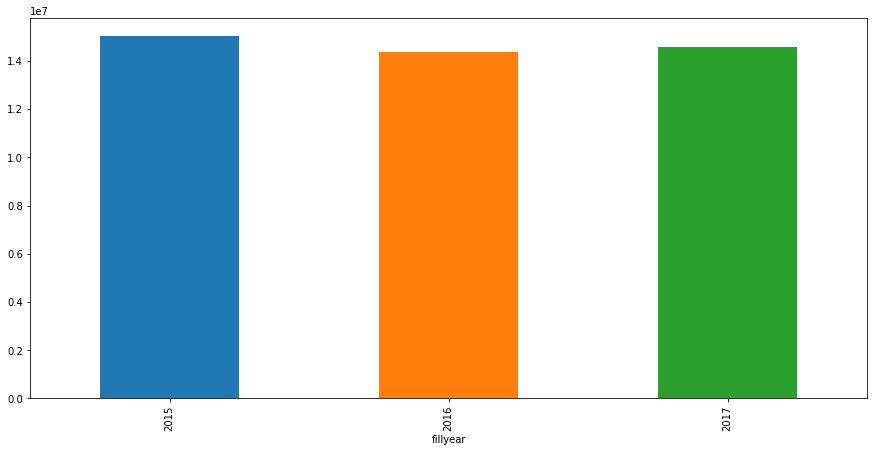

In [147]:
fig_g, ax_g = plt.subplots(figsize=(15,7))
df_yr.groupby(['fillyear'])['netplancost'].sum().plot(kind="bar", ax=ax_g)


# REGRESSION

In [46]:
# df_4 = df_2[df_2['memberid']==19962706]

df_3 = df_2[['netplancost', 'memberage',
             'gender_factor', 'state', 'calcawpfullprice']]

df_3['plancost_factor'] = df_3['netplancost'] * df_2['lasting_factor']
from scikit_scoring import get_regression_values, decision_tree_regressor_regressor
output = 'plancost_factor'

#### Decision Tree Model #####
y_predict = decision_tree_regressor_regressor(df_3, output)
for i in range(100):
    print("{0}".format(y_predict[i]))

#### Prints individual rows separately

# for x in np.nditer(predicted_y, order='C'):
#     print(x)


#### Regression Scores #####
# get_regression_values(df_3, output)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


columns:
Index(['plancost_factor', 'netplancost', 'calcawpfullprice', 'state',
       'memberage', 'gender_factor'],
      dtype='object')
correlation_map:
[[ 1.          0.8336578   0.80950408  0.02130775  0.01054845 -0.03865801]
 [ 0.8336578   1.          0.97026005  0.02578022  0.01349529 -0.03559025]
 [ 0.80950408  0.97026005  1.          0.02775434  0.01930792 -0.04408069]
 [ 0.02130775  0.02578022  0.02775434  1.         -0.03651471 -0.00248177]
 [ 0.01054845  0.01349529  0.01930792 -0.03651471  1.         -0.05943071]
 [-0.03865801 -0.03559025 -0.04408069 -0.00248177 -0.05943071  1.        ]]
         netplancost  calcawpfullprice          state      memberage  \
count  107000.000000     107000.000000  107000.000000  107000.000000   
mean      111.063388        216.130478       5.692944      45.374196   
std       593.986422        726.382401       9.467012      16.882076   
min         0.000000          0.000000       0.000000       1.000000   
25%         0.000000         31.6